In [1]:
#import libraries
import pandas as pd
import numpy as np
import pandas_ta as ta
import os
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, GRU, Dropout,Input
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

In [2]:
fundamental_folder = "data//fundamental"
fund_files = [file for file in os.listdir(fundamental_folder) if file.endswith("xlsx")]
fund_path = os.path.join(fundamental_folder, fund_files[0])
df1 = pd.read_excel(fund_path, index_col="Symbol")
# print(df1.head())

In [3]:
import os
import pandas_ta as ta

data_folder = "data/historical"  # Cleaned path

all_stocks = {}

# Load each stock's data
for file in os.listdir(data_folder):
    if file.endswith(".xlsx") and not file.startswith("~$"):
        symbol = os.path.splitext(file)[0]
        df = pd.read_excel(os.path.join(data_folder, file))
        all_stocks[symbol] = df

for symbol, df in all_stocks.items():
    df.columns = df.columns.str.strip()  # Clean column names
    df['RSI'] = ta.rsi(df['LTP'], length=14)
    macd = ta.macd(df['LTP'])
    df['MACD'] = macd['MACD_12_26_9']
    df['MACD_signal'] = macd['MACDs_12_26_9']
    all_stocks[symbol] = df  # Save back





In [4]:
import requests
from bs4 import BeautifulSoup

def fetch_nepse_headlines(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.text, 'html.parser')
    
    headlines = []
    for a in soup.find_all('a'):
        text = a.get_text(strip=True)
        if text and ('shares' in text.lower() or 'dividend' in text.lower() or 'bank' in text.lower()):
            headlines.append(text)
    
    return headlines[:10]  # limit to 10 for example

# Example: replace with a real NEPSE company news URL
url = 'https://www.sharesansar.com'
headlines = fetch_nepse_headlines(url)
print(headlines)


['Proposed Dividend', 'Merchant Bankers', 'Commercial Banks', 'Dividend Calculator', '8% Bonus Shares of Prabhu Mahalaxmi Life Insurance Listed in NEPSE', 'NIC ASIA Bank Empowers Global Tourists with NepalPay QR via Alipay+ Integration', 'Nepal SBI Bank To Issue Rs. 3 Arba Worth "7% Nepal SBI Bank Debenture 2090" from Ashadh 30', 'Bungal Hydro Limited Issuing IPO Shares to Locals of Bajhang District And Nepalese Employed Abroad From Ashadh 29', "Right Alert! Issue of 1:0.50 Right Shares of People's Power Opening from Today", 'Mabilung Energy Opening IPO Shares to Locals of Sankhuwasabha District and Nepalese Employed Abroad From Today']


In [5]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# -------------------------------
# Load FinBERT Model
# -------------------------------
tokenizer = AutoTokenizer.from_pretrained("yiyanghkust/finbert-tone")
model = AutoModelForSequenceClassification.from_pretrained("yiyanghkust/finbert-tone")

# -------------------------------
# Define sentiment function
# -------------------------------
def get_sentiment(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True)
    outputs = model(**inputs)
    probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
    sentiment = torch.argmax(probs).item()
    label_map = {0: "negative", 1: "neutral", 2: "positive"}
    return label_map[sentiment]

# -------------------------------
# Web scraping function
# -------------------------------
def fetch_nepse_headlines(url):
    headers = {'User-Agent': 'Mozilla/5.0'}  # prevent blocking
    response = requests.get(url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')
    
    headlines = []
    for a in soup.find_all('a'):
        text = a.get_text(strip=True)
        if text and any(keyword in text.lower() for keyword in ['shares', 'dividend', 'bank', 'ipo', 'capital', 'right issue']):
            headlines.append(text)
    
    return headlines[:10]  # Limit to 10 for performance

# -------------------------------
# Fetch and analyze headlines
# -------------------------------
url = 'https://www.sharesansar.com'
headlines = fetch_nepse_headlines(url)

if not headlines:
    print("⚠️ No relevant headlines found.")
    sentiment_score = 0
else:
    news_df = pd.DataFrame({"headline": headlines})
    news_df["sentiment"] = news_df["headline"].map(get_sentiment)

    sentiment_score = (news_df["sentiment"] == "positive").sum() - (news_df["sentiment"] == "negative").sum()

    print(news_df)
    print("🧠 Sentiment score for NEPSE news:", sentiment_score)





Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


                                            headline sentiment
0                                Capital Expenditure  negative
1                                  Proposed Dividend  negative
2                                            IPO/FPO  negative
3                               Check IPO/FPO Result  negative
4                                       IPO/FPO News  negative
5                             IPO/FPO Allotment News  negative
6                                   Merchant Bankers  negative
7                                   Commercial Banks  negative
8                                Dividend Calculator  negative
9  8% Bonus Shares of Prabhu Mahalaxmi Life Insur...  negative
🧠 Sentiment score for NEPSE news: -10


In [5]:
#train GRU model
sentiment_score = -10

# Create model output directories
model_dir = "allsavedmodels/gru_fundamental"
test_data_dir = "test_data"
os.makedirs(model_dir, exist_ok=True)
os.makedirs(test_data_dir, exist_ok=True)

# Label encode Sector
sector_encoder = LabelEncoder()
if isinstance(df1, pd.DataFrame) and 'Sector' in df1.columns:
    sector_encoder.fit(df1['Sector'].dropna().astype(str))
else:
    raise ValueError("df1 must be a DataFrame with a 'Sector' column.")

for symbol, data in all_stocks.items():
    if symbol not in df1.index:
        print(f"⚠️ Skipping {symbol.upper()}: No fundamental data.")
        continue

    model_path = os.path.join(model_dir, f"{symbol.upper()}_GRU.keras")
    scaler_path = os.path.join(model_dir, f"{symbol.upper()}_scaler.save")
    y_scaler_path = os.path.join(model_dir, f"{symbol.upper()}_y_scaler.save")
    x_test_path = os.path.join(test_data_dir, f"{symbol}_X_test.npy")
    y_test_path = os.path.join(test_data_dir, f"{symbol}_y_test.npy")

    # Skip if already trained
    if all(os.path.exists(p) for p in [model_path, scaler_path, y_scaler_path, x_test_path, y_test_path]):
        print(f"⏩ {symbol.upper()}: Model and test data saved")
        continue

    df = data.copy()
    df.columns = df.columns.str.strip()

    # ✅ Add technical indicators
    df['RSI'] = ta.rsi(df['LTP'], length=14)
    macd = ta.macd(df['LTP'])
    df['MACD'] = macd['MACD_12_26_9']
    df['MACD_signal'] = macd['MACDs_12_26_9']

    # ✅ Add fundamental data
    fundamentals = df1.loc[symbol]
    for col in ['Sector', 'Sharesoutstanding', 'EPS', 'P/E_ratio', 'bookvalue', 'PBV']:
        df[col.upper()] = fundamentals[col]
    df['SECTOR'] = sector_encoder.transform([fundamentals['Sector']])[0]
    df['SENTIMENT_SCORE'] = sentiment_score

    # Drop rows with NaNs in required columns
    required_cols = [
        'LTP', '% Change', 'High', 'Low', 'Open', 'Qty.', 'Turnover',
        'SECTOR', 'EPS', 'P/E_RATIO', 'BOOKVALUE', 'PBV', 'SHARESOUTSTANDING',
        'RSI', 'MACD', 'MACD_signal'
    ]
    df.dropna(subset=required_cols, inplace=True)

    # Add target variable
    df['Target_LTP'] = df['LTP'].shift(-1)
    df.dropna(subset=['Target_LTP'], inplace=True)

    features = [
        '% Change', 'High', 'Low', 'Open', 'Qty.', 'Turnover',
        'SECTOR', 'EPS', 'P/E_RATIO', 'BOOKVALUE', 'PBV',
        'SHARESOUTSTANDING', 'SENTIMENT_SCORE', 'RSI', 'MACD', 'MACD_signal'
    ]

    X = df[features].astype(float).values
    y = df['Target_LTP'].astype(float).values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # ✅ Scale input features
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # ✅ Scale output y values
    y_scaler = MinMaxScaler()
    y_train_scaled = y_scaler.fit_transform(y_train.reshape(-1, 1))
    y_test_scaled = y_scaler.transform(y_test.reshape(-1, 1))

    # Reshape for GRU
    X_train_scaled = np.expand_dims(X_train_scaled, axis=1)
    X_test_scaled = np.expand_dims(X_test_scaled, axis=1)

    # ✅ Define deeper GRU model
    model = Sequential([
        Input(shape=(1, X_train_scaled.shape[2])),
        GRU(64, return_sequences=True),
        Dropout(0.2),
        GRU(32),
        Dense(16, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mse')
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Train model
    history = model.fit(
        X_train_scaled, y_train_scaled,
        validation_split=0.2,
        epochs=110,
        batch_size=32,
        verbose=0,
        callbacks=[early_stop]
    )

    # Evaluate
    test_loss = model.evaluate(X_test_scaled, y_test_scaled, verbose=0)
    print(f"📊 {symbol.upper()} Test MSE: {test_loss:.6f}")

    # ✅ Save model + scalers
    model.save(model_path)
    joblib.dump(scaler, scaler_path)
    joblib.dump(y_scaler, y_scaler_path)
    print(f"✅ {symbol.upper()} GRU model & scalers saved.")

    np.save(x_test_path, X_test)
    np.save(y_test_path, y_test)
    print(f"✅ {symbol.upper()} Test data saved.")


⏩ ACLBSL: Model and test data saved
⏩ ADBL: Model and test data saved
⏩ AHL: Model and test data saved
⏩ AHPC: Model and test data saved
⏩ AKJCL: Model and test data saved
⏩ AKPL: Model and test data saved
⏩ ALBSL: Model and test data saved
⏩ ALICL: Model and test data saved
⏩ ANLB: Model and test data saved
⏩ API: Model and test data saved
⏩ AVYAN: Model and test data saved
⏩ BARUN: Model and test data saved
⏩ BBC: Model and test data saved
⏩ BEDC: Model and test data saved
⏩ BFC: Model and test data saved
⏩ BGWT: Model and test data saved
⏩ BHDC: Model and test data saved
⏩ BHL: Model and test data saved
⏩ BHPL: Model and test data saved
⏩ BNHC: Model and test data saved
⏩ BNL: Model and test data saved
⏩ BPCL: Model and test data saved
⏩ CBBL: Model and test data saved
⏩ CFCL: Model and test data saved
⏩ CGH: Model and test data saved
⏩ CHCL: Model and test data saved
⏩ CHDC: Model and test data saved
⏩ CHL: Model and test data saved
⏩ CIT: Model and test data saved
⏩ CITY: Model an

✅ ACLBSL → Predicted LTP: 643.84


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for aclbsl:
  MAE: 47.61
  RMSE: 51.89
  R2: -0.792
  MAPE: 8.18%


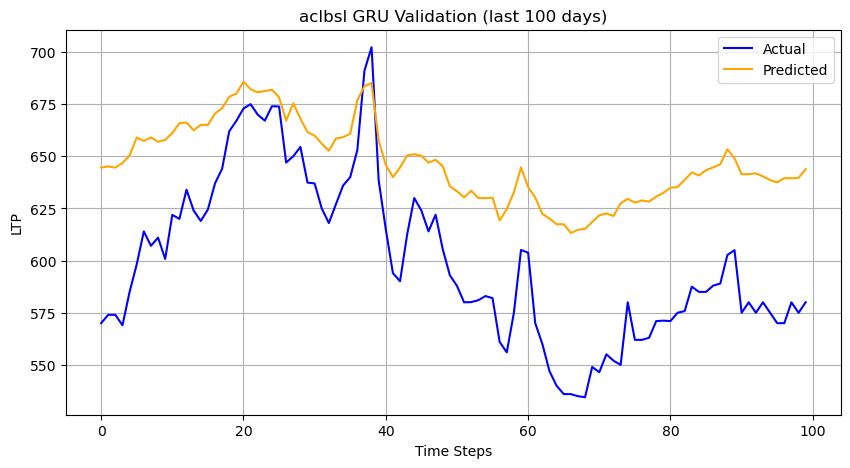

✅ Saved plot for aclbsl to plots/radhi.png
✅ ADBL → Predicted LTP: 245.70


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for adbl:
  MAE: 3.56
  RMSE: 5.04
  R2: 0.824
  MAPE: 1.47%


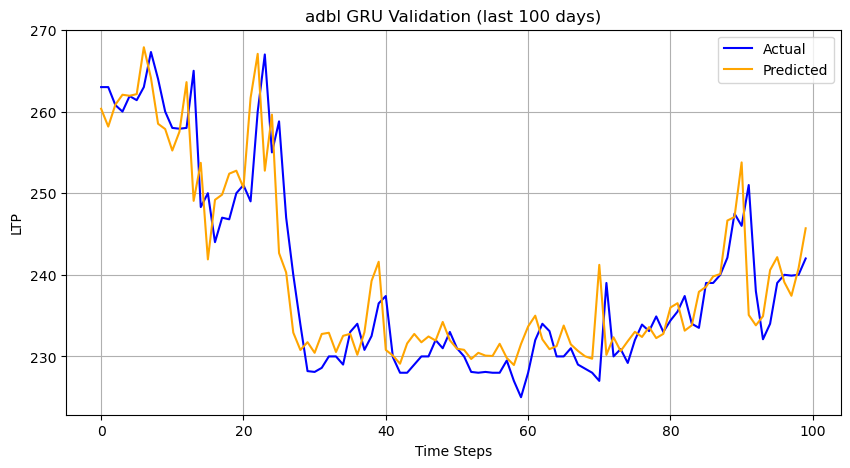

✅ Saved plot for adbl to plots/radhi.png
✅ AHL → Predicted LTP: 431.41


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ahl:
  MAE: 12.60
  RMSE: 15.75
  R2: 0.678
  MAPE: 3.52%


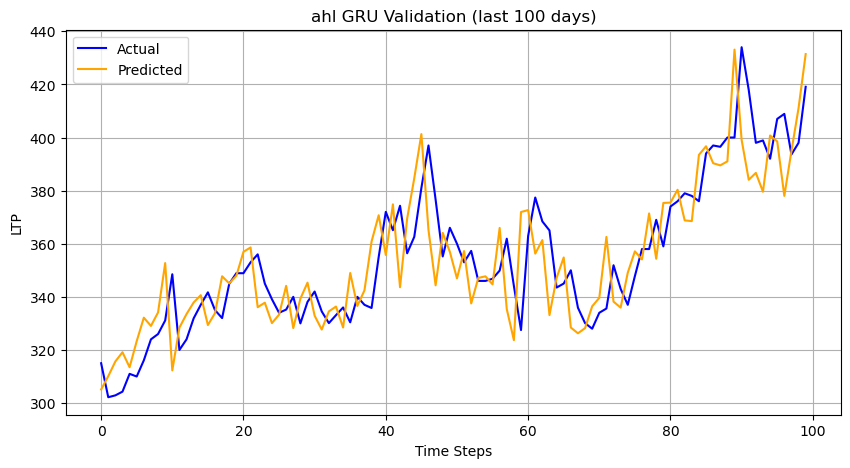

✅ Saved plot for ahl to plots/radhi.png
✅ AHPC → Predicted LTP: 292.73


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ahpc:
  MAE: 5.11
  RMSE: 6.85
  R2: 0.938
  MAPE: 1.88%


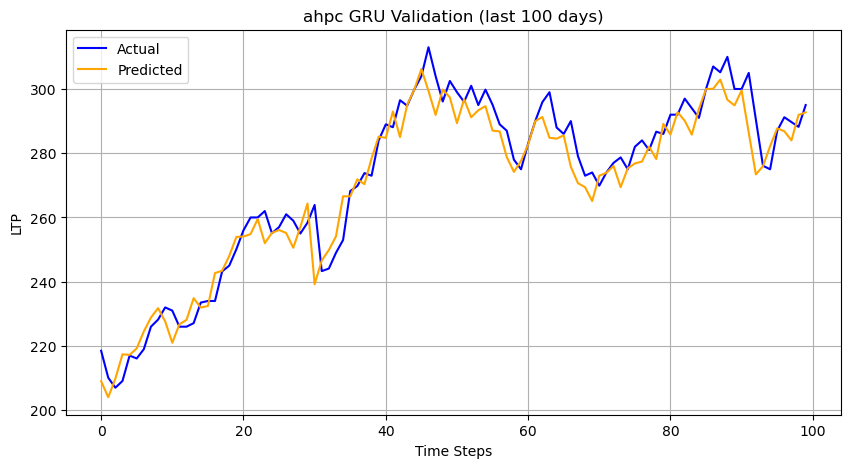

✅ Saved plot for ahpc to plots/radhi.png
✅ AKJCL → Predicted LTP: 168.75


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for akjcl:
  MAE: 35.05
  RMSE: 38.59
  R2: -3.142
  MAPE: 16.70%


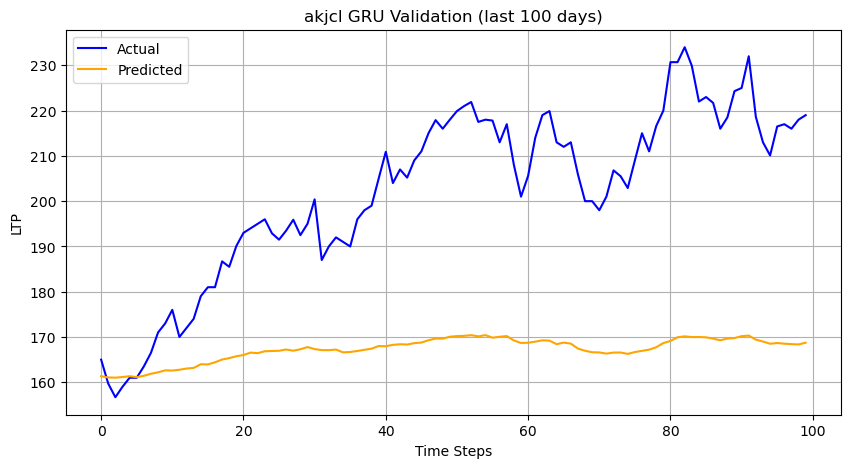

✅ Saved plot for akjcl to plots/radhi.png
✅ AKPL → Predicted LTP: 383.84


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for akpl:
  MAE: 7.13
  RMSE: 9.19
  R2: 0.985
  MAPE: 2.16%


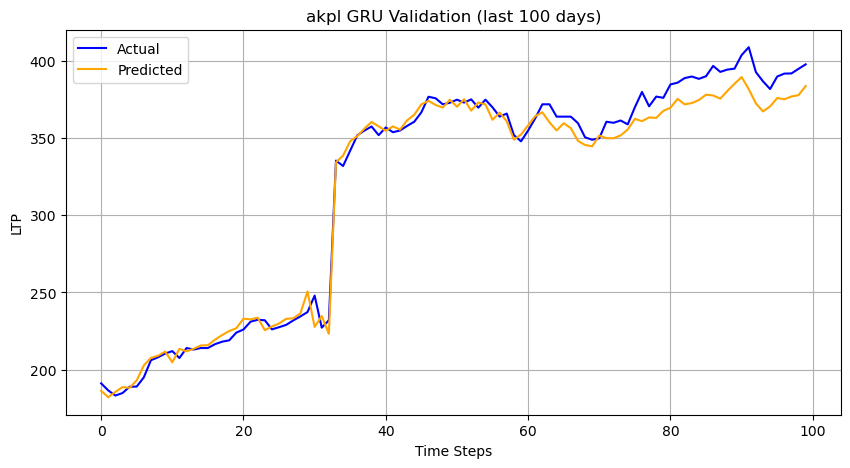

✅ Saved plot for akpl to plots/radhi.png
✅ ALBSL → Predicted LTP: 665.89


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for albsl:
  MAE: 48.64
  RMSE: 57.78
  R2: -0.449
  MAPE: 6.44%


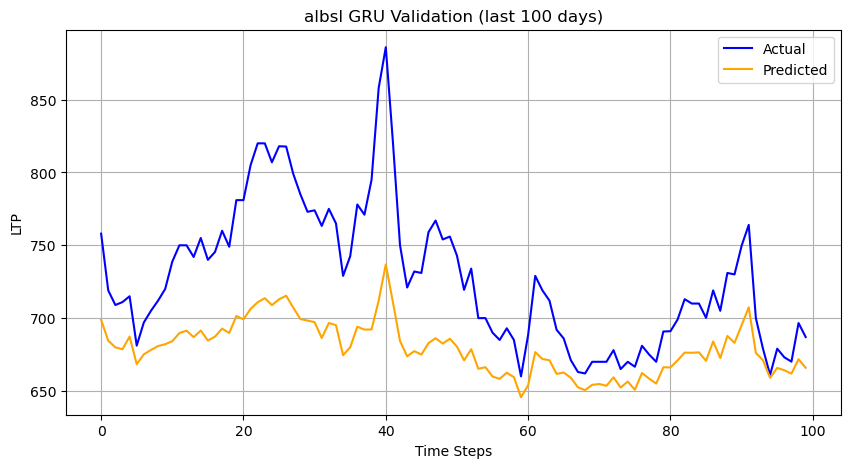

✅ Saved plot for albsl to plots/radhi.png
✅ ALICL → Predicted LTP: 606.43


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for alicl:
  MAE: 10.91
  RMSE: 14.50
  R2: 0.964
  MAPE: 1.69%


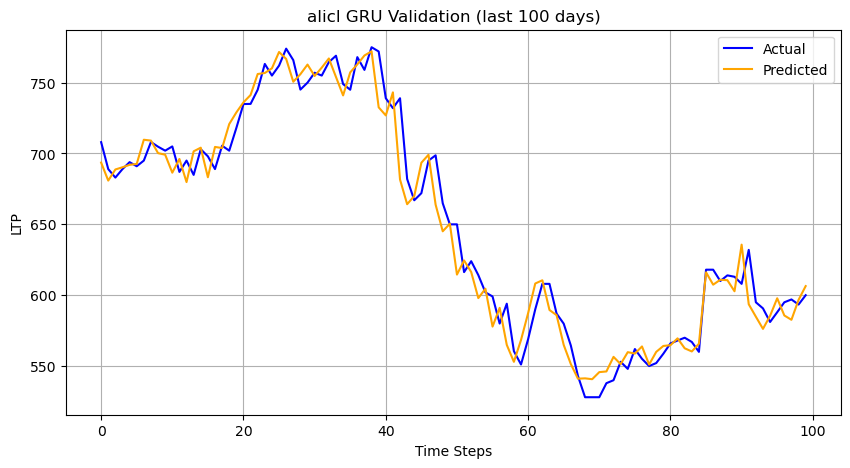

✅ Saved plot for alicl to plots/radhi.png
✅ ANLB → Predicted LTP: 1597.49


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for anlb:
  MAE: 209.22
  RMSE: 364.31
  R2: 0.556
  MAPE: 24.66%


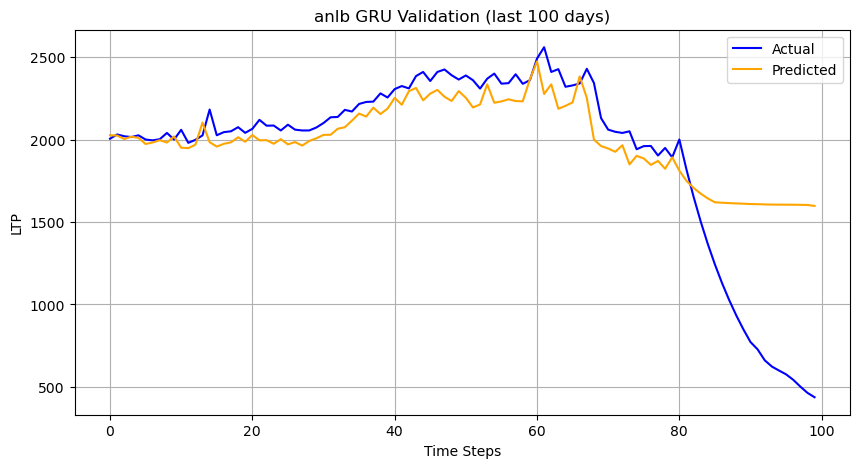

✅ Saved plot for anlb to plots/radhi.png
✅ API → Predicted LTP: 259.93


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for api:
  MAE: 4.41
  RMSE: 5.61
  R2: 0.953
  MAPE: 1.95%


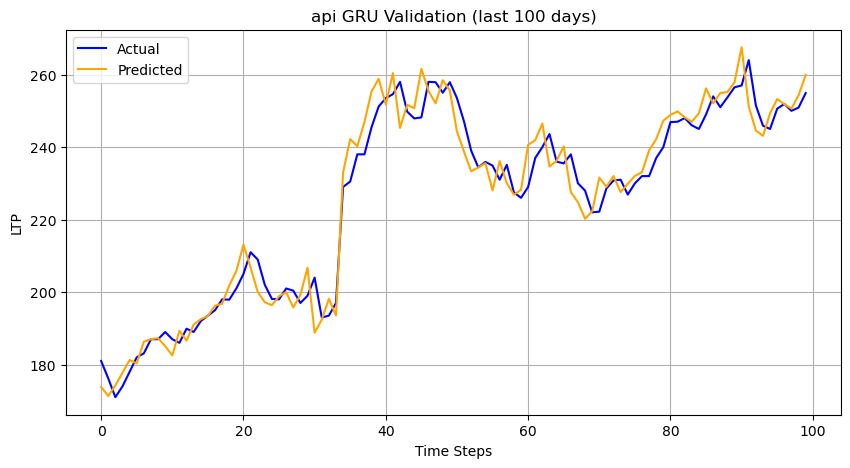

✅ Saved plot for api to plots/radhi.png
✅ AVYAN → Predicted LTP: 616.25


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for avyan:
  MAE: 19.43
  RMSE: 28.21
  R2: 0.809
  MAPE: 2.85%


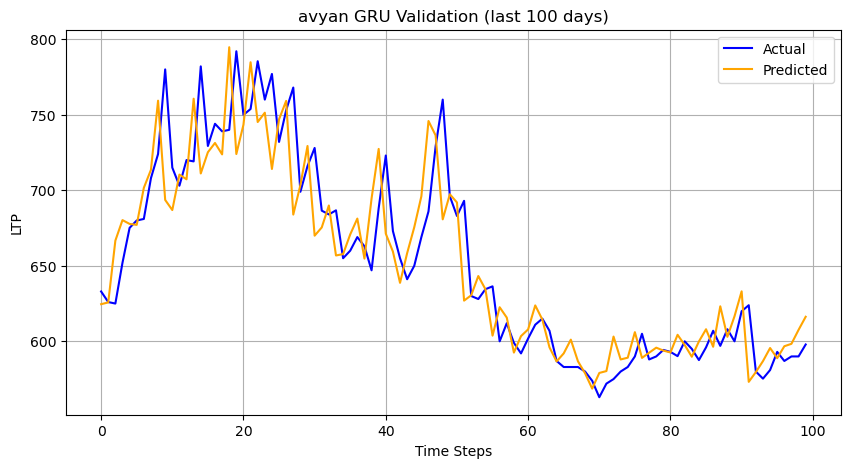

✅ Saved plot for avyan to plots/radhi.png
✅ BARUN → Predicted LTP: 258.28


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for barun:
  MAE: 5.92
  RMSE: 7.68
  R2: 0.716
  MAPE: 2.38%


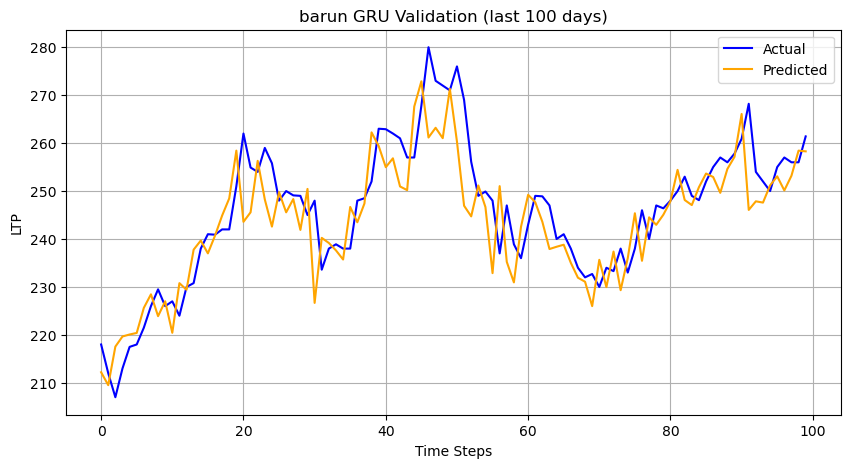

✅ Saved plot for barun to plots/radhi.png
✅ BBC → Predicted LTP: 3430.92


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bbc:
  MAE: 163.57
  RMSE: 193.07
  R2: 0.689
  MAPE: 4.92%


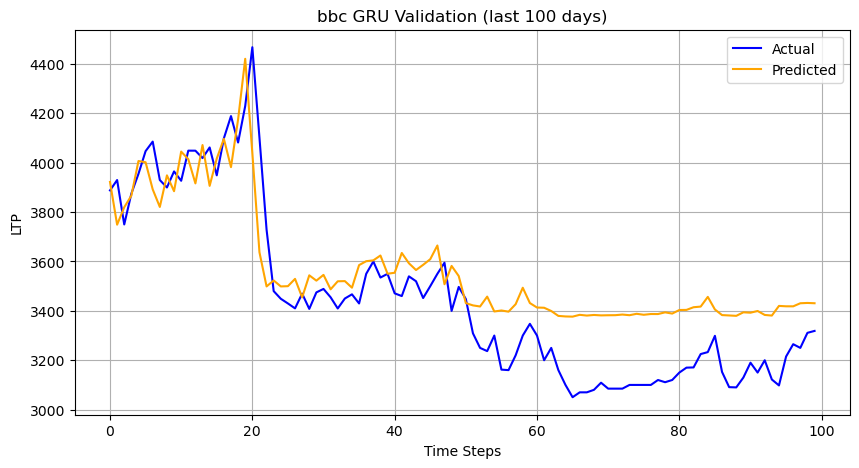

✅ Saved plot for bbc to plots/radhi.png
✅ BEDC → Predicted LTP: 241.02


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bedc:
  MAE: 23.15
  RMSE: 26.42
  R2: 0.227
  MAPE: 11.27%


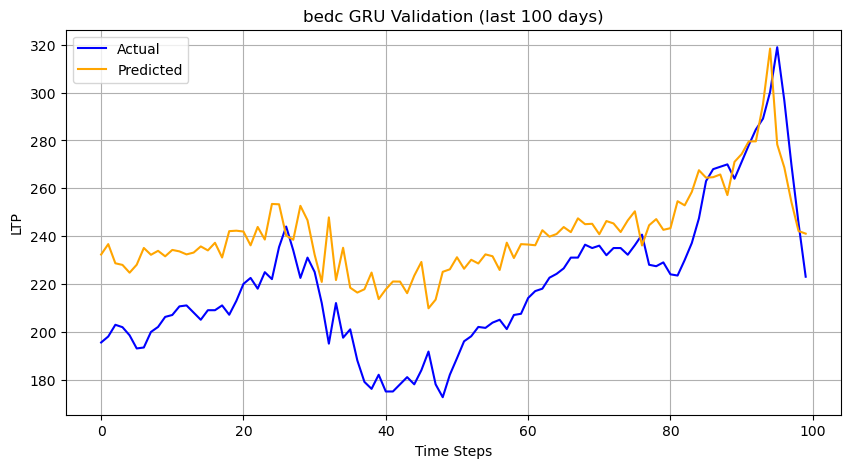

✅ Saved plot for bedc to plots/radhi.png
✅ BFC → Predicted LTP: 327.66


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bfc:
  MAE: 14.27
  RMSE: 16.13
  R2: 0.291
  MAPE: 4.47%


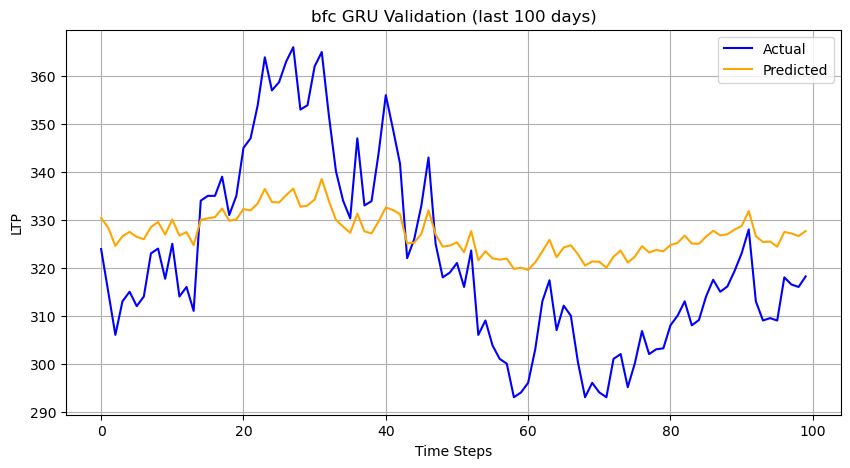

✅ Saved plot for bfc to plots/radhi.png
✅ BGWT → Predicted LTP: 615.90


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bgwt:
  MAE: 103.50
  RMSE: 129.96
  R2: -0.931
  MAPE: 23.61%


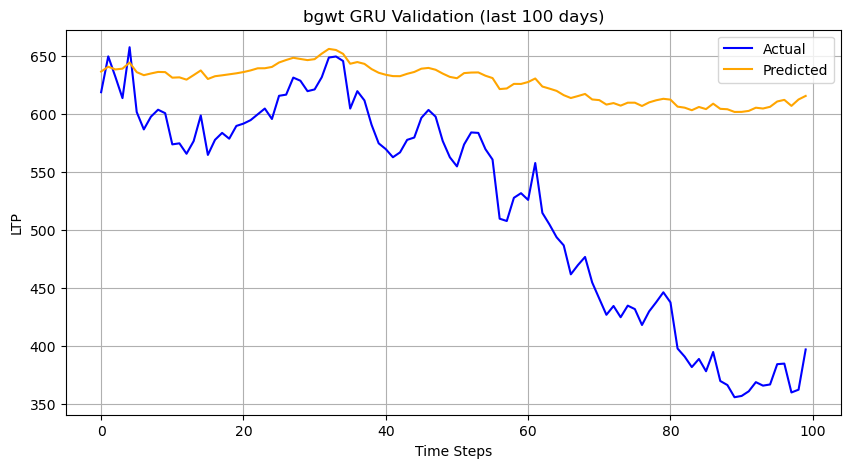

✅ Saved plot for bgwt to plots/radhi.png
✅ BHDC → Predicted LTP: 358.84


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bhdc:
  MAE: 39.68
  RMSE: 44.87
  R2: -0.982
  MAPE: 9.88%


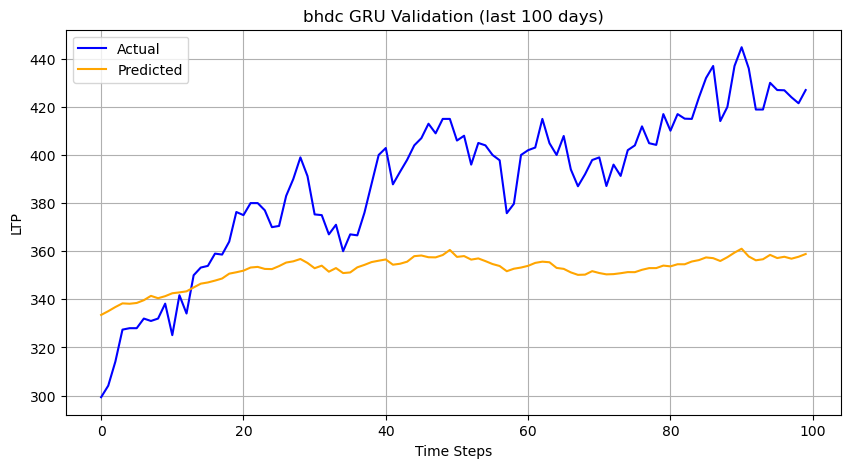

✅ Saved plot for bhdc to plots/radhi.png
✅ BHL → Predicted LTP: 260.43


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bhl:
  MAE: 31.86
  RMSE: 36.46
  R2: -0.533
  MAPE: 10.91%


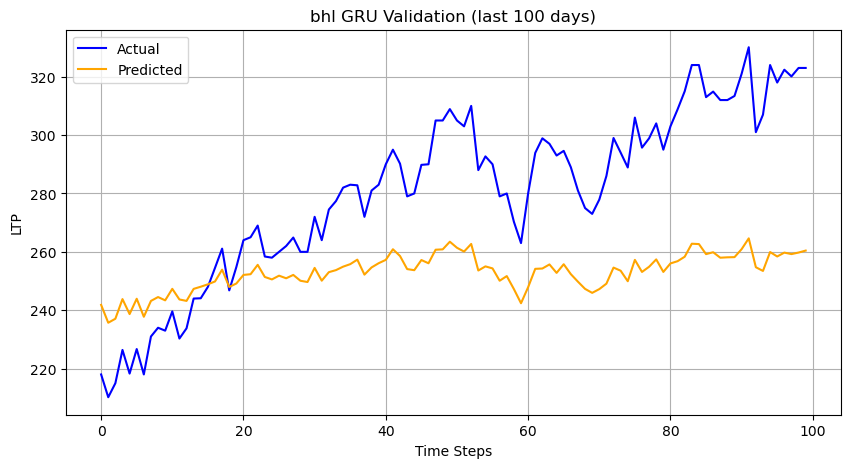

✅ Saved plot for bhl to plots/radhi.png
✅ BHPL → Predicted LTP: 495.59


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bhpl:
  MAE: 14.20
  RMSE: 18.39
  R2: 0.451
  MAPE: 2.98%


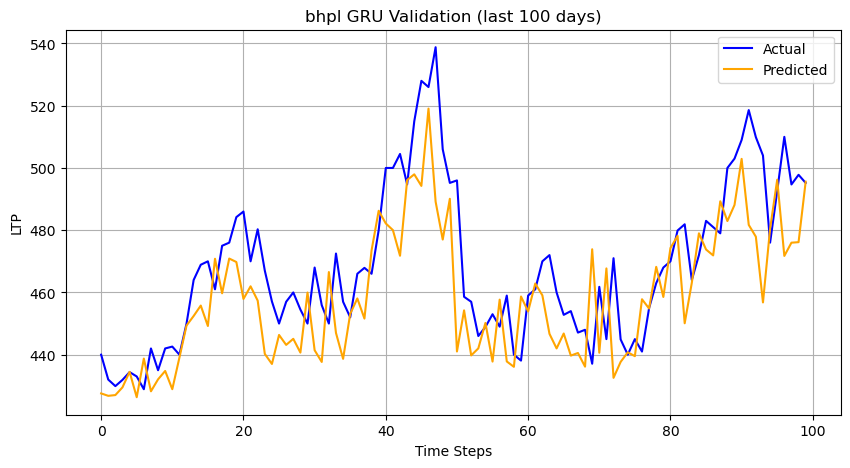

✅ Saved plot for bhpl to plots/radhi.png
✅ BNHC → Predicted LTP: 365.80


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bnhc:
  MAE: 23.23
  RMSE: 26.29
  R2: 0.403
  MAPE: 6.44%


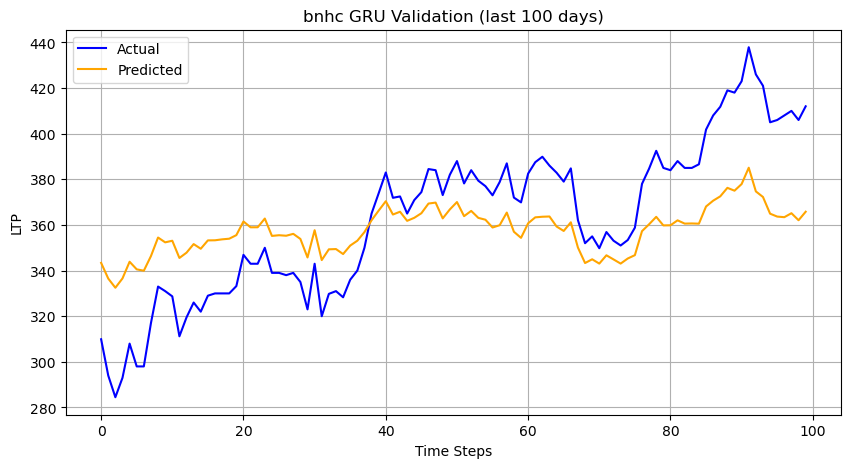

✅ Saved plot for bnhc to plots/radhi.png
✅ BNL → Predicted LTP: 12288.93


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bnl:
  MAE: 3088.11
  RMSE: 5017.61
  R2: 0.373
  MAPE: 104.78%


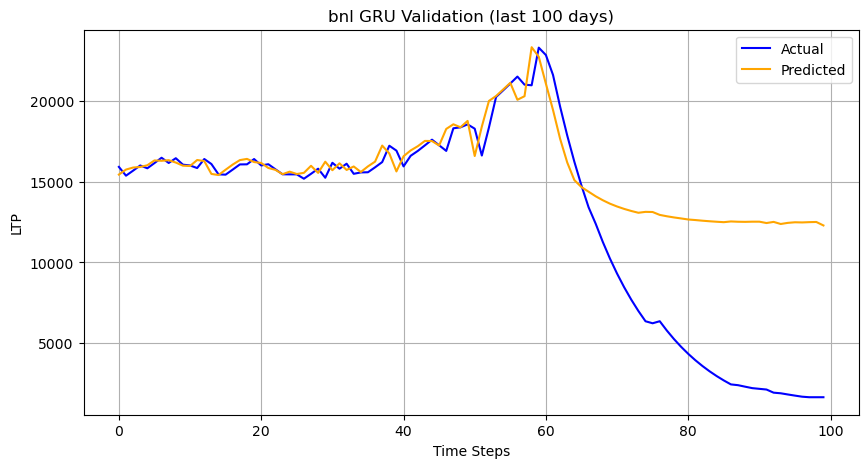

✅ Saved plot for bnl to plots/radhi.png
✅ BPCL → Predicted LTP: 317.54


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for bpcl:
  MAE: 4.19
  RMSE: 5.58
  R2: 0.759
  MAPE: 1.29%


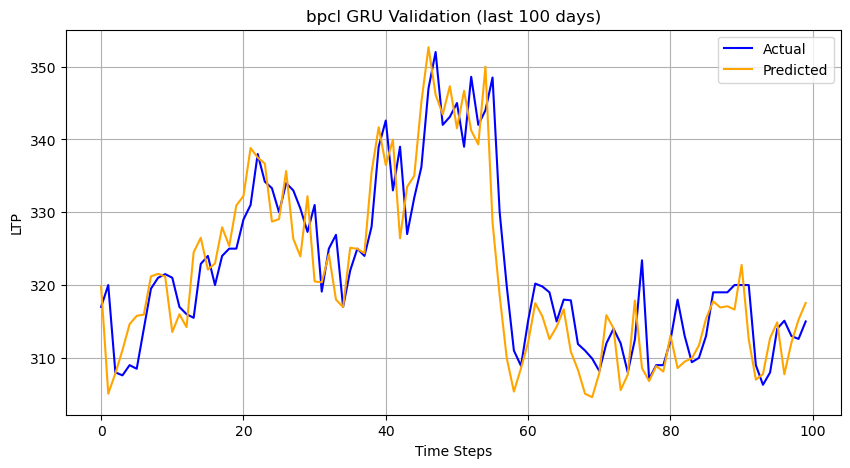

✅ Saved plot for bpcl to plots/radhi.png
✅ CBBL → Predicted LTP: 806.93


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for cbbl:
  MAE: 14.83
  RMSE: 19.53
  R2: 0.939
  MAPE: 1.71%


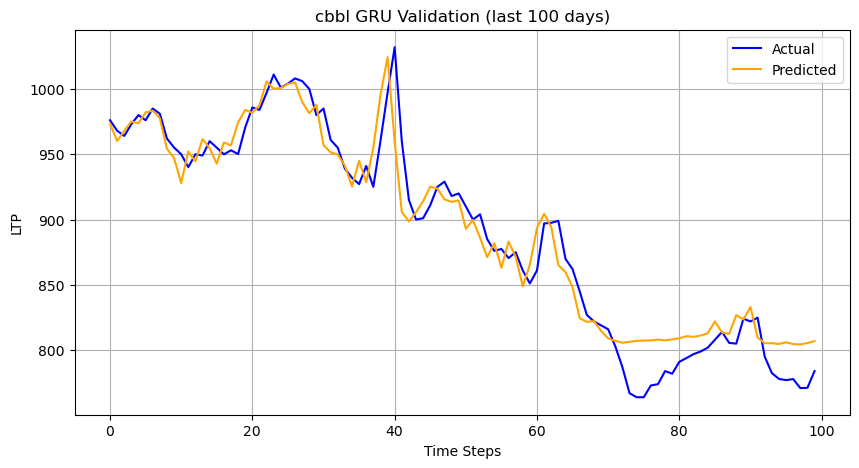

✅ Saved plot for cbbl to plots/radhi.png
✅ CFCL → Predicted LTP: 317.18


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for cfcl:
  MAE: 9.79
  RMSE: 12.97
  R2: 0.882
  MAPE: 2.90%


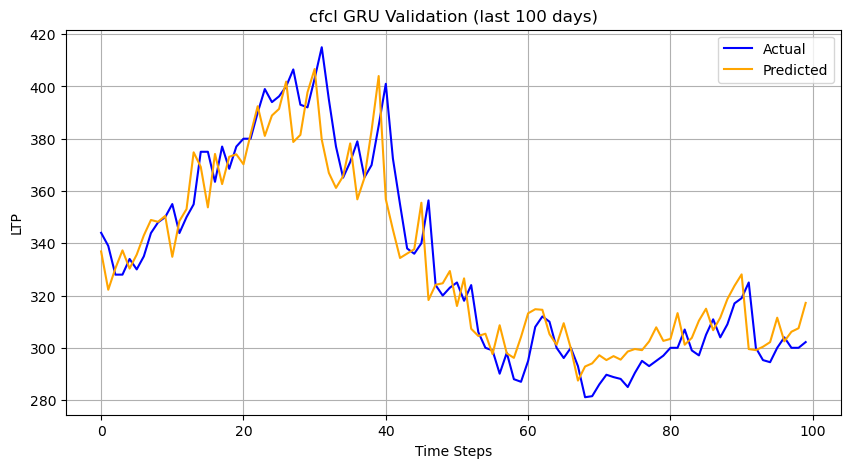

✅ Saved plot for cfcl to plots/radhi.png
✅ CGH → Predicted LTP: 1124.77


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for cgh:
  MAE: 26.74
  RMSE: 36.06
  R2: 0.901
  MAPE: 2.20%


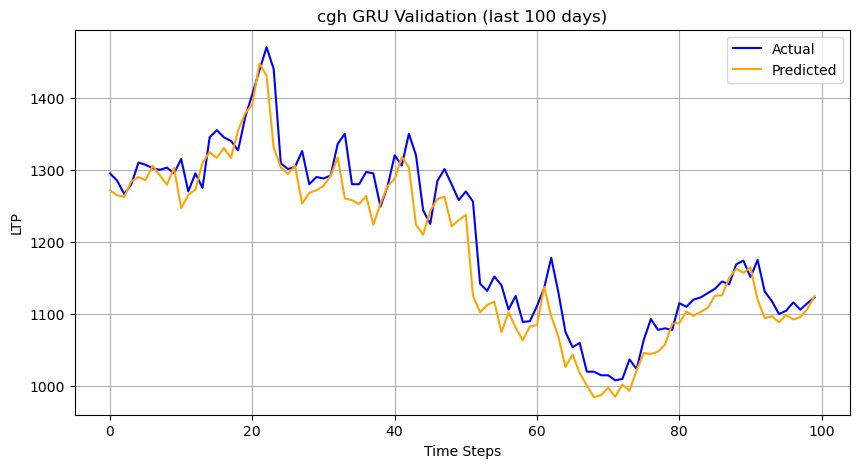

✅ Saved plot for cgh to plots/radhi.png
✅ CHCL → Predicted LTP: 479.47


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for chcl:
  MAE: 7.61
  RMSE: 9.62
  R2: 0.930
  MAPE: 1.47%


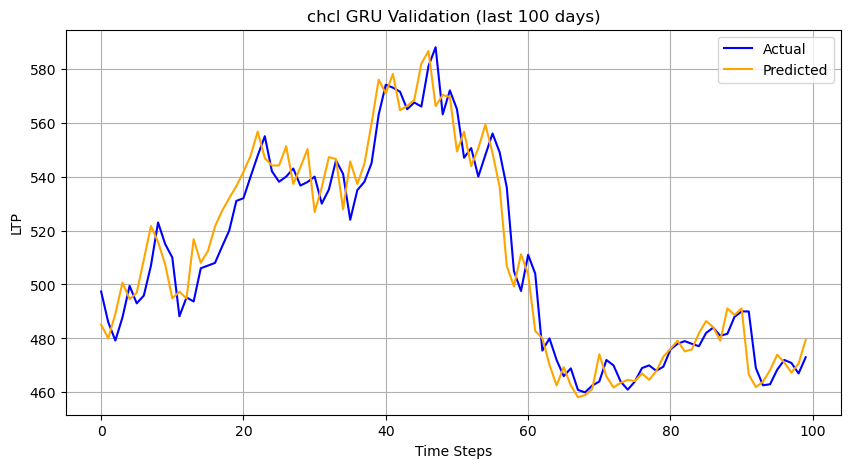

✅ Saved plot for chcl to plots/radhi.png
✅ CHDC → Predicted LTP: 746.49


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for chdc:
  MAE: 18.11
  RMSE: 24.50
  R2: 0.961
  MAPE: 2.11%


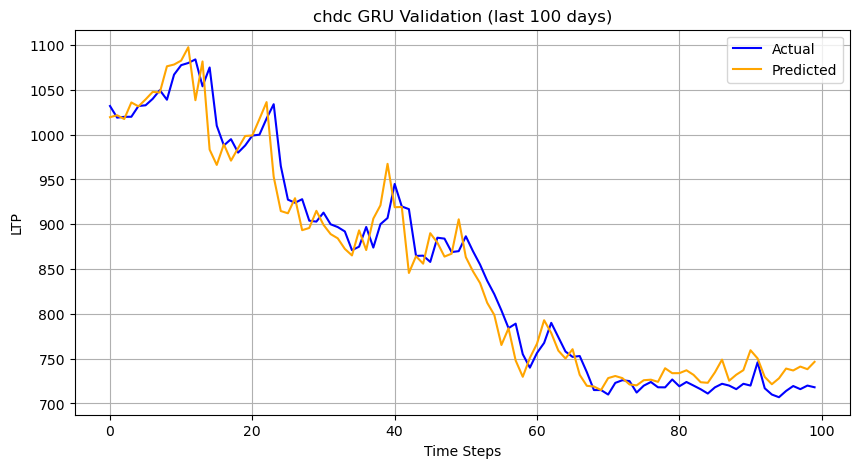

✅ Saved plot for chdc to plots/radhi.png
✅ CHL → Predicted LTP: 324.01


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for chl:
  MAE: 9.87
  RMSE: 12.28
  R2: 0.787
  MAPE: 3.68%


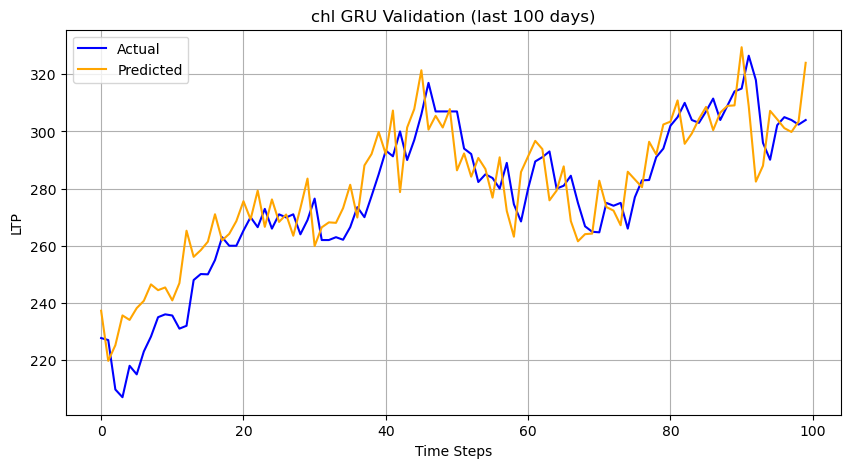

✅ Saved plot for chl to plots/radhi.png
✅ CIT → Predicted LTP: 2061.13


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for cit:
  MAE: 27.22
  RMSE: 40.77
  R2: 0.953
  MAPE: 1.23%


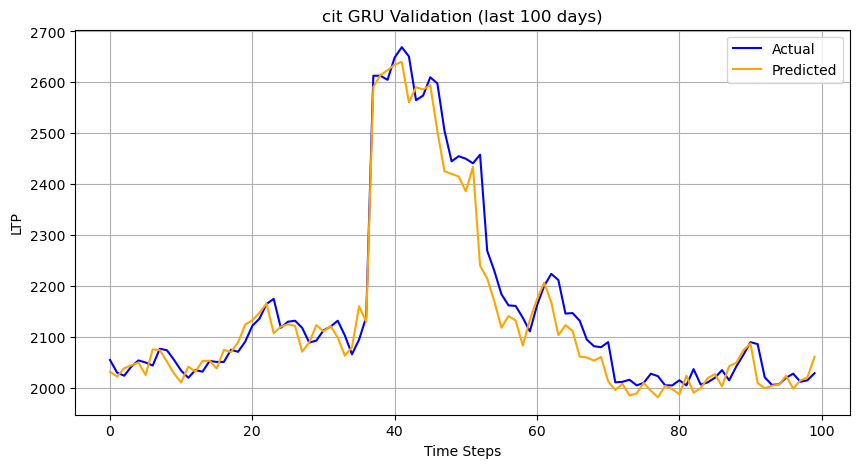

✅ Saved plot for cit to plots/radhi.png
✅ CITY → Predicted LTP: 525.54


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for city:
  MAE: 108.12
  RMSE: 141.65
  R2: 0.186
  MAPE: 31.88%


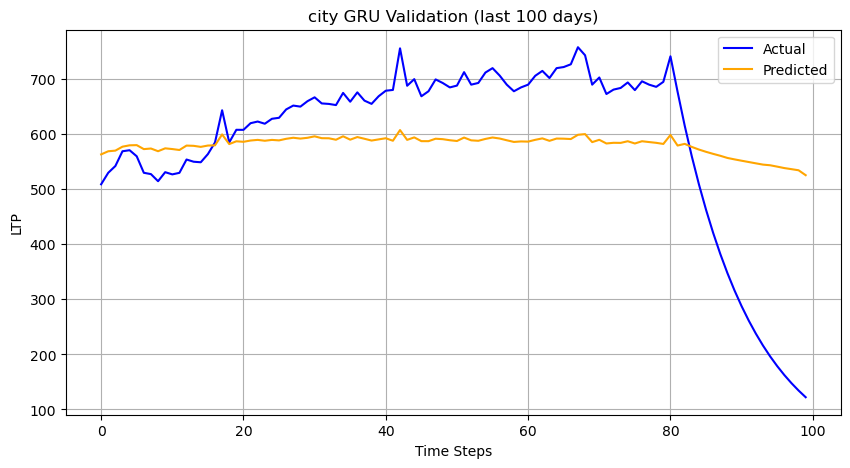

✅ Saved plot for city to plots/radhi.png
✅ CLI → Predicted LTP: 449.14


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for cli:
  MAE: 27.78
  RMSE: 36.61
  R2: 0.193
  MAPE: 5.98%


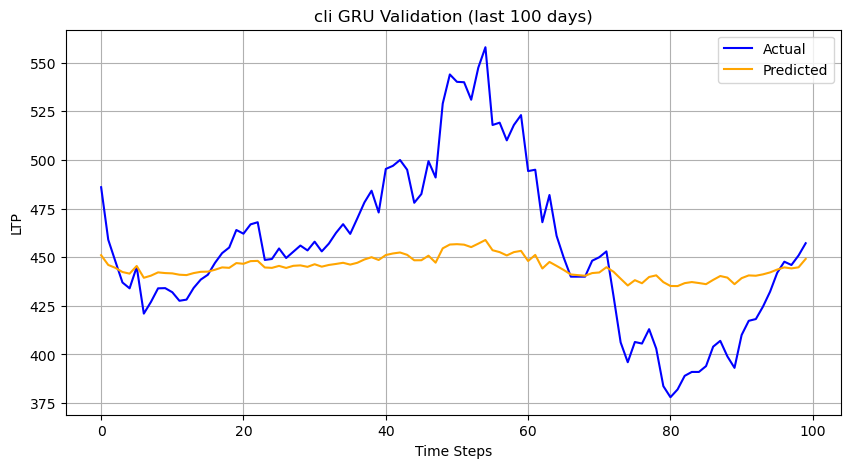

✅ Saved plot for cli to plots/radhi.png
✅ CORBL → Predicted LTP: 303.64


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for corbl:
  MAE: 12.36
  RMSE: 20.14
  R2: 0.457
  MAPE: 3.72%


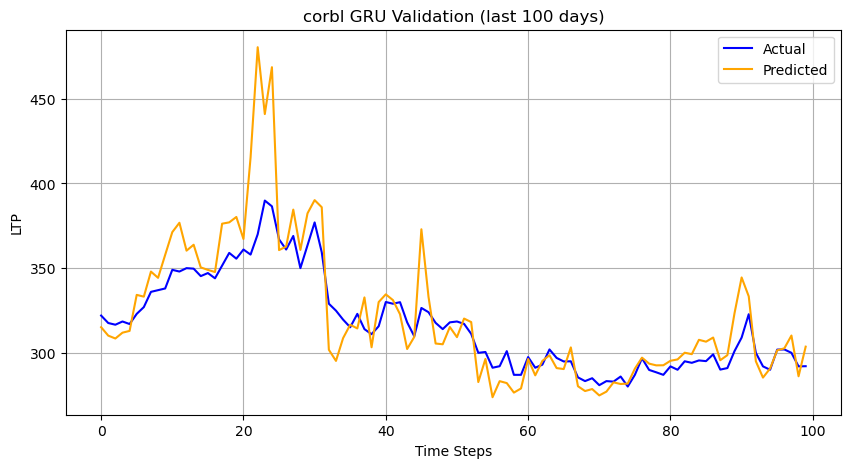

✅ Saved plot for corbl to plots/radhi.png
✅ CYCL → Predicted LTP: 1051.72


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for cycl:
  MAE: 492.23
  RMSE: 605.19
  R2: -1.046
  MAPE: 26.01%


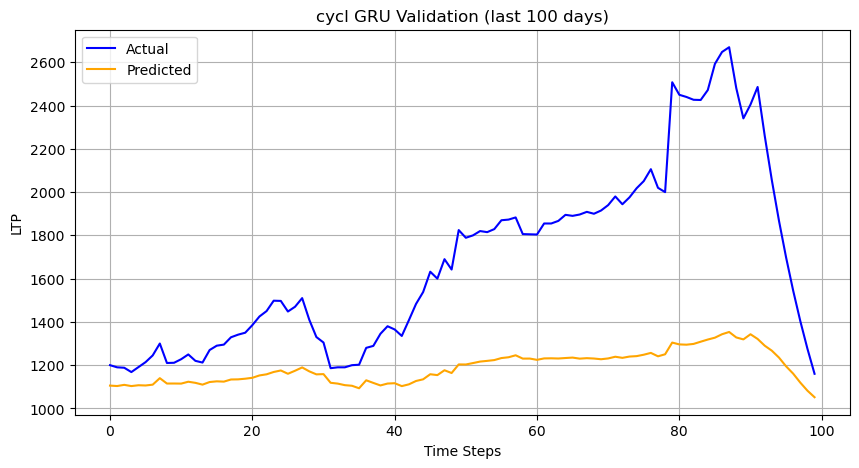

✅ Saved plot for cycl to plots/radhi.png
✅ CZBIL → Predicted LTP: 181.74


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for czbil:
  MAE: 6.54
  RMSE: 7.43
  R2: 0.127
  MAPE: 3.77%


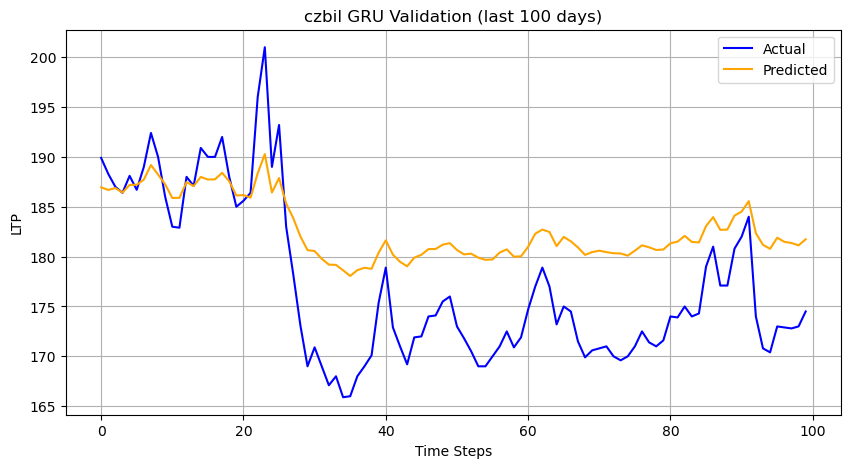

✅ Saved plot for czbil to plots/radhi.png
✅ DDBL → Predicted LTP: 697.22


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ddbl:
  MAE: 17.81
  RMSE: 23.45
  R2: 0.875
  MAPE: 2.51%


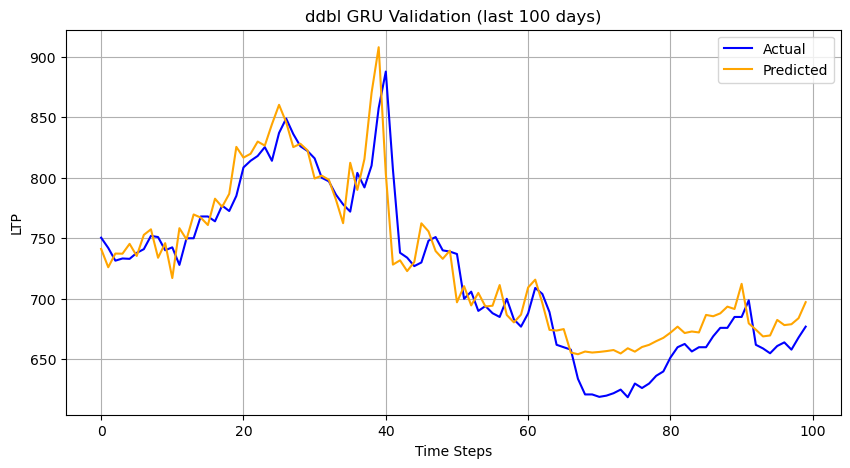

✅ Saved plot for ddbl to plots/radhi.png
✅ DHPL → Predicted LTP: 226.81


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for dhpl:
  MAE: 6.35
  RMSE: 7.91
  R2: 0.824
  MAPE: 3.36%


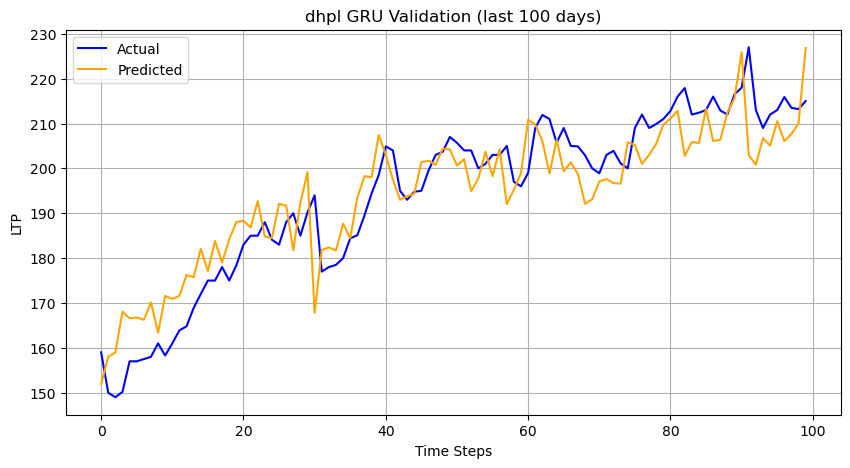

✅ Saved plot for dhpl to plots/radhi.png
✅ DLBS → Predicted LTP: 1071.16


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for dlbs:
  MAE: 121.15
  RMSE: 131.58
  R2: 0.384
  MAPE: 15.38%


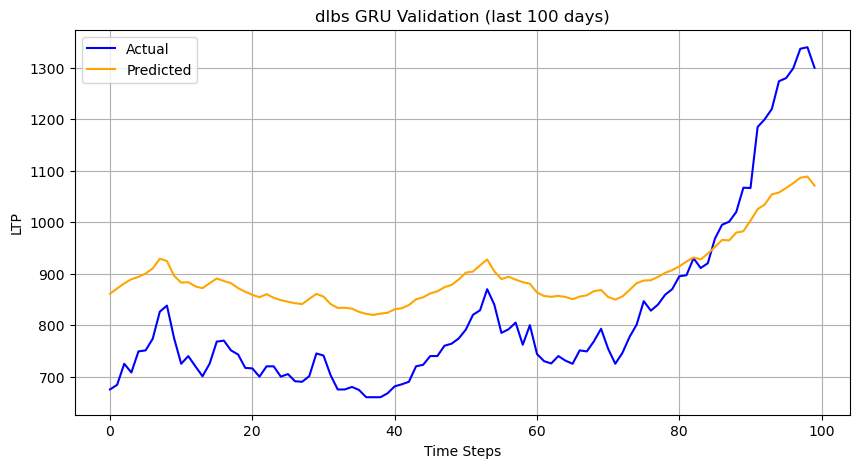

✅ Saved plot for dlbs to plots/radhi.png
✅ DOLTI → Predicted LTP: 289.43


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for dolti:
  MAE: 40.80
  RMSE: 41.96
  R2: -1.090
  MAPE: 18.72%


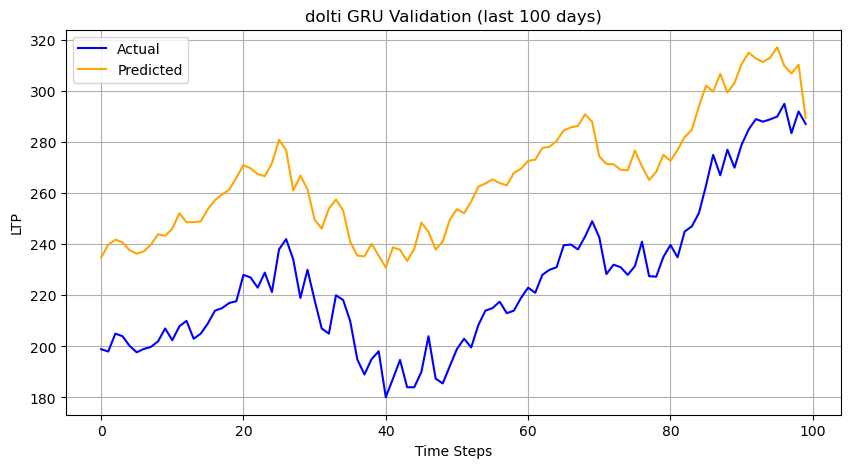

✅ Saved plot for dolti to plots/radhi.png
✅ DORDI → Predicted LTP: 340.31


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for dordi:
  MAE: 46.89
  RMSE: 47.96
  R2: -3.082
  MAPE: 18.34%


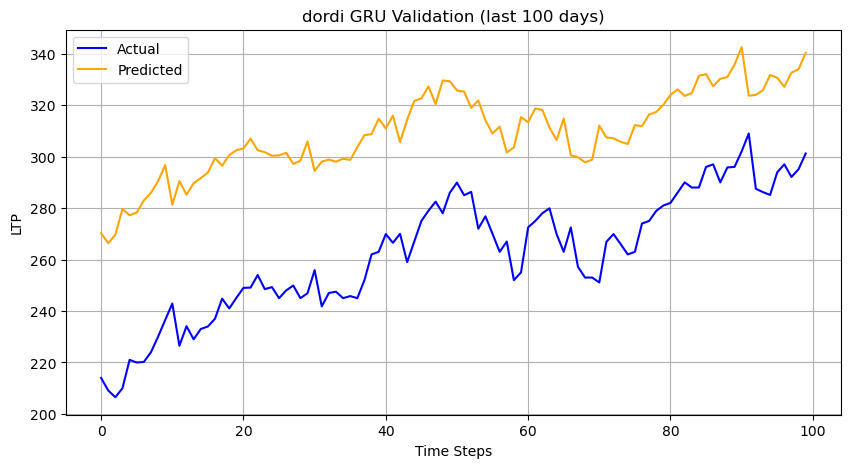

✅ Saved plot for dordi to plots/radhi.png
✅ EBL → Predicted LTP: 496.67


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ebl:
  MAE: 6.42
  RMSE: 9.30
  R2: 0.941
  MAPE: 1.16%


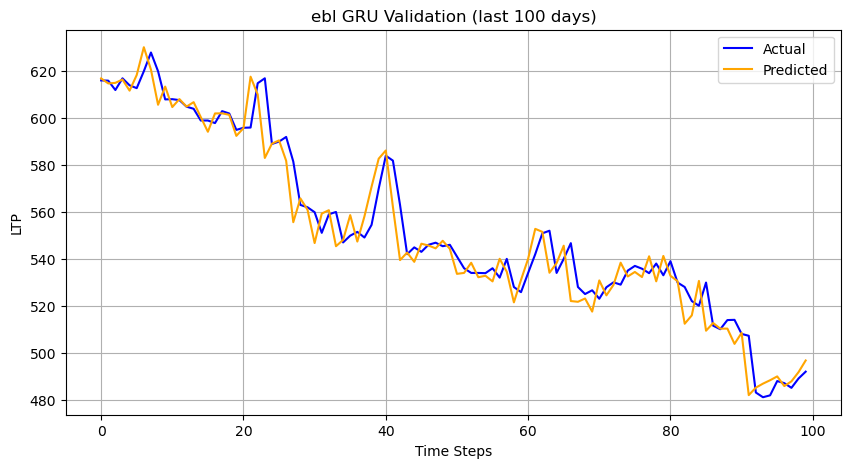

✅ Saved plot for ebl to plots/radhi.png
✅ EDBL → Predicted LTP: 317.19


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for edbl:
  MAE: 7.66
  RMSE: 9.52
  R2: 0.775
  MAPE: 2.52%


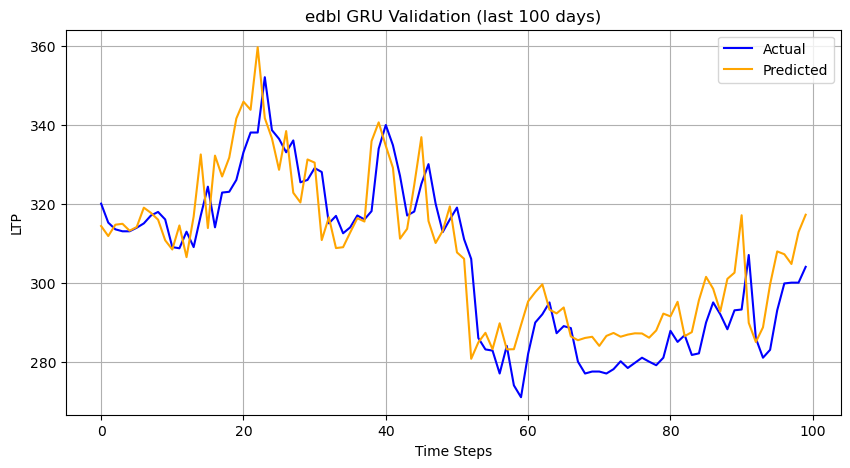

✅ Saved plot for edbl to plots/radhi.png
✅ EHPL → Predicted LTP: 460.34


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ehpl:
  MAE: 31.91
  RMSE: 35.13
  R2: 0.029
  MAPE: 9.37%


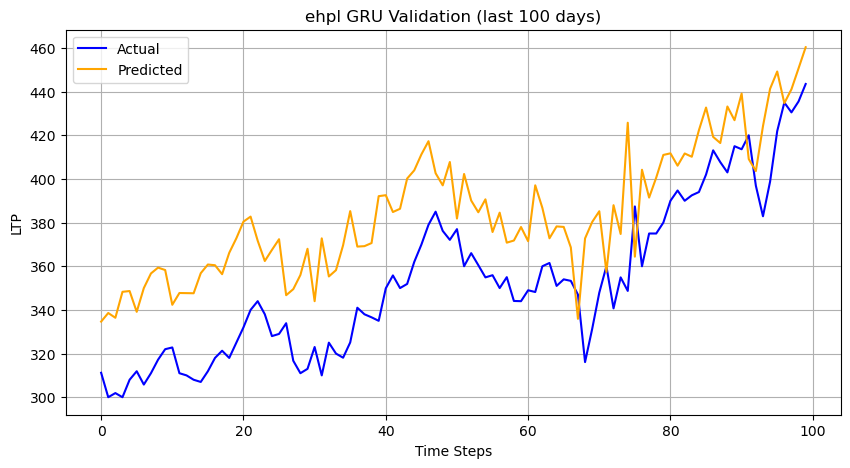

✅ Saved plot for ehpl to plots/radhi.png
✅ ENL → Predicted LTP: 728.46


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for enl:
  MAE: 61.65
  RMSE: 70.01
  R2: 0.566
  MAPE: 9.36%


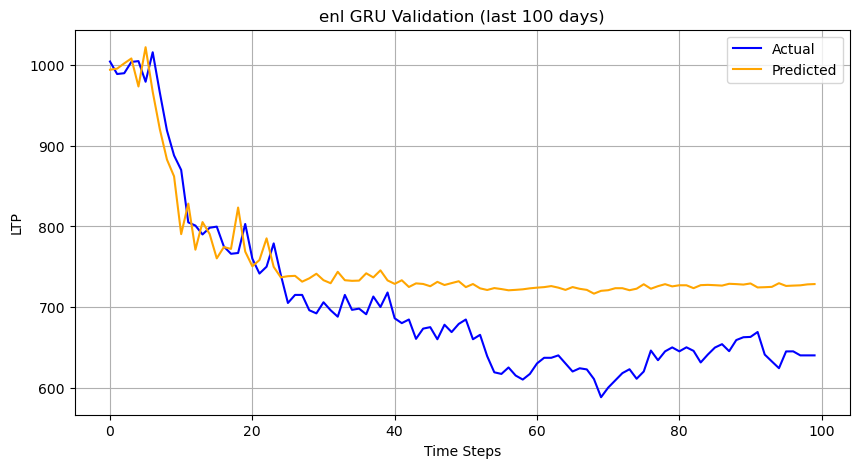

✅ Saved plot for enl to plots/radhi.png
✅ FMDBL → Predicted LTP: 567.45


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for fmdbl:
  MAE: 26.92
  RMSE: 32.52
  R2: 0.846
  MAPE: 4.70%


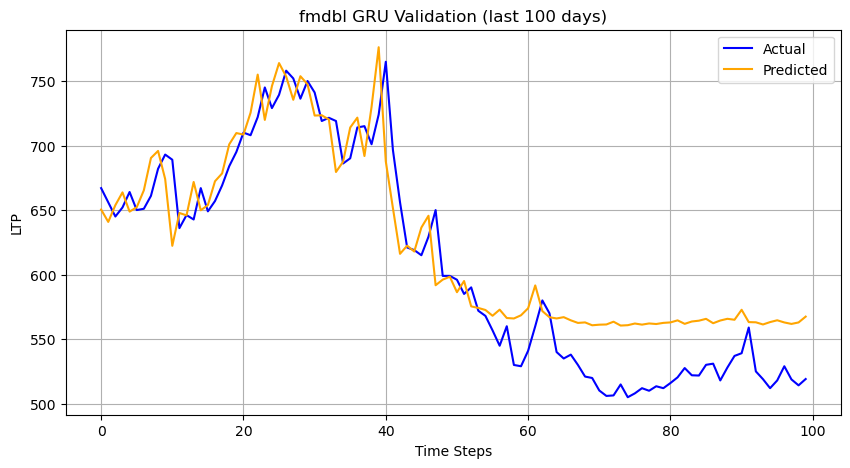

✅ Saved plot for fmdbl to plots/radhi.png
✅ FOWAD → Predicted LTP: 1167.60


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for fowad:
  MAE: 25.80
  RMSE: 34.41
  R2: 0.774
  MAPE: 2.07%


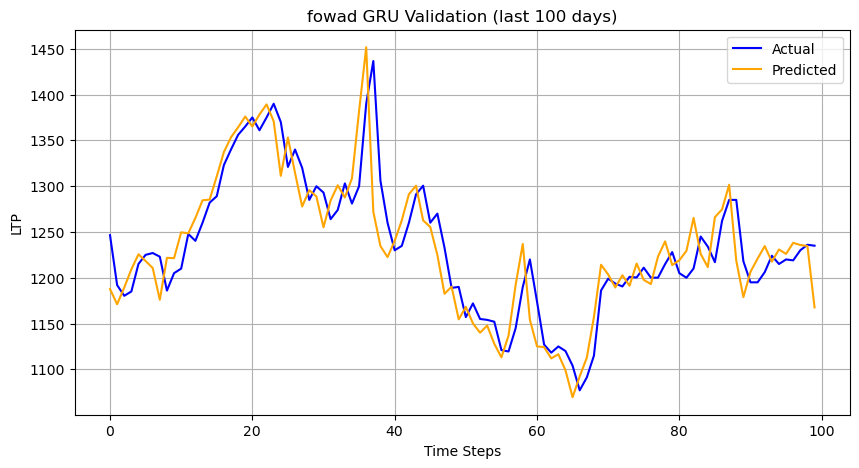

✅ Saved plot for fowad to plots/radhi.png
✅ GBBL → Predicted LTP: 358.35


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gbbl:
  MAE: 5.53
  RMSE: 7.16
  R2: 0.832
  MAPE: 1.49%


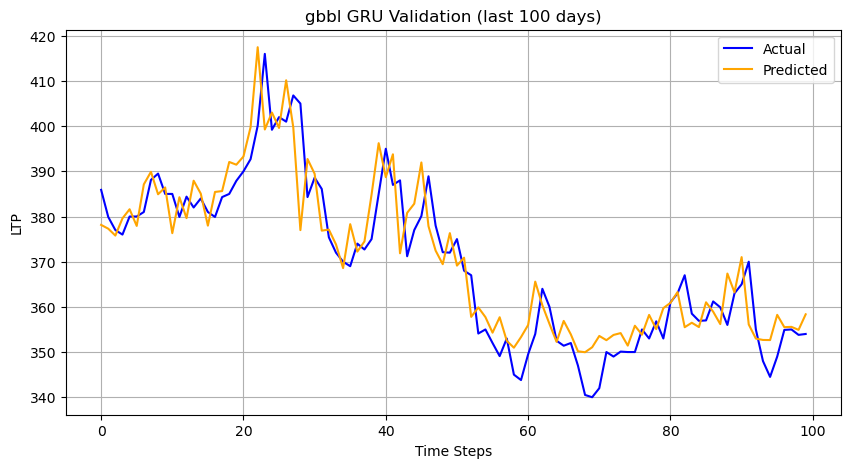

✅ Saved plot for gbbl to plots/radhi.png
✅ GBIME → Predicted LTP: 186.71


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gbime:
  MAE: 2.59
  RMSE: 3.90
  R2: 0.923
  MAPE: 1.31%


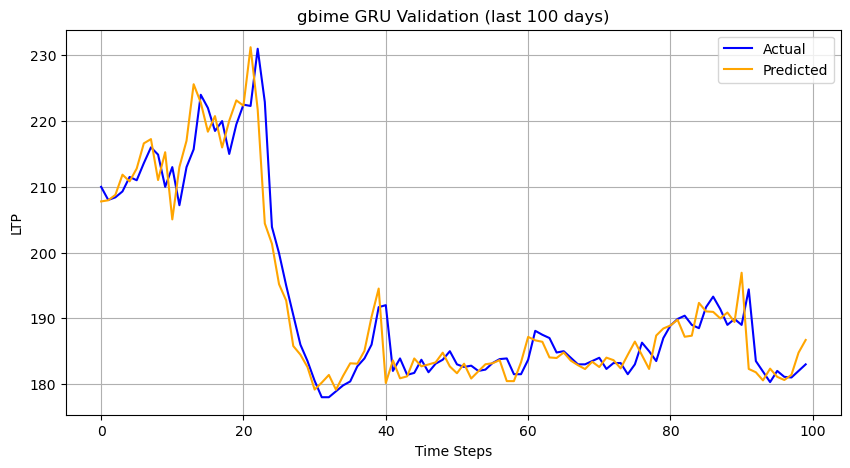

✅ Saved plot for gbime to plots/radhi.png
✅ GBLBS → Predicted LTP: 467.60


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gblbs:
  MAE: 13.53
  RMSE: 19.99
  R2: 0.879
  MAPE: 2.60%


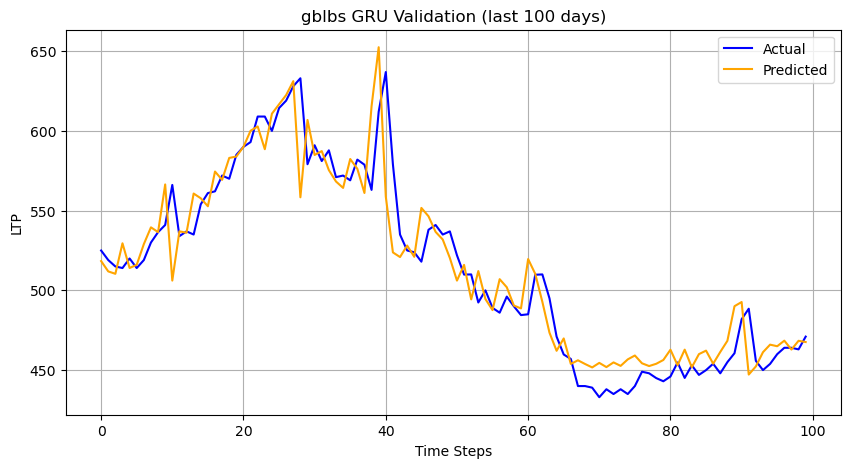

✅ Saved plot for gblbs to plots/radhi.png
✅ GCIL → Predicted LTP: 558.93


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gcil:
  MAE: 24.09
  RMSE: 31.42
  R2: 0.646
  MAPE: 5.52%


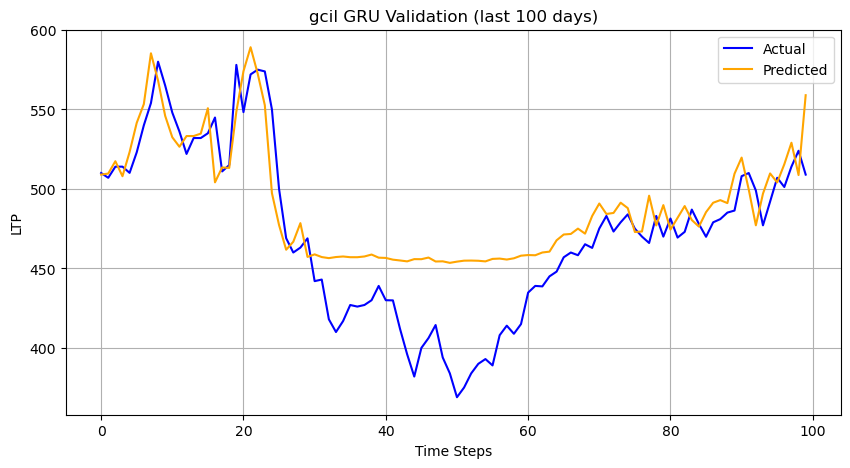

✅ Saved plot for gcil to plots/radhi.png
✅ GFCL → Predicted LTP: 448.83


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gfcl:
  MAE: 13.23
  RMSE: 16.82
  R2: 0.609
  MAPE: 2.85%


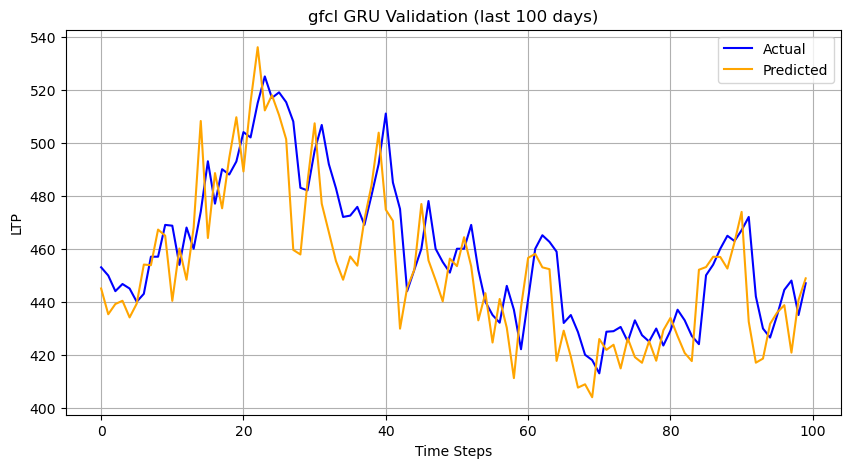

✅ Saved plot for gfcl to plots/radhi.png
✅ GHL → Predicted LTP: 265.08


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ghl:
  MAE: 4.00
  RMSE: 4.96
  R2: 0.957
  MAPE: 1.76%


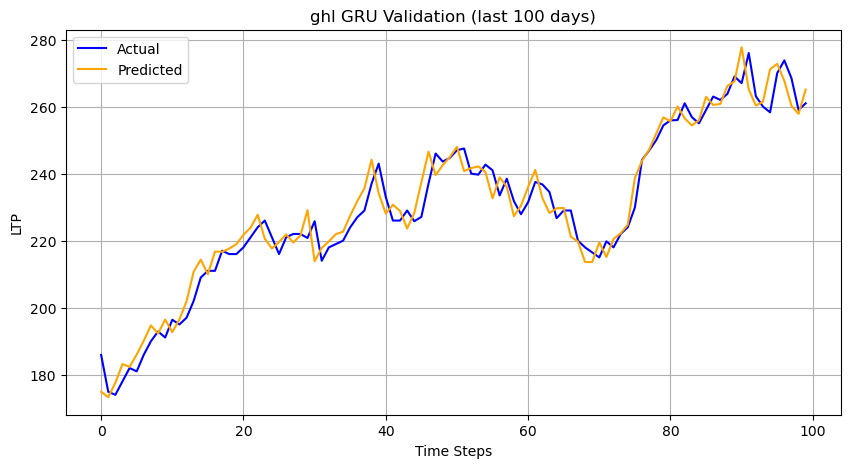

✅ Saved plot for ghl to plots/radhi.png
✅ GILB → Predicted LTP: 771.83


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gilb:
  MAE: 27.78
  RMSE: 36.43
  R2: 0.855
  MAPE: 3.17%


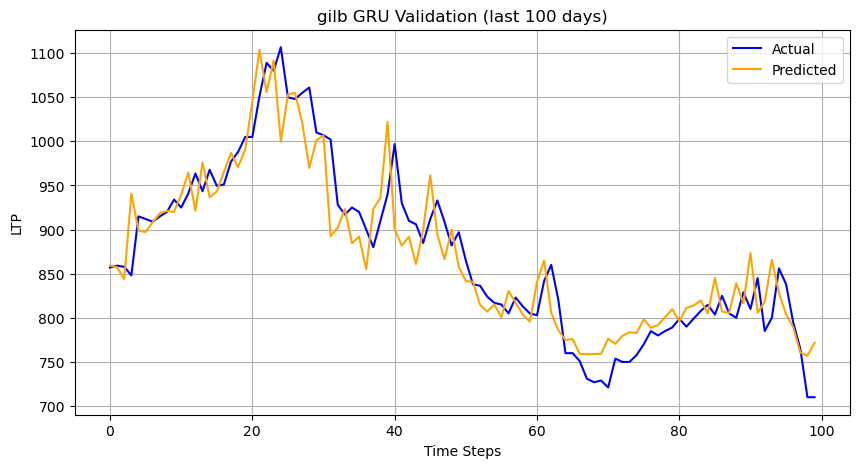

✅ Saved plot for gilb to plots/radhi.png
✅ GLBSL → Predicted LTP: 648.22


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for glbsl:
  MAE: 25.18
  RMSE: 32.91
  R2: -1.366
  MAPE: 3.46%


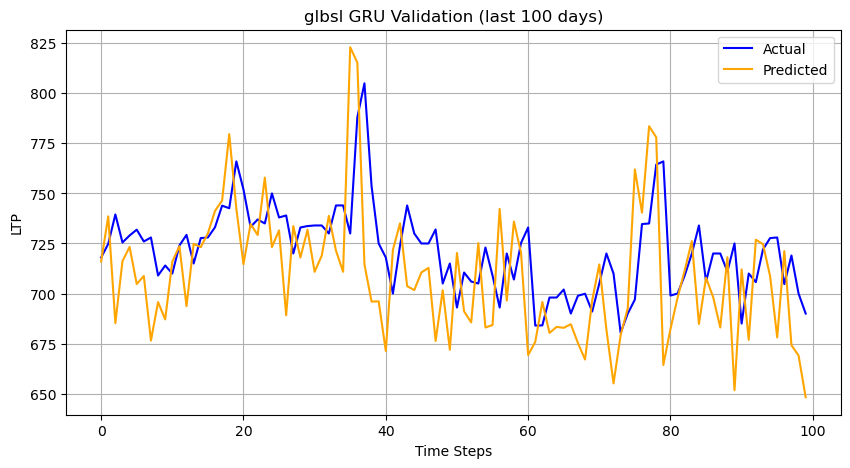

✅ Saved plot for glbsl to plots/radhi.png
✅ GLH → Predicted LTP: 291.14


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for glh:
  MAE: 5.70
  RMSE: 7.76
  R2: 0.813
  MAPE: 2.15%


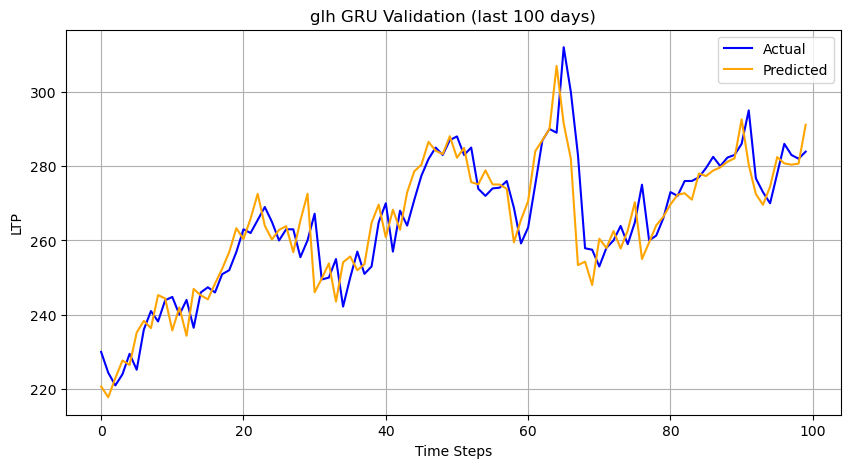

✅ Saved plot for glh to plots/radhi.png
✅ GMFBS → Predicted LTP: 878.00


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gmfbs:
  MAE: 112.15
  RMSE: 118.93
  R2: -4.232
  MAPE: 15.68%


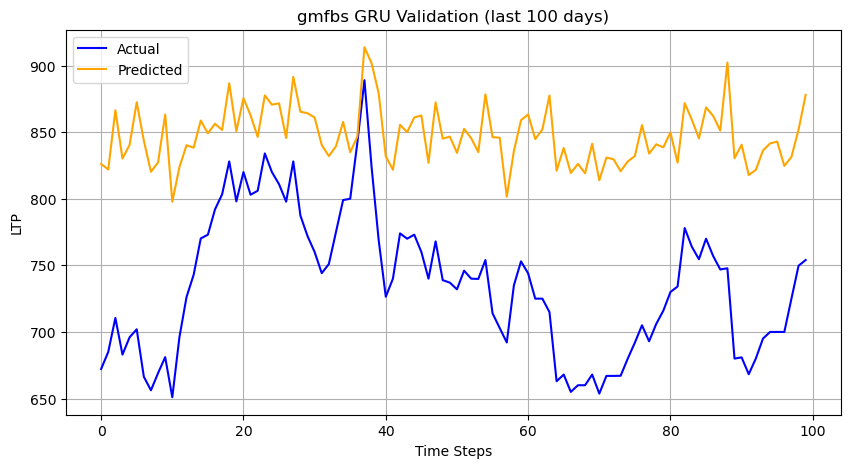

✅ Saved plot for gmfbs to plots/radhi.png
✅ GMFIL → Predicted LTP: 328.00


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gmfil:
  MAE: 13.76
  RMSE: 16.06
  R2: 0.830
  MAPE: 4.32%


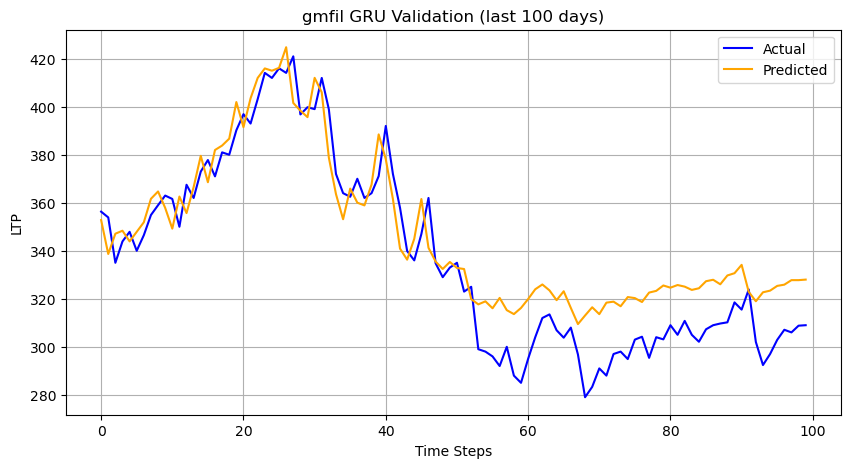

✅ Saved plot for gmfil to plots/radhi.png
✅ GMLI → Predicted LTP: 759.37
⚠️ Not enough data to validate gmli
✅ GRDBL → Predicted LTP: 317.89


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for grdbl:
  MAE: 44.71
  RMSE: 50.84
  R2: -1.698
  MAPE: 17.15%


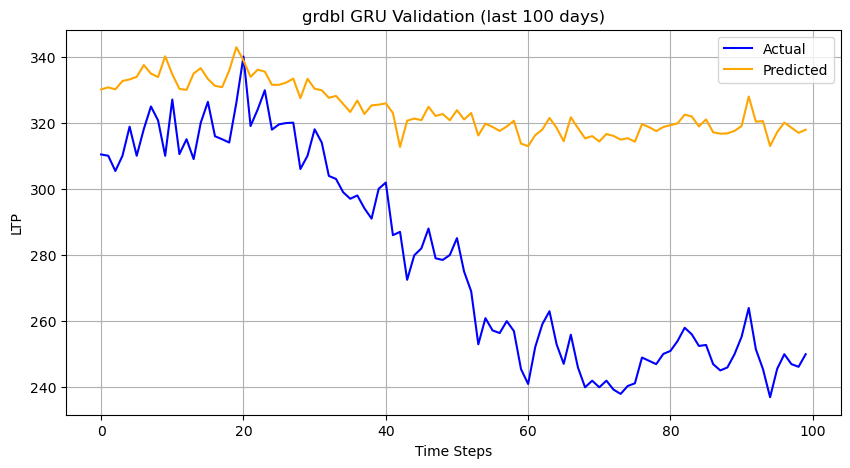

✅ Saved plot for grdbl to plots/radhi.png
✅ GUFL → Predicted LTP: 574.06


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gufl:
  MAE: 20.64
  RMSE: 29.34
  R2: 0.891
  MAPE: 2.79%


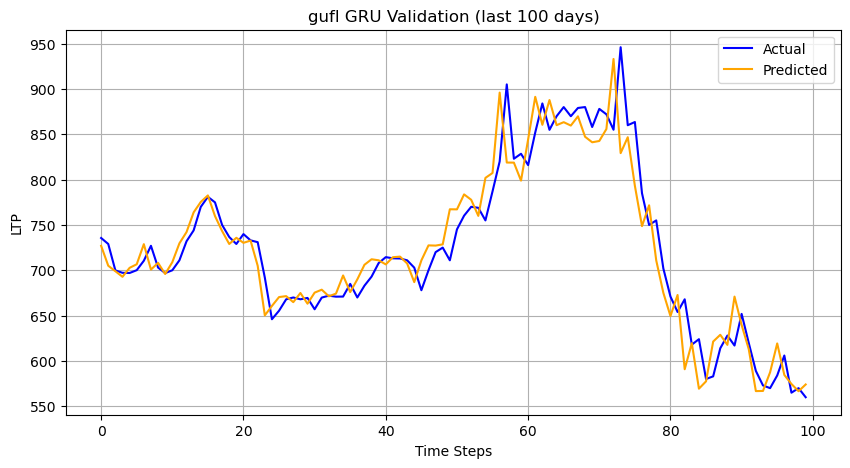

✅ Saved plot for gufl to plots/radhi.png
✅ GVL → Predicted LTP: 413.48


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for gvl:
  MAE: 16.17
  RMSE: 22.04
  R2: 0.323
  MAPE: 4.18%


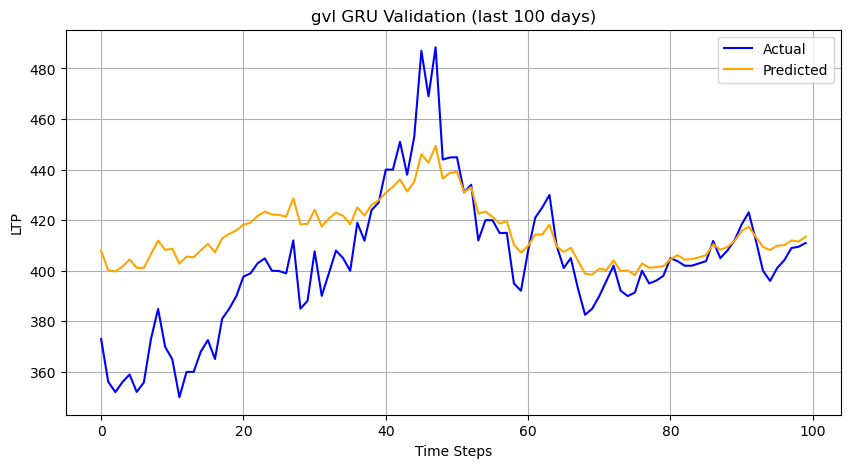

✅ Saved plot for gvl to plots/radhi.png
✅ HATHY → Predicted LTP: 914.41


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hathy:
  MAE: 218.57
  RMSE: 310.09
  R2: -0.456
  MAPE: 52.06%


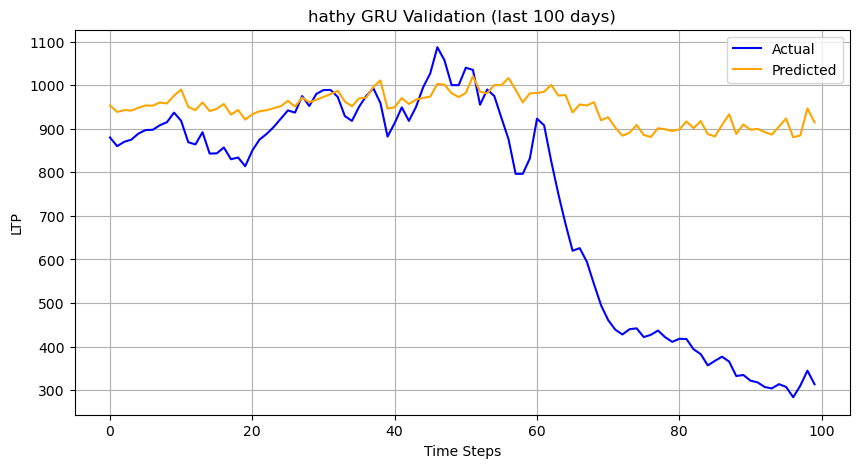

✅ Saved plot for hathy to plots/radhi.png
✅ HBL → Predicted LTP: 224.72


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hbl:
  MAE: 2.66
  RMSE: 3.54
  R2: 0.732
  MAPE: 1.21%


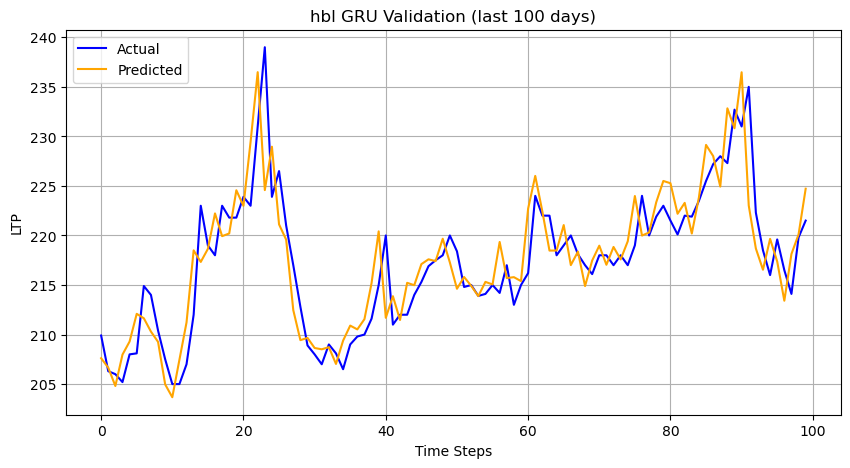

✅ Saved plot for hbl to plots/radhi.png
✅ HDHPC → Predicted LTP: 220.74


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hdhpc:
  MAE: 3.29
  RMSE: 4.36
  R2: 0.973
  MAPE: 1.93%


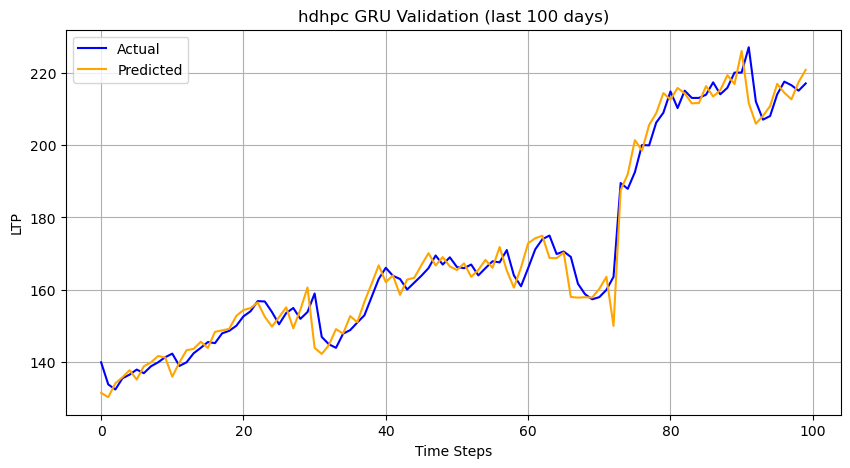

✅ Saved plot for hdhpc to plots/radhi.png
✅ HEI → Predicted LTP: 511.42


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hei:
  MAE: 50.88
  RMSE: 55.34
  R2: 0.487
  MAPE: 10.09%


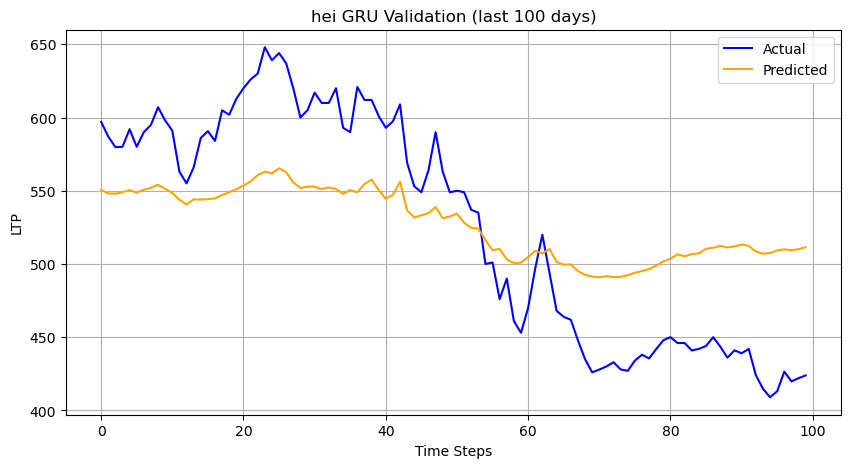

✅ Saved plot for hei to plots/radhi.png
✅ HHL → Predicted LTP: 299.19


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hhl:
  MAE: 10.92
  RMSE: 12.80
  R2: 0.715
  MAPE: 4.38%


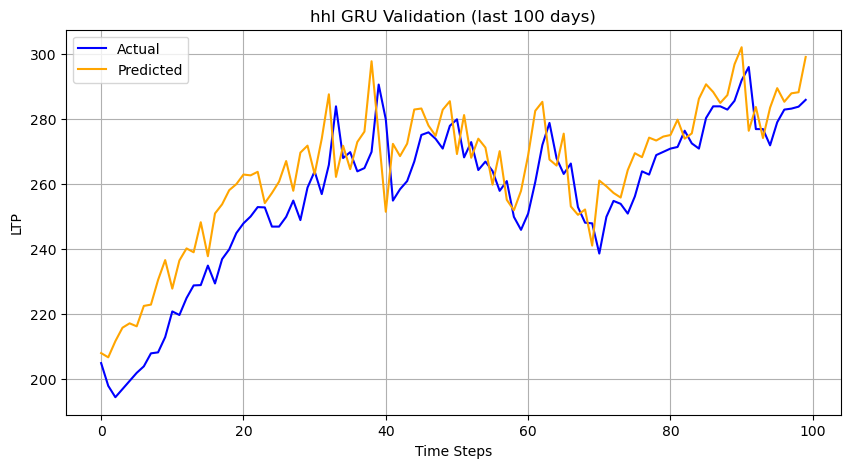

✅ Saved plot for hhl to plots/radhi.png
✅ HIDCL → Predicted LTP: 192.37


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hidcl:
  MAE: 2.99
  RMSE: 4.33
  R2: 0.697
  MAPE: 1.59%


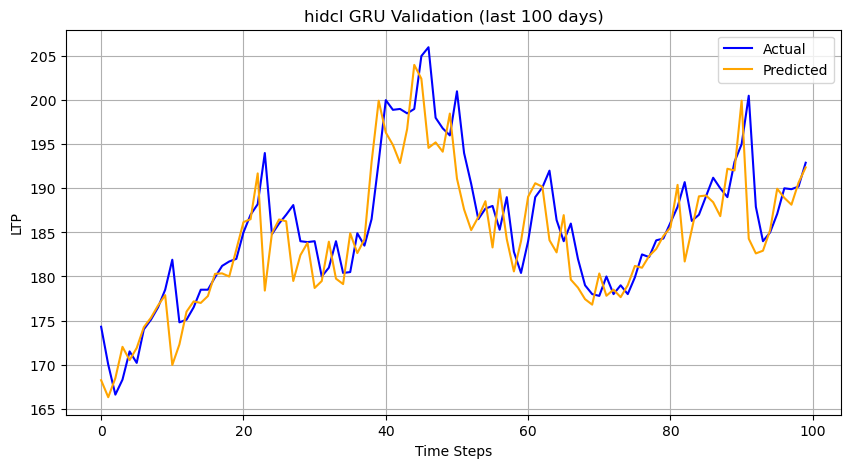

✅ Saved plot for hidcl to plots/radhi.png
✅ HLBSL → Predicted LTP: 629.72


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hlbsl:
  MAE: 39.35
  RMSE: 54.21
  R2: 0.215
  MAPE: 6.18%


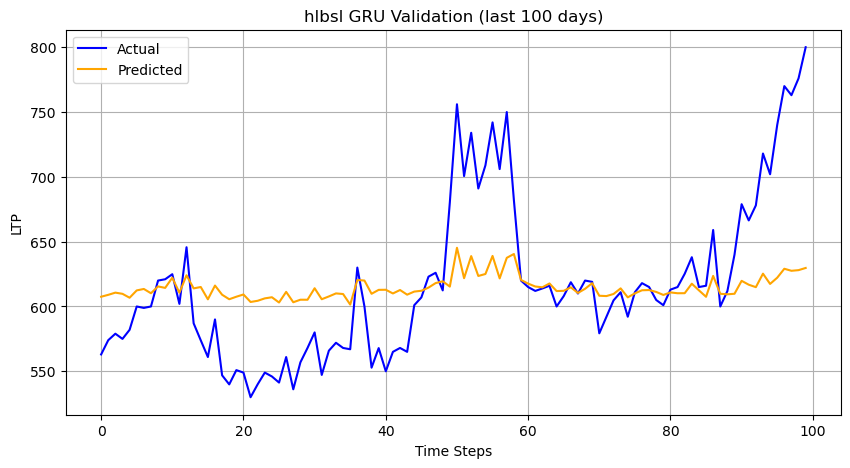

✅ Saved plot for hlbsl to plots/radhi.png
✅ HLI → Predicted LTP: 372.18


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hli:
  MAE: 7.47
  RMSE: 11.28
  R2: 0.934
  MAPE: 1.66%


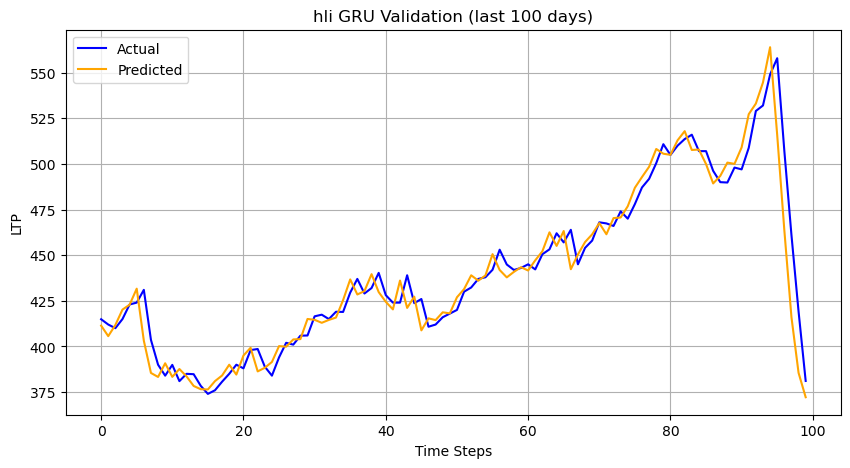

✅ Saved plot for hli to plots/radhi.png
✅ HPPL → Predicted LTP: 295.80


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hppl:
  MAE: 7.20
  RMSE: 9.86
  R2: 0.644
  MAPE: 2.59%


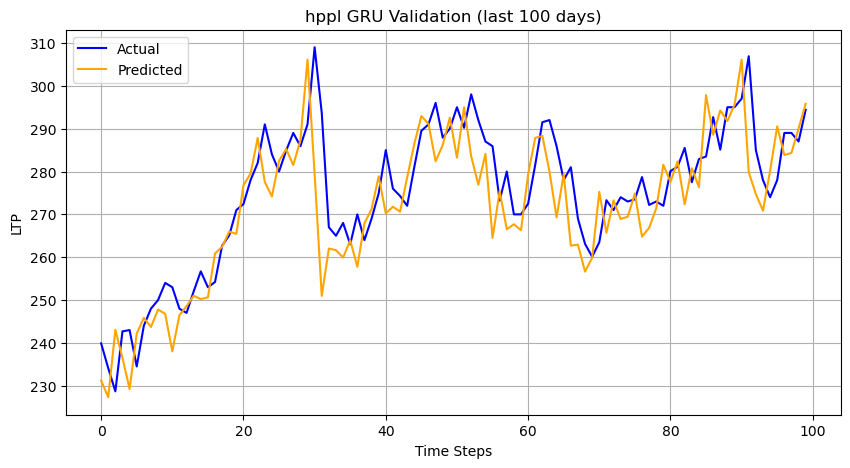

✅ Saved plot for hppl to plots/radhi.png
✅ HRL → Predicted LTP: 576.44


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hrl:
  MAE: 33.50
  RMSE: 49.35
  R2: 0.320
  MAPE: 6.30%


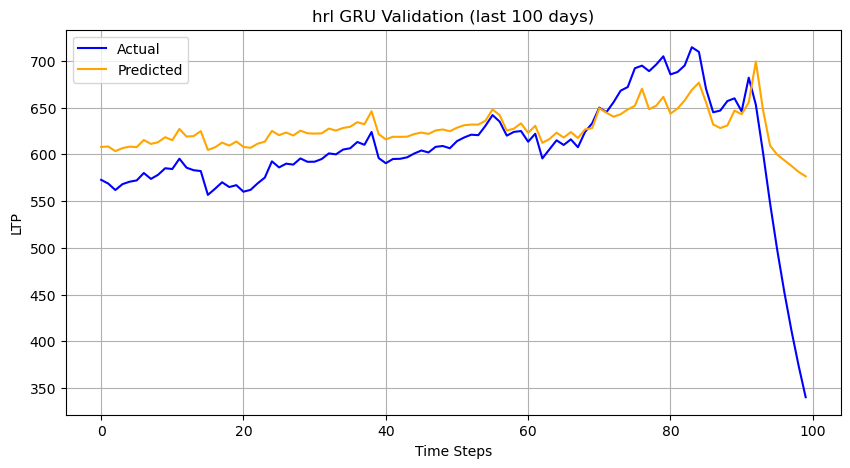

✅ Saved plot for hrl to plots/radhi.png
✅ HURJA → Predicted LTP: 335.47


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for hurja:
  MAE: 7.16
  RMSE: 9.48
  R2: 0.862
  MAPE: 2.62%


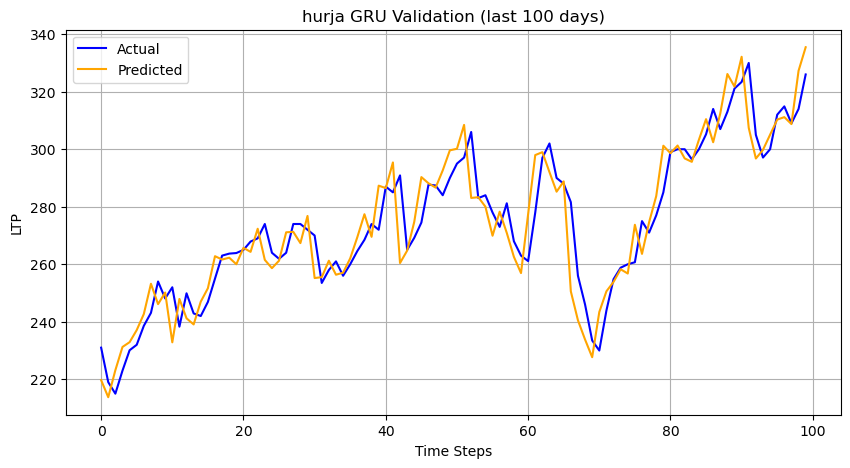

✅ Saved plot for hurja to plots/radhi.png
✅ ICFC → Predicted LTP: 427.57


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for icfc:
  MAE: 14.62
  RMSE: 16.52
  R2: 0.868
  MAPE: 3.29%


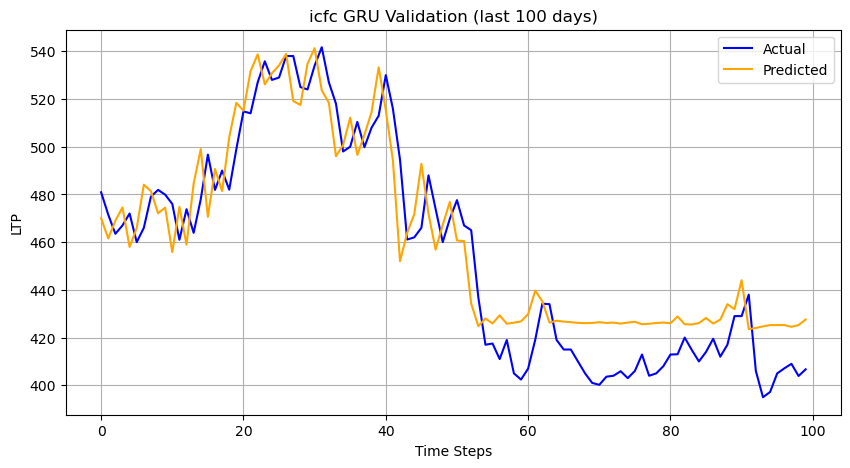

✅ Saved plot for icfc to plots/radhi.png
✅ IGI → Predicted LTP: 462.63


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for igi:
  MAE: 35.47
  RMSE: 45.57
  R2: 0.676
  MAPE: 8.65%


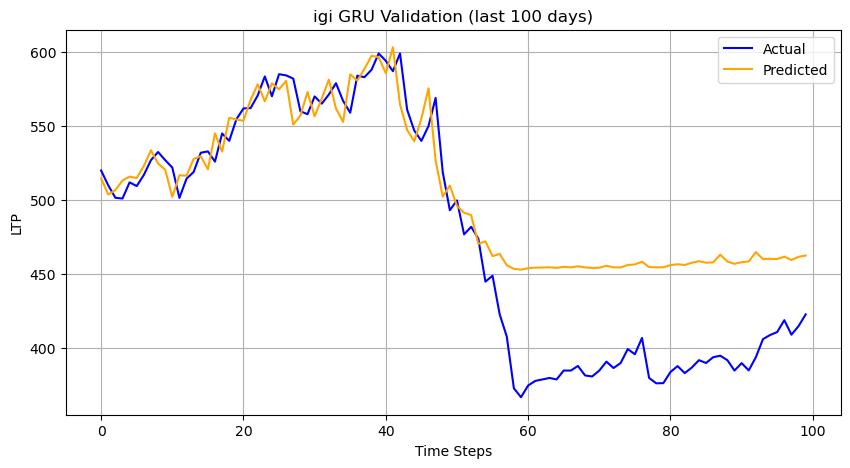

✅ Saved plot for igi to plots/radhi.png
✅ IHL → Predicted LTP: 333.81


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ihl:
  MAE: 57.05
  RMSE: 58.94
  R2: -3.911
  MAPE: 23.93%


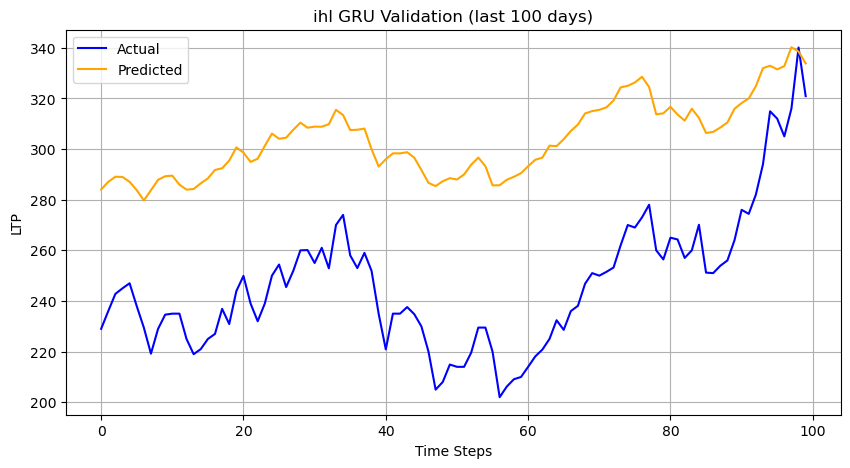

✅ Saved plot for ihl to plots/radhi.png
✅ ILBS → Predicted LTP: 652.99


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ilbs:
  MAE: 19.58
  RMSE: 23.82
  R2: 0.708
  MAPE: 3.06%


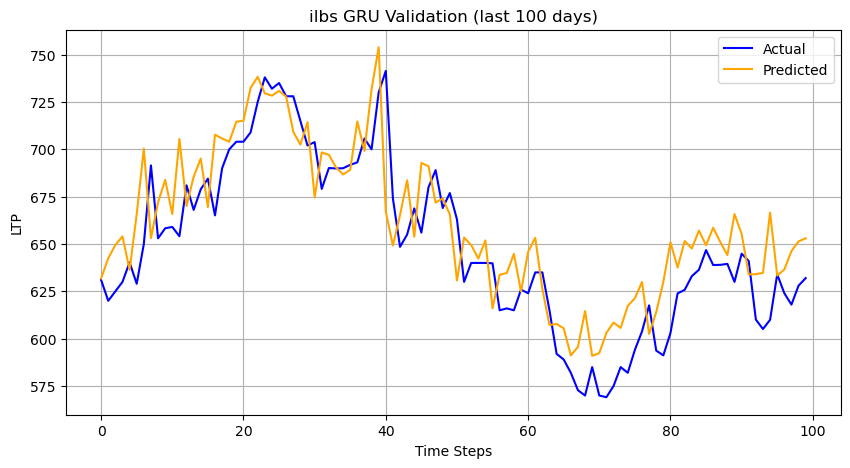

✅ Saved plot for ilbs to plots/radhi.png
✅ ILI → Predicted LTP: 581.71


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ili:
  MAE: 9.12
  RMSE: 11.62
  R2: 0.905
  MAPE: 1.72%


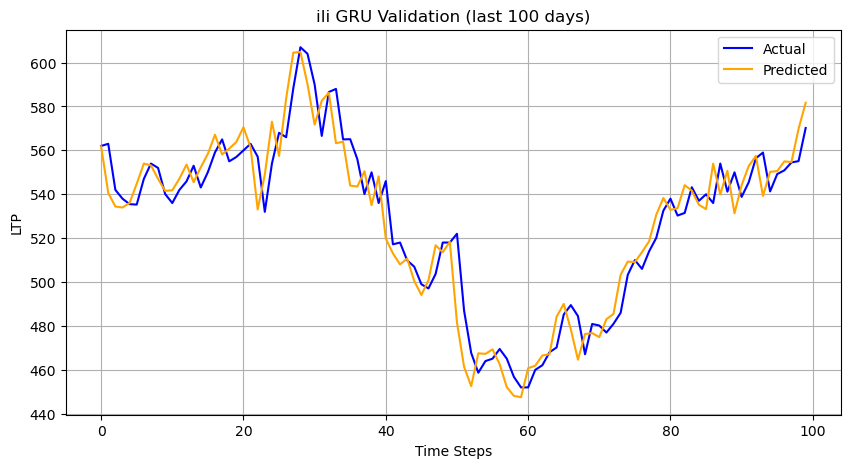

✅ Saved plot for ili to plots/radhi.png
✅ JBBL → Predicted LTP: 277.60


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for jbbl:
  MAE: 8.67
  RMSE: 10.18
  R2: 0.846
  MAPE: 3.10%


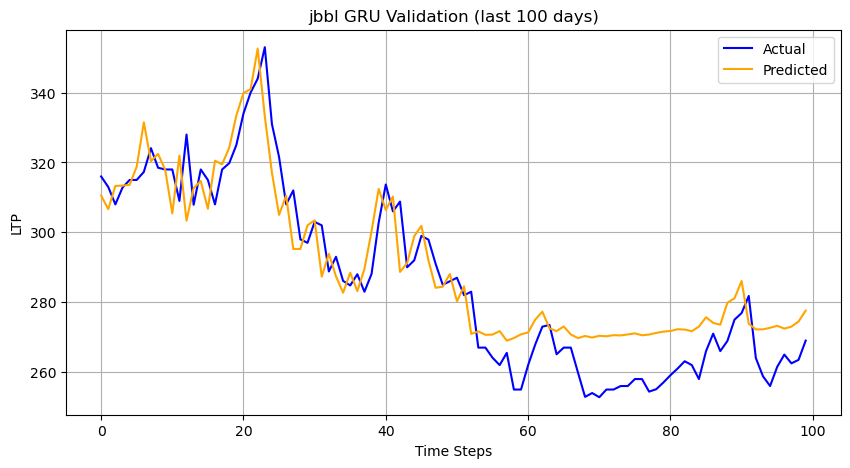

✅ Saved plot for jbbl to plots/radhi.png
✅ JBLB → Predicted LTP: 1389.90


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for jblb:
  MAE: 20.12
  RMSE: 30.98
  R2: 0.876
  MAPE: 1.31%


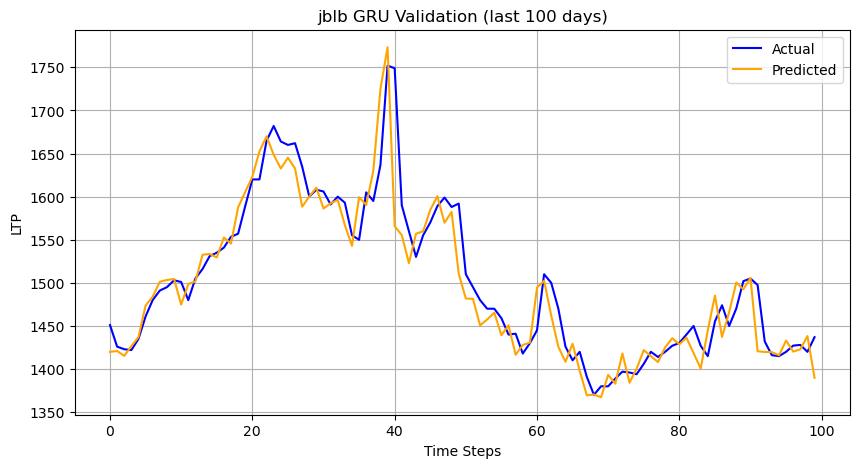

✅ Saved plot for jblb to plots/radhi.png
✅ JFL → Predicted LTP: 363.38


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for jfl:
  MAE: 9.07
  RMSE: 12.84
  R2: 0.711
  MAPE: 2.33%


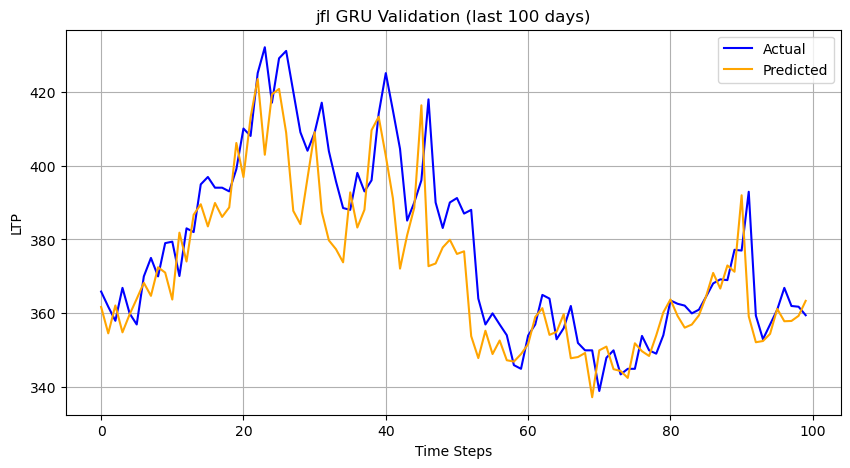

✅ Saved plot for jfl to plots/radhi.png
✅ JOSHI → Predicted LTP: 260.22


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for joshi:
  MAE: 12.48
  RMSE: 17.23
  R2: 0.132
  MAPE: 5.06%


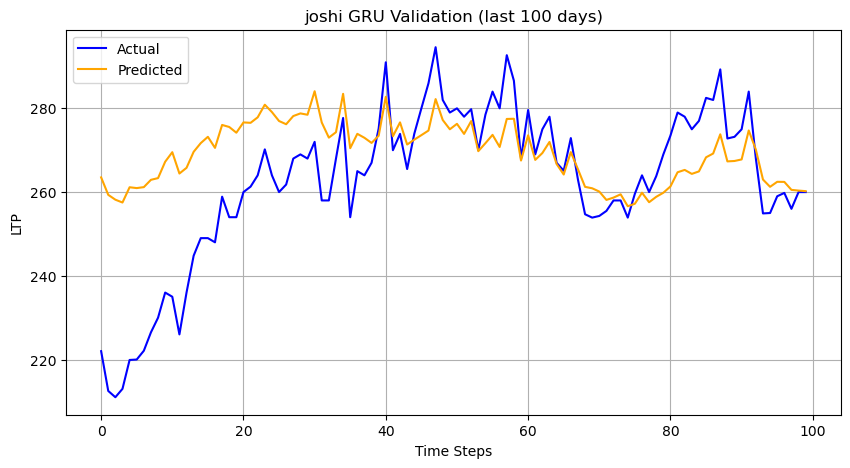

✅ Saved plot for joshi to plots/radhi.png
✅ JSLBB → Predicted LTP: 894.64


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for jslbb:
  MAE: 25.96
  RMSE: 33.65
  R2: 0.710
  MAPE: 2.65%


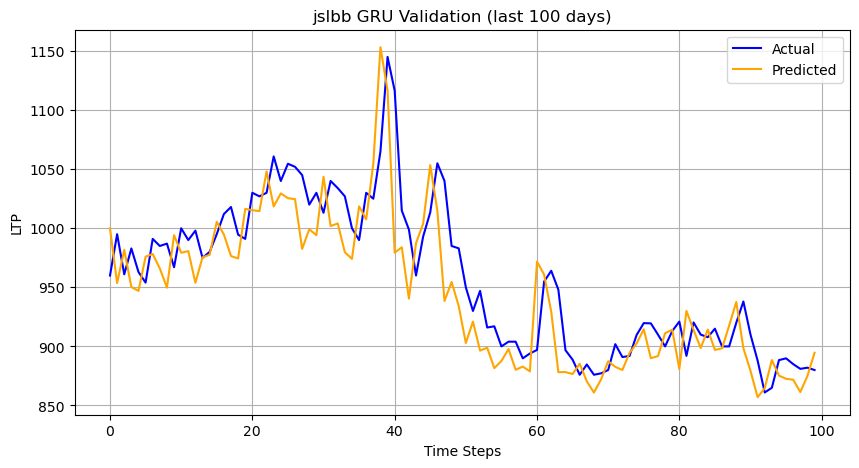

✅ Saved plot for jslbb to plots/radhi.png
✅ KBL → Predicted LTP: 175.34


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for kbl:
  MAE: 2.56
  RMSE: 3.66
  R2: 0.604
  MAPE: 1.51%


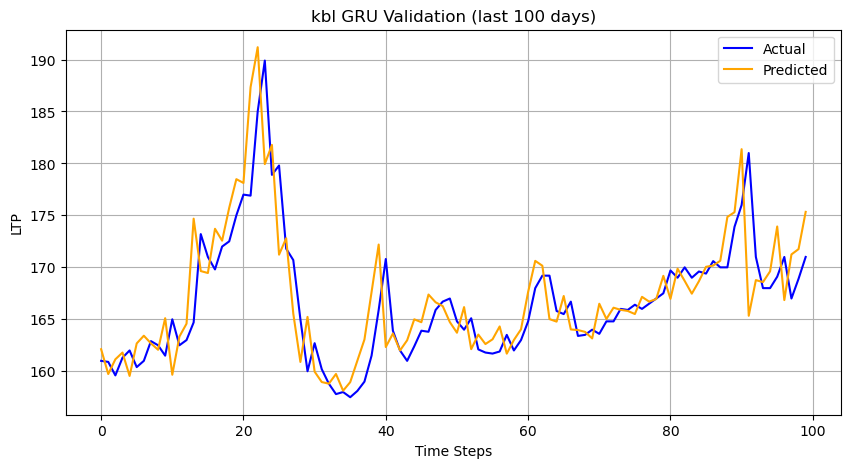

✅ Saved plot for kbl to plots/radhi.png
✅ KBSH → Predicted LTP: 1086.59


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for kbsh:
  MAE: 372.19
  RMSE: 377.46
  R2: -28.597
  MAPE: 46.88%


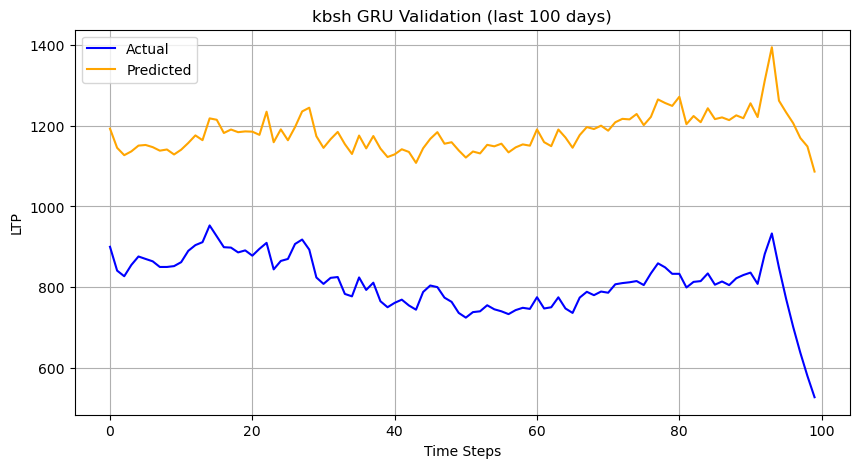

✅ Saved plot for kbsh to plots/radhi.png
✅ KDL → Predicted LTP: 536.65


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for kdl:
  MAE: 46.20
  RMSE: 79.87
  R2: 0.828
  MAPE: 10.25%


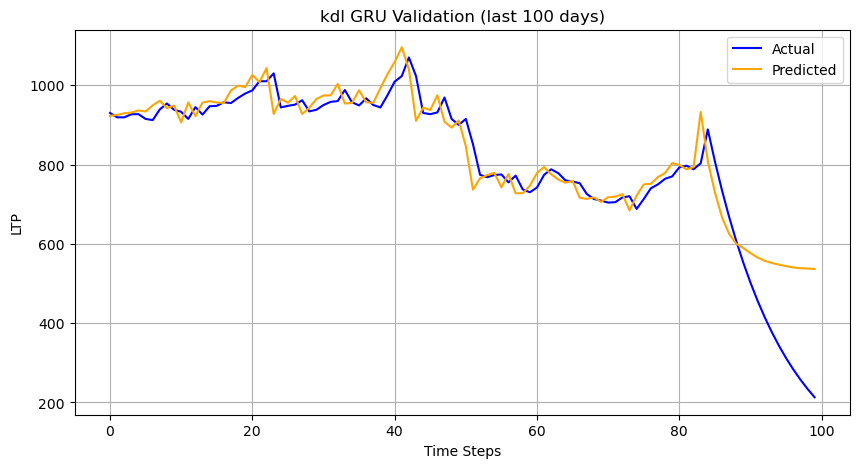

✅ Saved plot for kdl to plots/radhi.png
✅ KKHC → Predicted LTP: 253.36


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for kkhc:
  MAE: 10.56
  RMSE: 12.47
  R2: 0.475
  MAPE: 5.17%


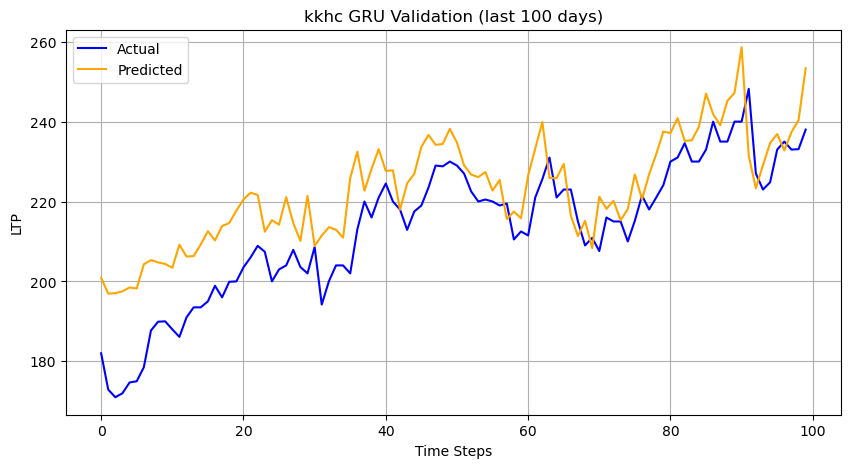

✅ Saved plot for kkhc to plots/radhi.png
✅ KMCDB → Predicted LTP: 631.72


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for kmcdb:
  MAE: 41.11
  RMSE: 47.45
  R2: 0.399
  MAPE: 6.28%


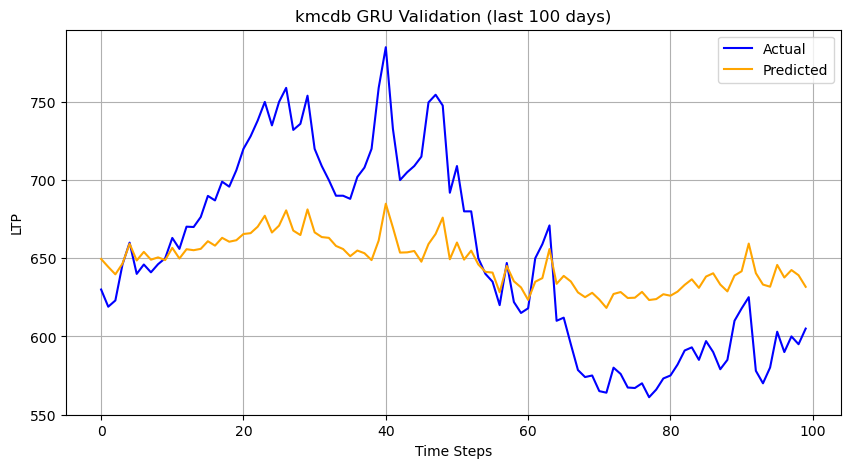

✅ Saved plot for kmcdb to plots/radhi.png
✅ KPCL → Predicted LTP: 339.72


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for kpcl:
  MAE: 32.66
  RMSE: 35.61
  R2: -3.630
  MAPE: 8.67%


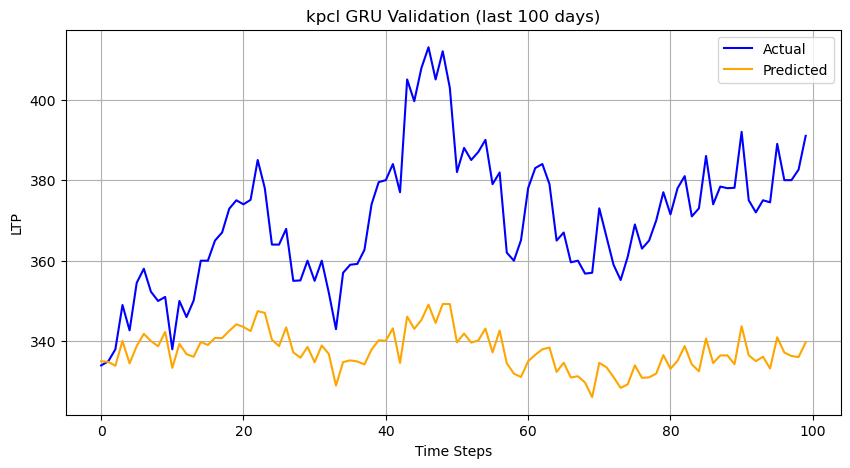

✅ Saved plot for kpcl to plots/radhi.png
✅ KSBBL → Predicted LTP: 316.89


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ksbbl:
  MAE: 8.58
  RMSE: 10.45
  R2: 0.767
  MAPE: 2.75%


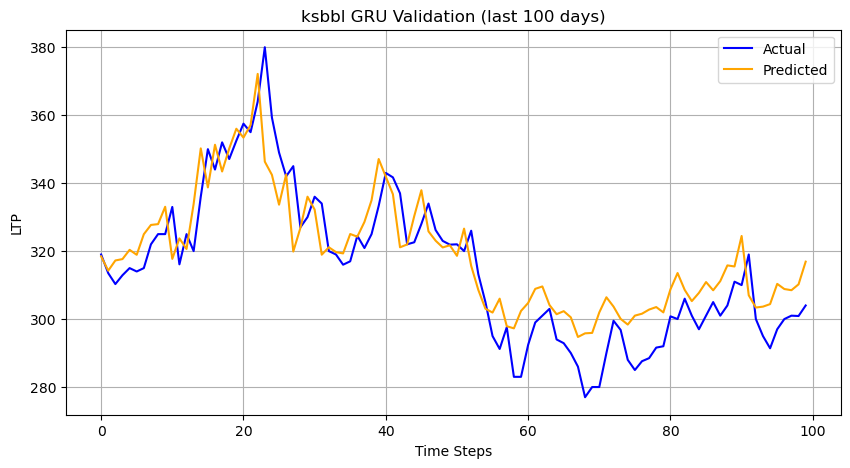

✅ Saved plot for ksbbl to plots/radhi.png
✅ LBBL → Predicted LTP: 365.21


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for lbbl:
  MAE: 21.55
  RMSE: 27.02
  R2: 0.528
  MAPE: 6.32%


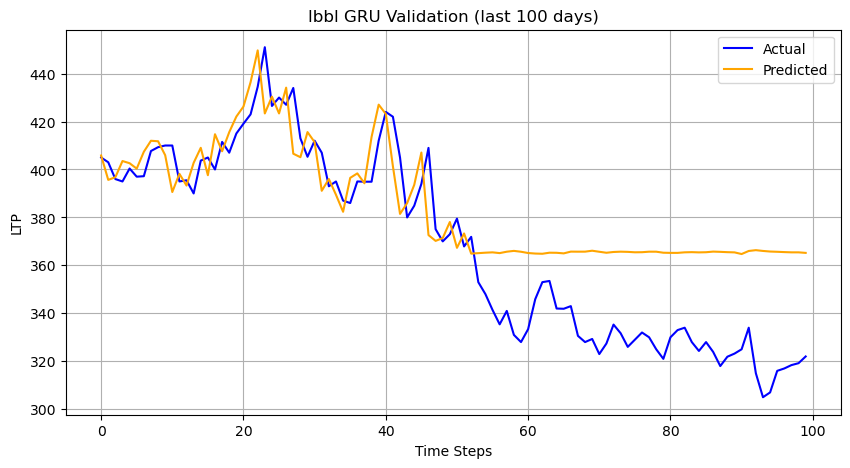

✅ Saved plot for lbbl to plots/radhi.png
✅ LICN → Predicted LTP: 1351.63


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for licn:
  MAE: 18.62
  RMSE: 27.07
  R2: 0.960
  MAPE: 1.27%


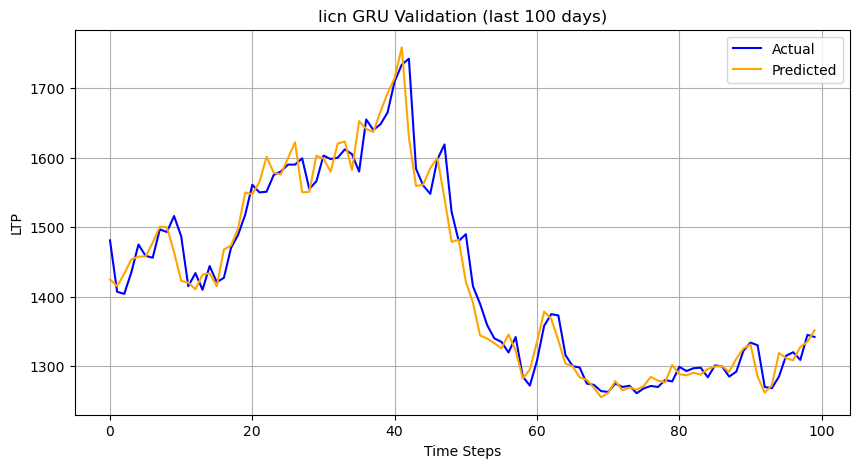

✅ Saved plot for licn to plots/radhi.png
✅ LLBS → Predicted LTP: 740.16


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for llbs:
  MAE: 37.83
  RMSE: 47.44
  R2: 0.543
  MAPE: 4.82%


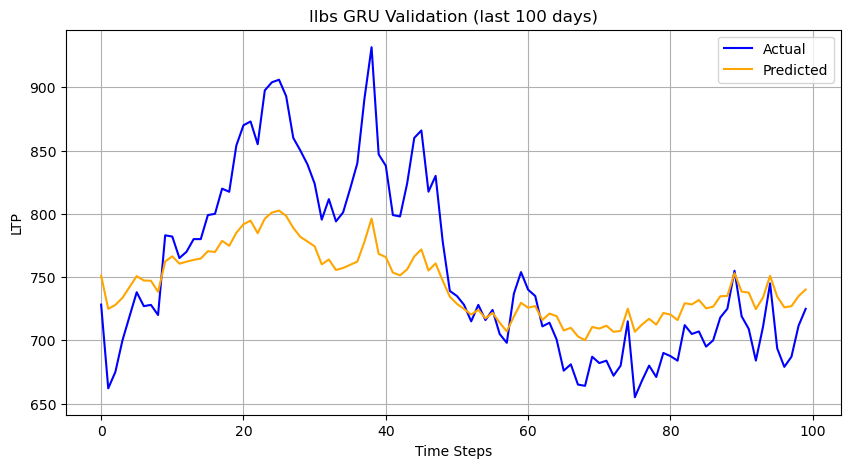

✅ Saved plot for llbs to plots/radhi.png
✅ LSL → Predicted LTP: 173.57


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for lsl:
  MAE: 3.06
  RMSE: 4.18
  R2: 0.792
  MAPE: 1.67%


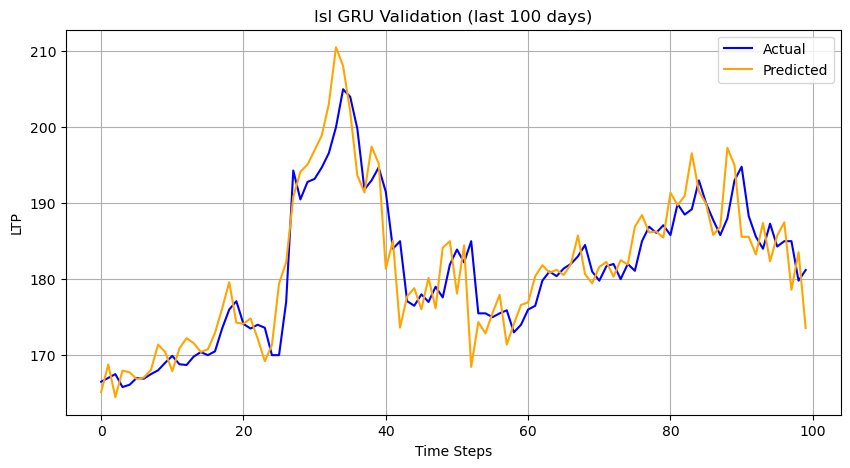

✅ Saved plot for lsl to plots/radhi.png
✅ MAKAR → Predicted LTP: 291.82


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for makar:
  MAE: 34.02
  RMSE: 37.48
  R2: -0.862
  MAPE: 13.48%


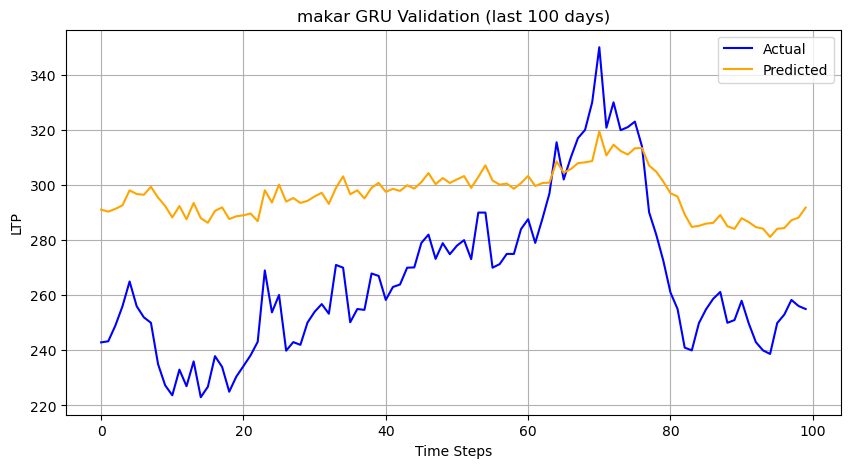

✅ Saved plot for makar to plots/radhi.png
✅ MATRI → Predicted LTP: 1344.10


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for matri:
  MAE: 47.18
  RMSE: 56.59
  R2: 0.717
  MAPE: 3.37%


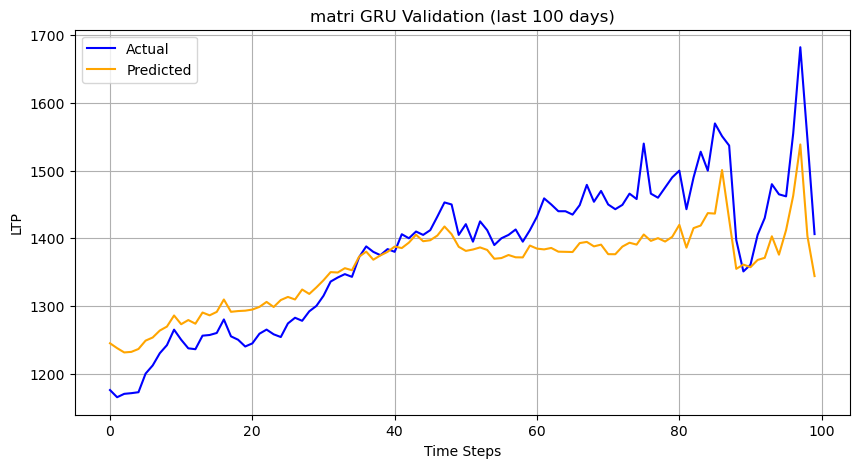

✅ Saved plot for matri to plots/radhi.png
✅ MBJC → Predicted LTP: 277.02


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mbjc:
  MAE: 26.38
  RMSE: 30.17
  R2: -1.561
  MAPE: 8.47%


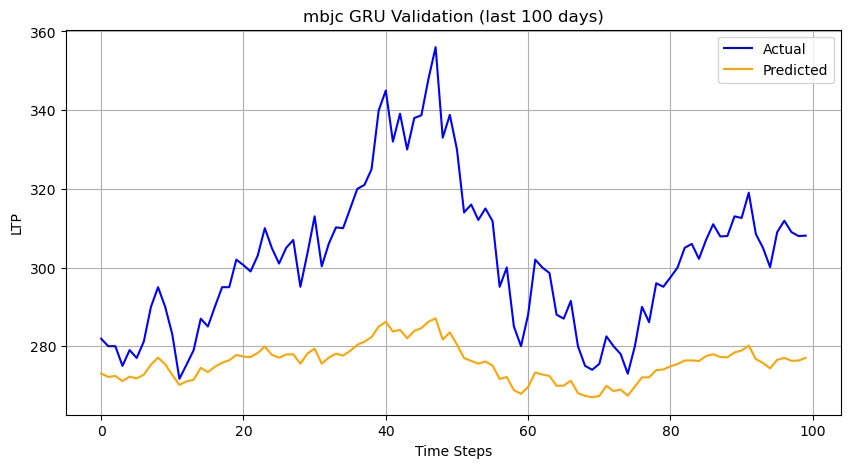

✅ Saved plot for mbjc to plots/radhi.png
✅ MBL → Predicted LTP: 219.02


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mbl:
  MAE: 3.34
  RMSE: 4.75
  R2: 0.922
  MAPE: 1.39%


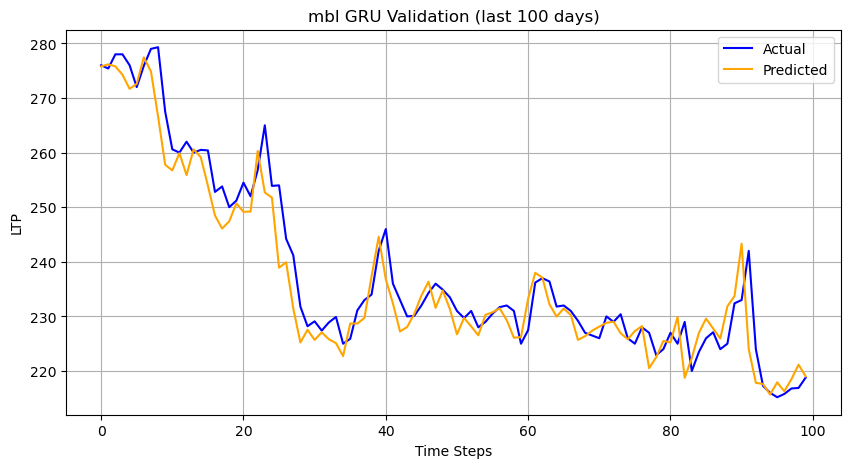

✅ Saved plot for mbl to plots/radhi.png
✅ MCHL → Predicted LTP: 334.77


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mchl:
  MAE: 85.02
  RMSE: 86.41
  R2: -9.590
  MAPE: 37.93%


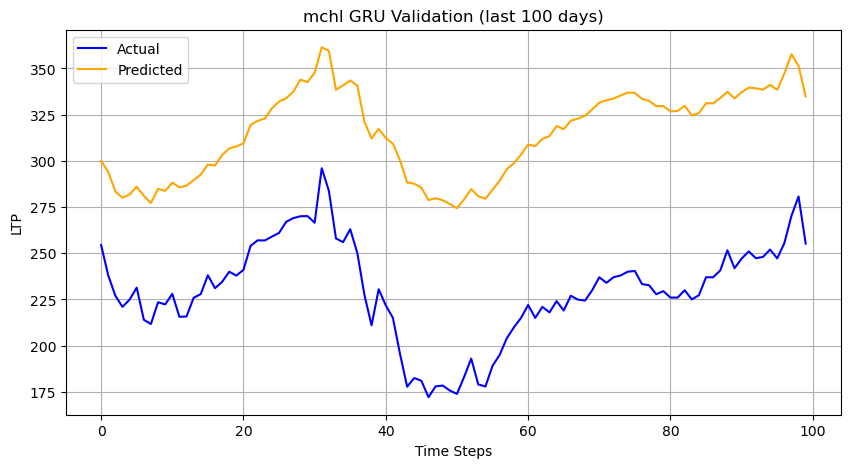

✅ Saved plot for mchl to plots/radhi.png
✅ MDB → Predicted LTP: 383.49


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mdb:
  MAE: 8.11
  RMSE: 9.75
  R2: 0.762
  MAPE: 2.12%


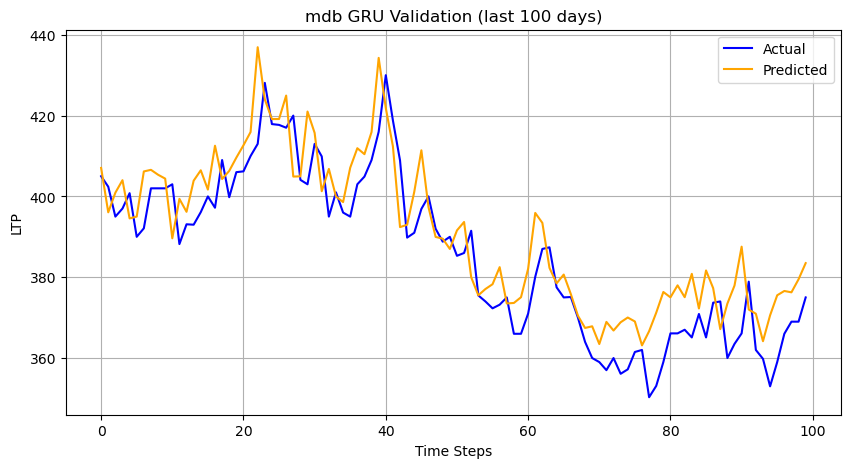

✅ Saved plot for mdb to plots/radhi.png
✅ MEHL → Predicted LTP: 281.18


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mehl:
  MAE: 39.71
  RMSE: 51.84
  R2: -0.289
  MAPE: 18.48%


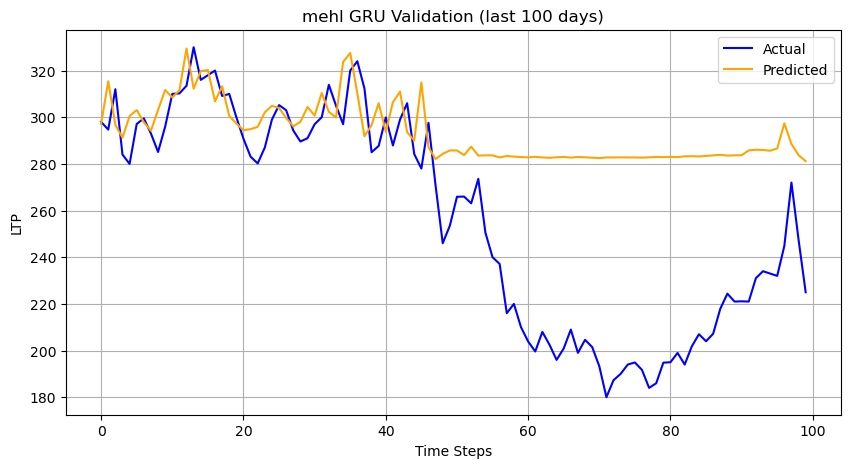

✅ Saved plot for mehl to plots/radhi.png
✅ MEL → Predicted LTP: 211.63


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mel:
  MAE: 16.53
  RMSE: 18.83
  R2: 0.214
  MAPE: 9.60%


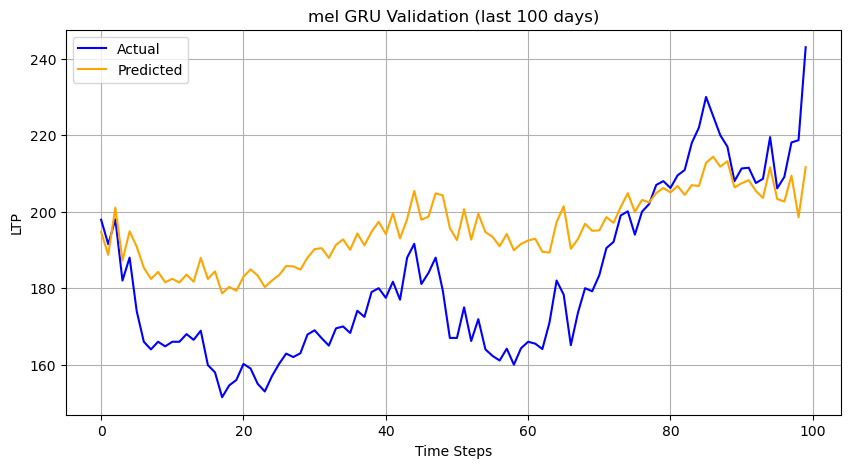

✅ Saved plot for mel to plots/radhi.png
✅ MEN → Predicted LTP: 771.75


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for men:
  MAE: 19.71
  RMSE: 28.26
  R2: 0.926
  MAPE: 2.27%


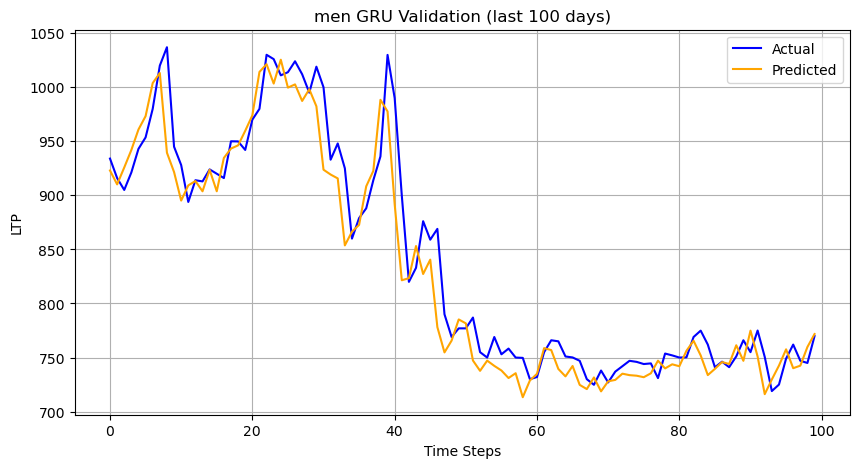

✅ Saved plot for men to plots/radhi.png
✅ MERO → Predicted LTP: 543.27


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mero:
  MAE: 15.36
  RMSE: 15.45
  R2: 0.000
  MAPE: 2.74%


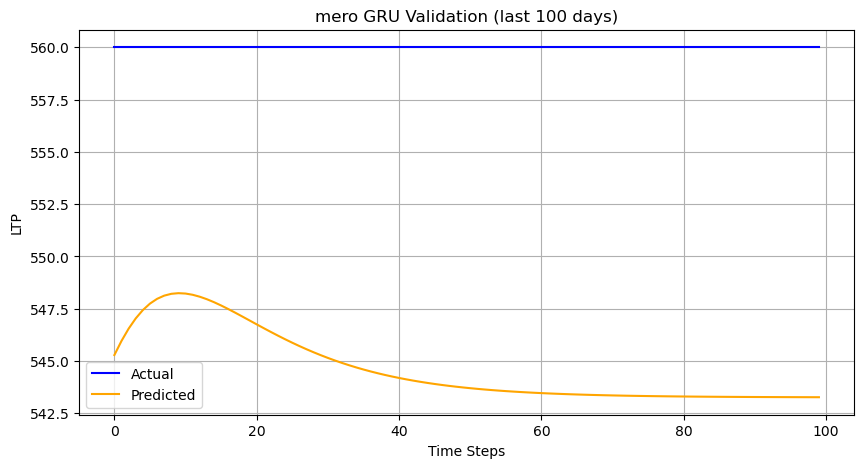

✅ Saved plot for mero to plots/radhi.png
✅ MFIL → Predicted LTP: 472.43


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mfil:
  MAE: 25.11
  RMSE: 29.77
  R2: 0.654
  MAPE: 5.61%


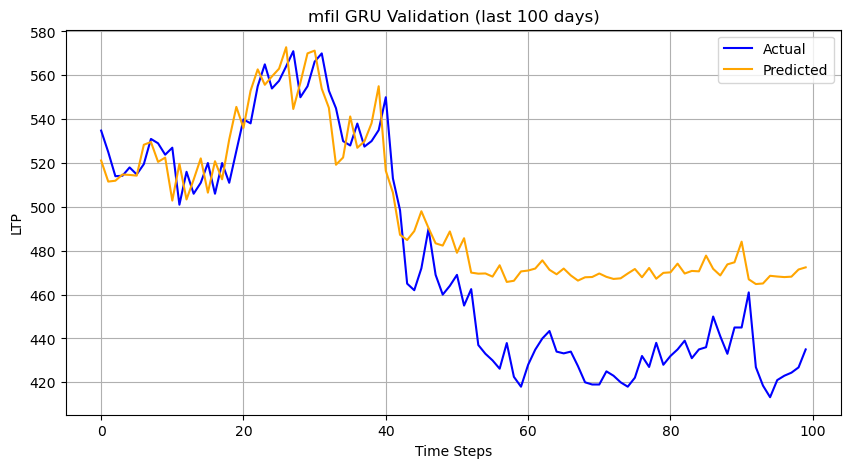

✅ Saved plot for mfil to plots/radhi.png
✅ MHL → Predicted LTP: 375.40


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mhl:
  MAE: 15.46
  RMSE: 18.79
  R2: 0.624
  MAPE: 4.89%


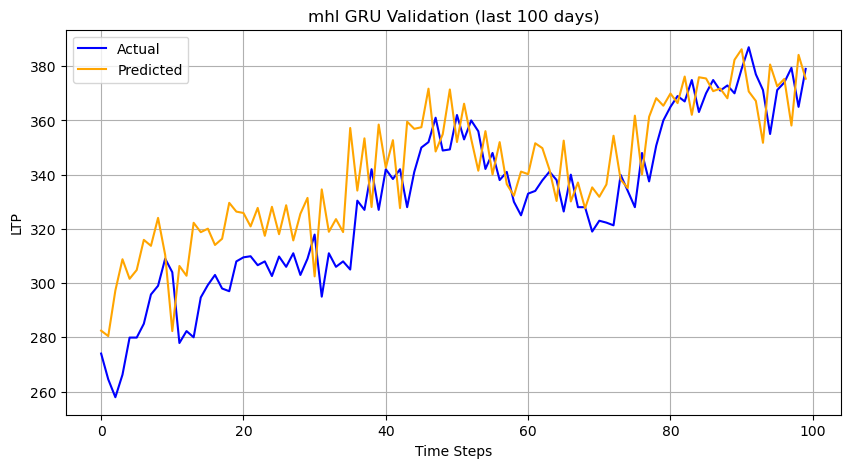

✅ Saved plot for mhl to plots/radhi.png
✅ MHNL → Predicted LTP: 216.86


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mhnl:
  MAE: 45.32
  RMSE: 50.97
  R2: -1.745
  MAPE: 16.77%


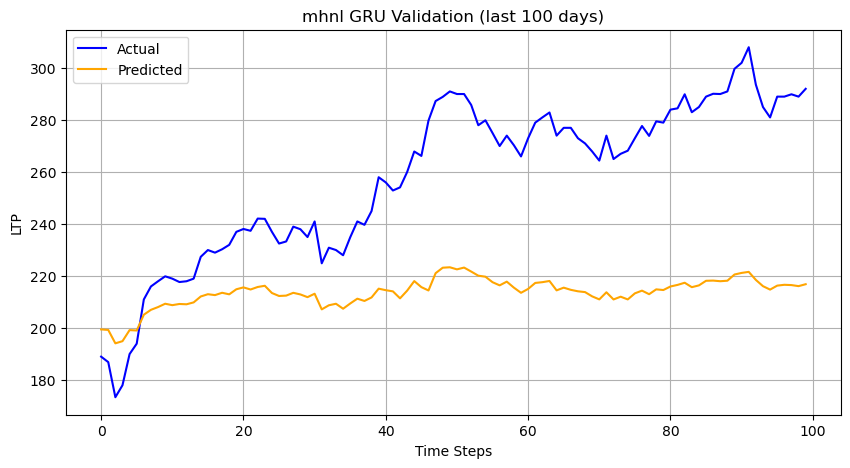

✅ Saved plot for mhnl to plots/radhi.png
✅ MKCL → Predicted LTP: 818.54


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mkcl:
  MAE: 125.53
  RMSE: 193.18
  R2: 0.123
  MAPE: 26.98%


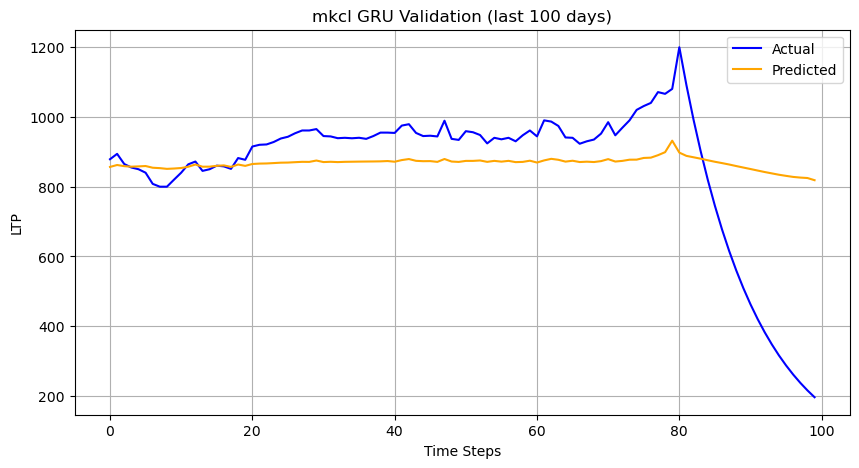

✅ Saved plot for mkcl to plots/radhi.png
✅ MKHC → Predicted LTP: 320.00


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mkhc:
  MAE: 8.44
  RMSE: 10.83
  R2: 0.845
  MAPE: 3.37%


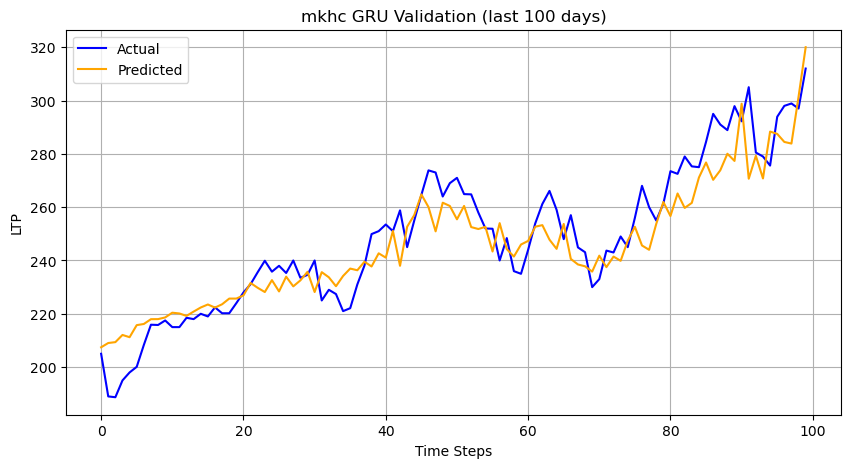

✅ Saved plot for mkhc to plots/radhi.png
✅ MKHL → Predicted LTP: 299.91


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mkhl:
  MAE: 22.31
  RMSE: 27.26
  R2: -0.454
  MAPE: 8.57%


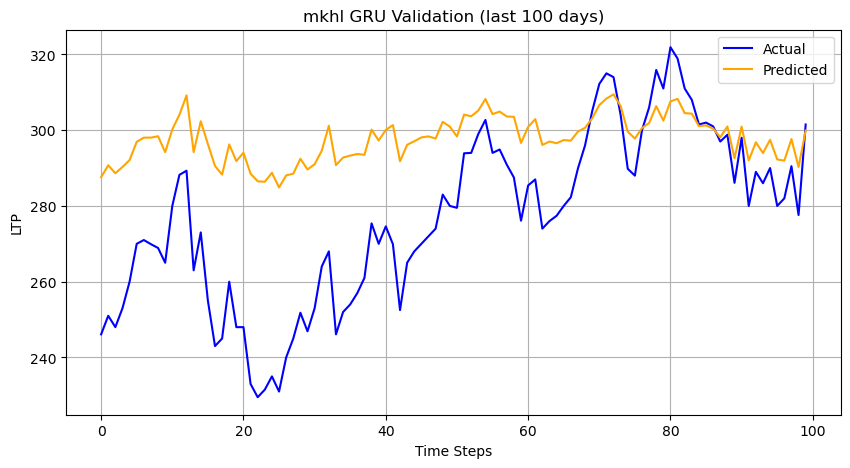

✅ Saved plot for mkhl to plots/radhi.png
✅ MKJC → Predicted LTP: 392.32


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mkjc:
  MAE: 18.38
  RMSE: 21.74
  R2: 0.061
  MAPE: 4.65%


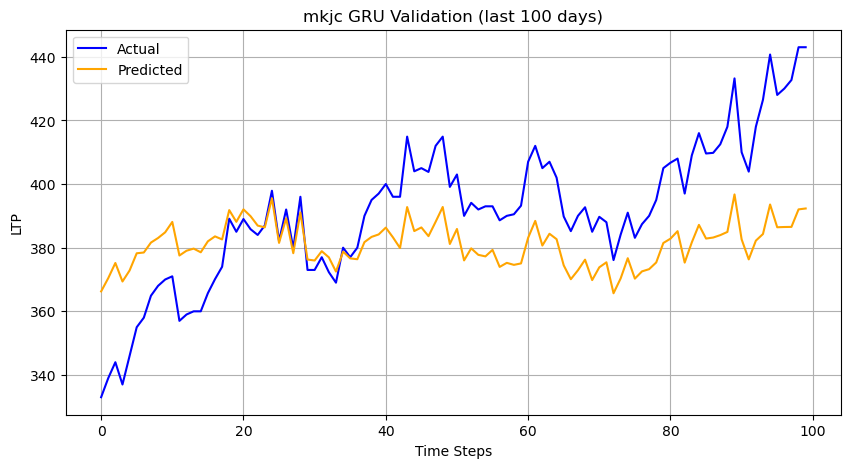

✅ Saved plot for mkjc to plots/radhi.png
✅ MLBBL → Predicted LTP: 766.64


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mlbbl:
  MAE: 28.29
  RMSE: 39.86
  R2: 0.858
  MAPE: 3.35%


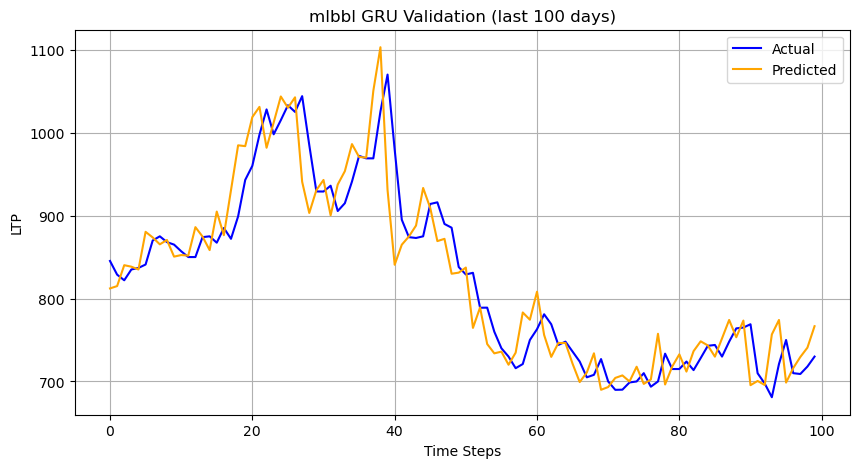

✅ Saved plot for mlbbl to plots/radhi.png
✅ MLBL → Predicted LTP: 315.02


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mlbl:
  MAE: 12.11
  RMSE: 14.79
  R2: 0.257
  MAPE: 3.75%


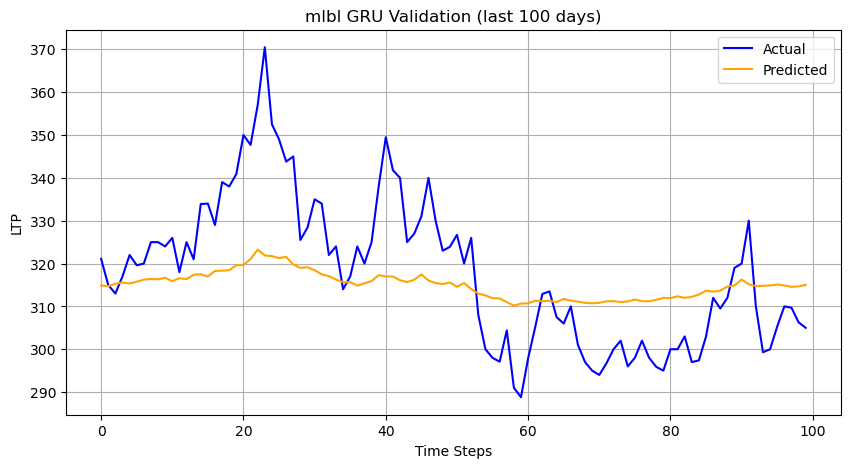

✅ Saved plot for mlbl to plots/radhi.png
✅ MLBS → Predicted LTP: 759.02


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mlbs:
  MAE: 23.96
  RMSE: 30.73
  R2: 0.489
  MAPE: 3.17%


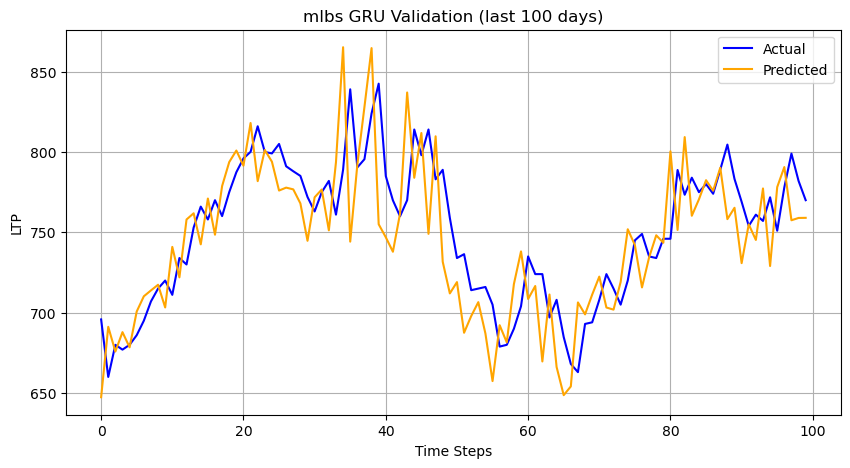

✅ Saved plot for mlbs to plots/radhi.png
✅ MLBSL → Predicted LTP: 2053.00


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mlbsl:
  MAE: 26.09
  RMSE: 37.96
  R2: 0.869
  MAPE: 1.33%


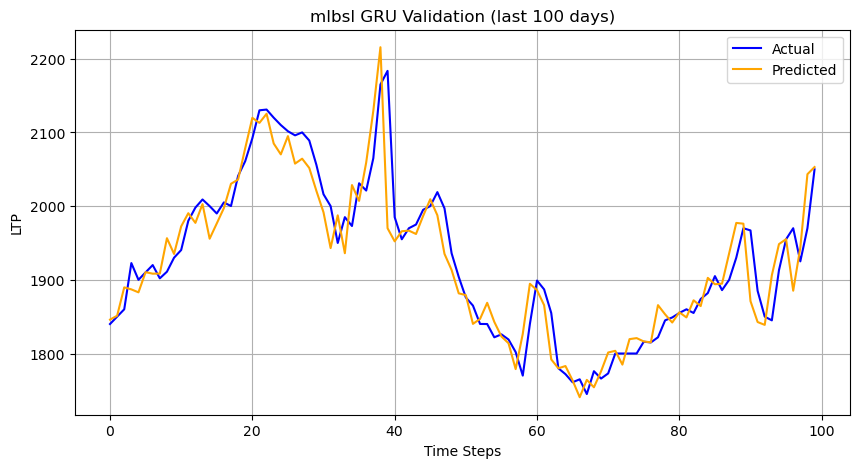

✅ Saved plot for mlbsl to plots/radhi.png
✅ MMKJL → Predicted LTP: 448.10


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mmkjl:
  MAE: 90.92
  RMSE: 100.64
  R2: -1.843
  MAPE: 26.47%


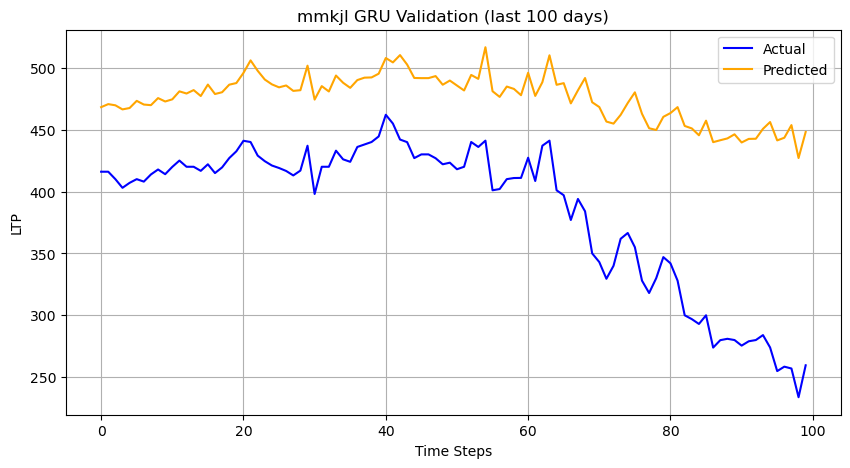

✅ Saved plot for mmkjl to plots/radhi.png
✅ MNBBL → Predicted LTP: 394.24


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mnbbl:
  MAE: 4.73
  RMSE: 6.46
  R2: 0.709
  MAPE: 1.17%


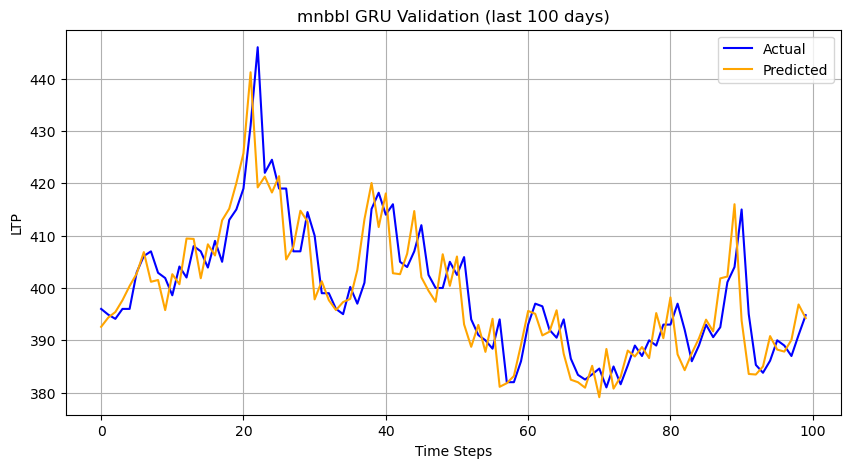

✅ Saved plot for mnbbl to plots/radhi.png
✅ MPFL → Predicted LTP: 327.35


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mpfl:
  MAE: 10.67
  RMSE: 13.08
  R2: 0.847
  MAPE: 3.26%


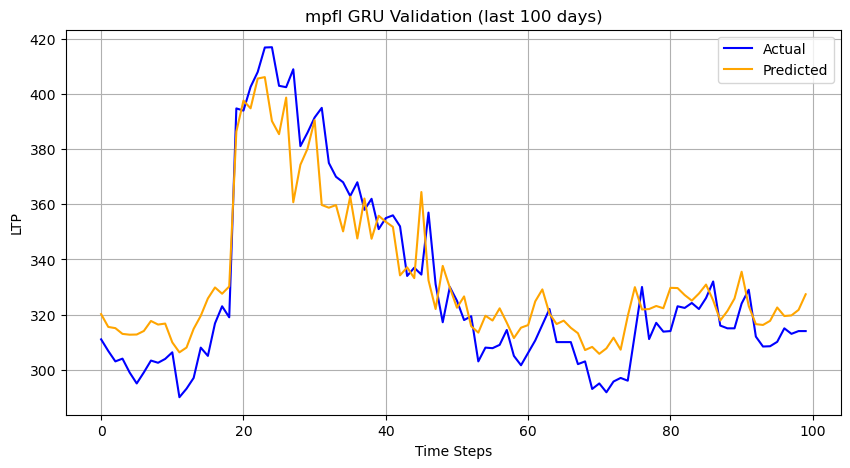

✅ Saved plot for mpfl to plots/radhi.png
✅ MSHL → Predicted LTP: 630.39


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mshl:
  MAE: 132.69
  RMSE: 172.54
  R2: -0.401
  MAPE: 34.69%


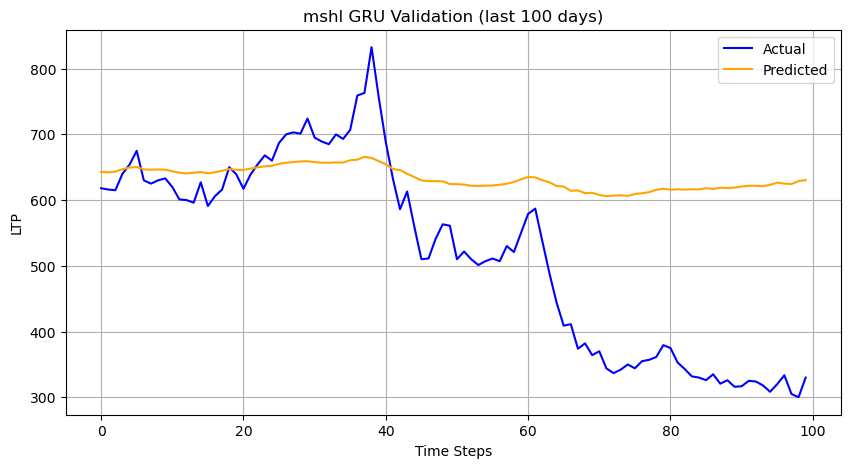

✅ Saved plot for mshl to plots/radhi.png
✅ MSLB → Predicted LTP: 889.94


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for mslb:
  MAE: 94.04
  RMSE: 106.89
  R2: -1.384
  MAPE: 12.65%


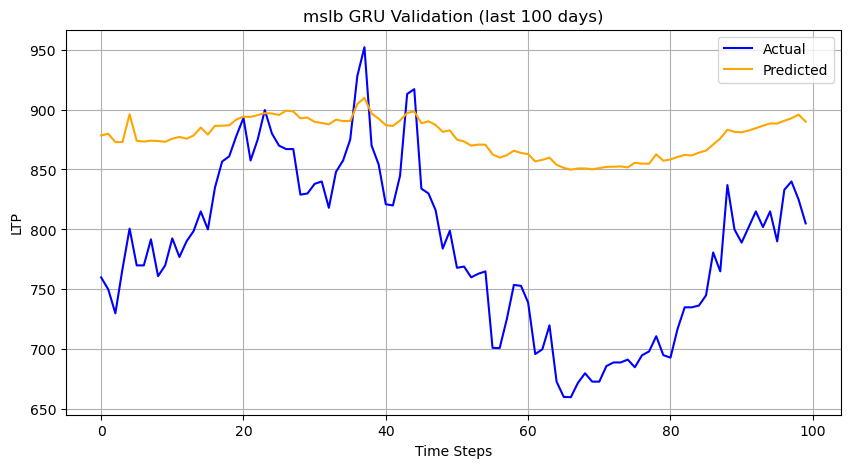

✅ Saved plot for mslb to plots/radhi.png
✅ NABBC → Predicted LTP: 374.95


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nabbc:
  MAE: 14.32
  RMSE: 18.87
  R2: 0.042
  MAPE: 3.55%


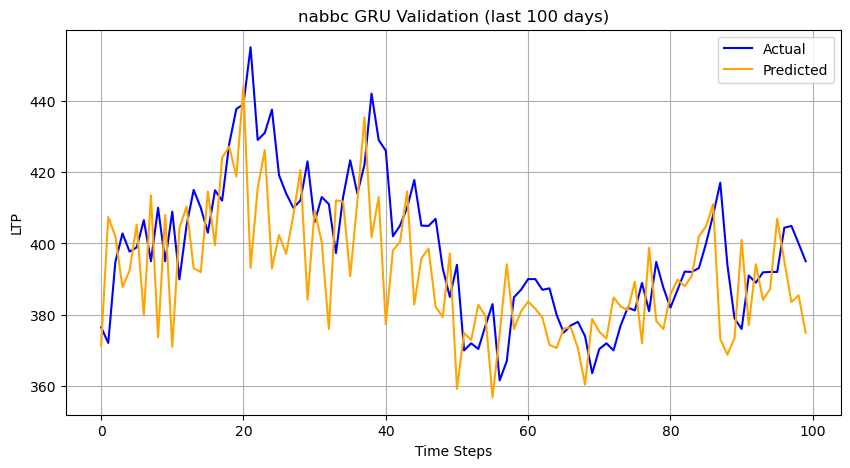

✅ Saved plot for nabbc to plots/radhi.png
✅ NABIL → Predicted LTP: 587.50


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nabil:
  MAE: 5.63
  RMSE: 8.09
  R2: 0.628
  MAPE: 0.93%


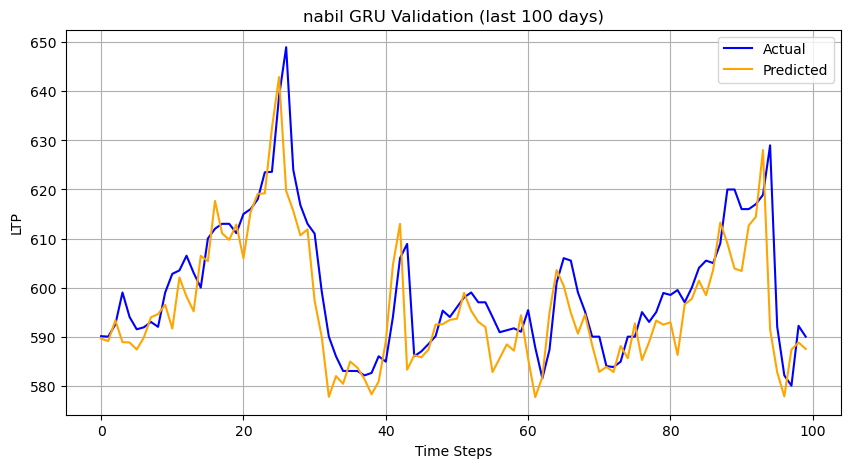

✅ Saved plot for nabil to plots/radhi.png
✅ NADEP → Predicted LTP: 529.76


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nadep:
  MAE: 16.57
  RMSE: 21.91
  R2: 0.732
  MAPE: 2.89%


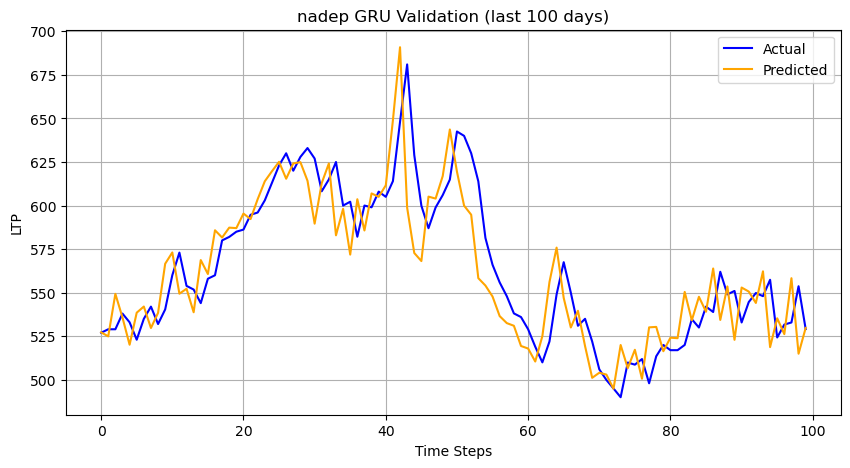

✅ Saved plot for nadep to plots/radhi.png
✅ NBL → Predicted LTP: 251.93


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nbl:
  MAE: 3.30
  RMSE: 4.42
  R2: 0.268
  MAPE: 1.29%


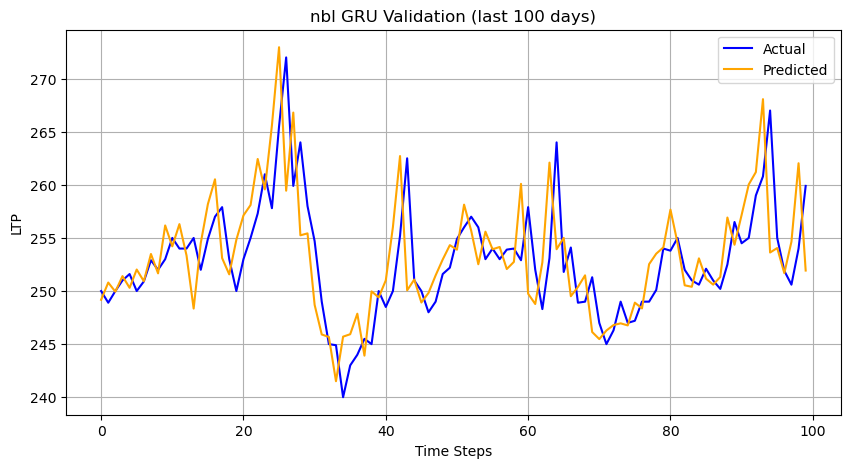

✅ Saved plot for nbl to plots/radhi.png
✅ NESDO → Predicted LTP: 238.26


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nesdo:
  MAE: 27.36
  RMSE: 37.87
  R2: -52.828
  MAPE: 10.78%


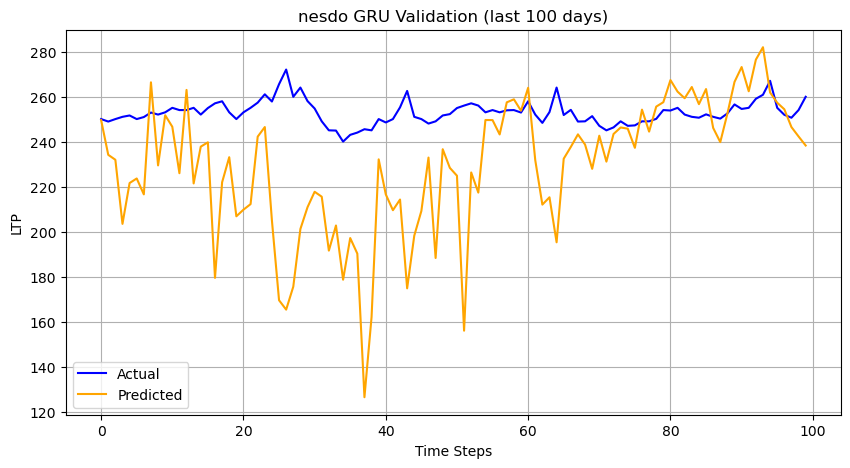

✅ Saved plot for nesdo to plots/radhi.png
✅ NFS → Predicted LTP: 316.19


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nfs:
  MAE: 20.55
  RMSE: 22.74
  R2: 0.382
  MAPE: 6.96%


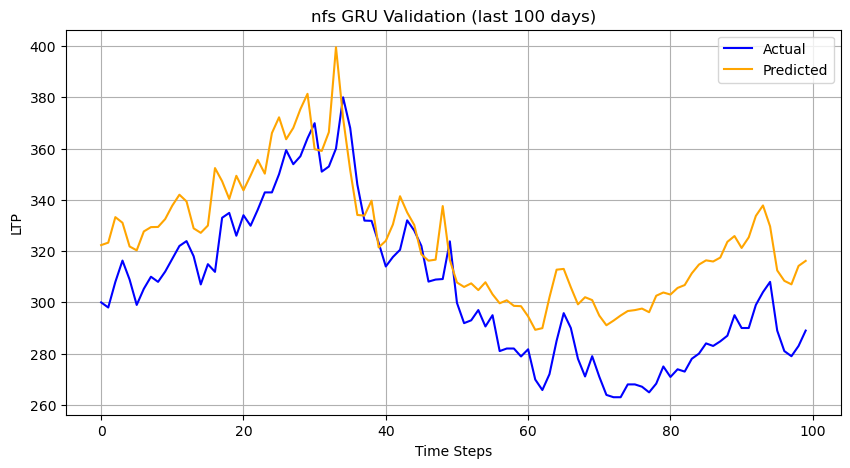

✅ Saved plot for nfs to plots/radhi.png
✅ NGPL → Predicted LTP: 344.63


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for ngpl:
  MAE: 6.06
  RMSE: 8.37
  R2: 0.624
  MAPE: 1.92%


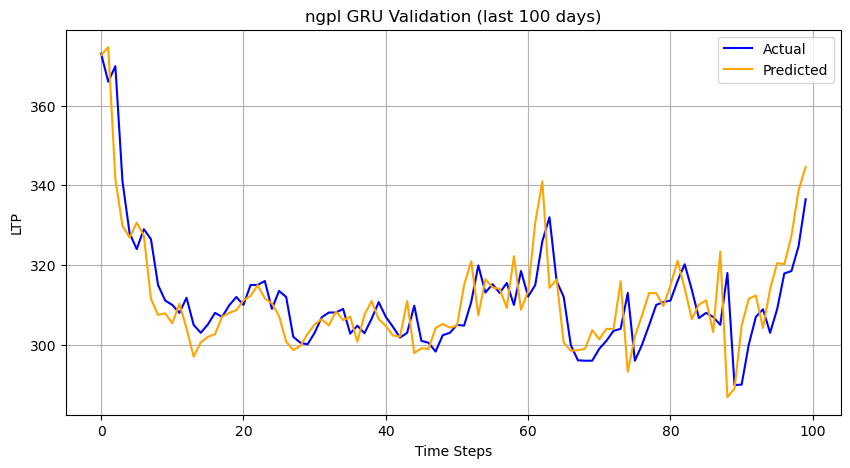

✅ Saved plot for ngpl to plots/radhi.png
✅ NHDL → Predicted LTP: 379.76


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nhdl:
  MAE: 9.77
  RMSE: 12.29
  R2: 0.568
  MAPE: 2.61%


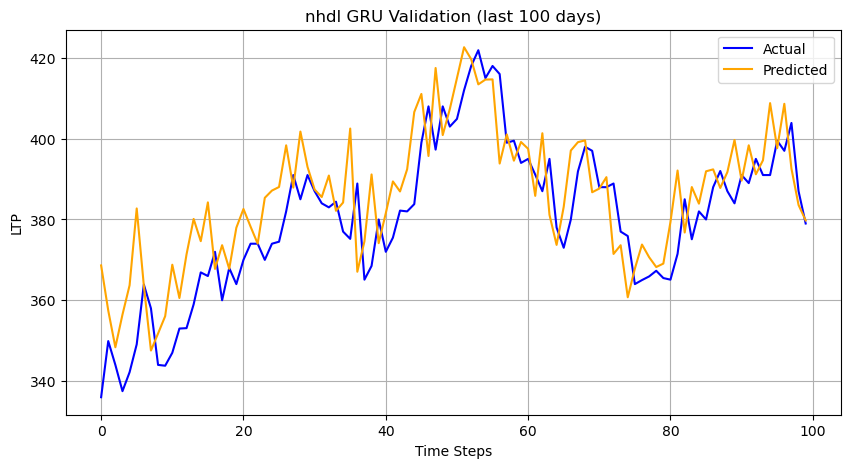

✅ Saved plot for nhdl to plots/radhi.png
✅ NHPC → Predicted LTP: 220.70


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nhpc:
  MAE: 4.08
  RMSE: 6.02
  R2: 0.956
  MAPE: 2.04%


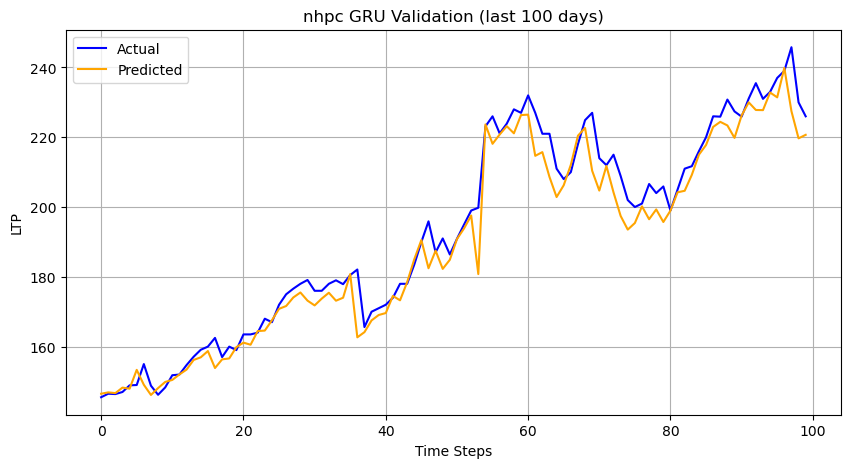

✅ Saved plot for nhpc to plots/radhi.png
✅ NICA → Predicted LTP: 655.68


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nica:
  MAE: 42.24
  RMSE: 43.42
  R2: -0.459
  MAPE: 5.61%


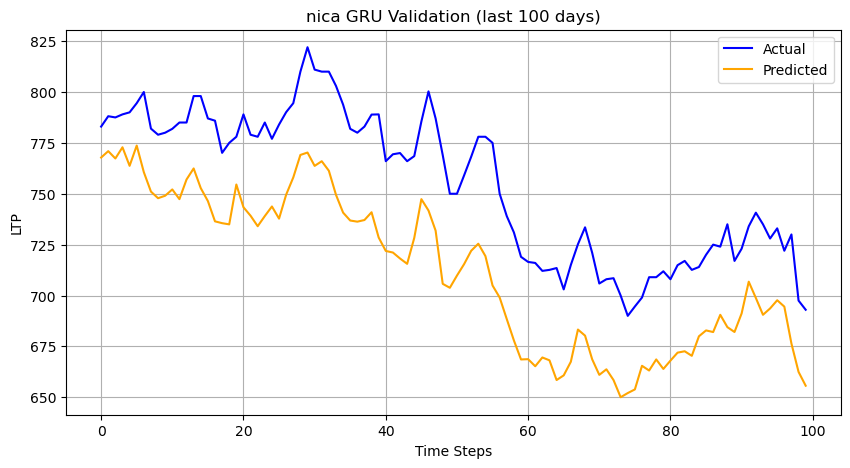

✅ Saved plot for nica to plots/radhi.png
✅ NICL → Predicted LTP: 715.24


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nicl:
  MAE: 82.83
  RMSE: 113.05
  R2: 0.222
  MAPE: 14.69%


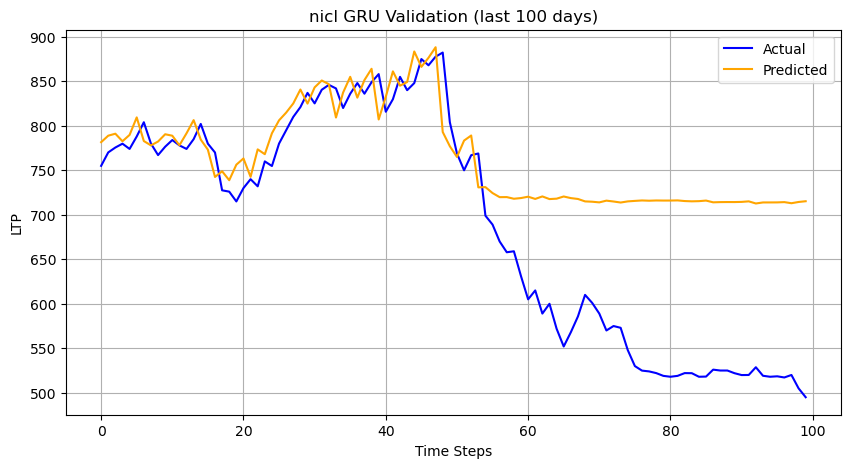

✅ Saved plot for nicl to plots/radhi.png
✅ NICLBSL → Predicted LTP: 568.60


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for niclbsl:
  MAE: 12.16
  RMSE: 16.19
  R2: 0.945
  MAPE: 1.91%


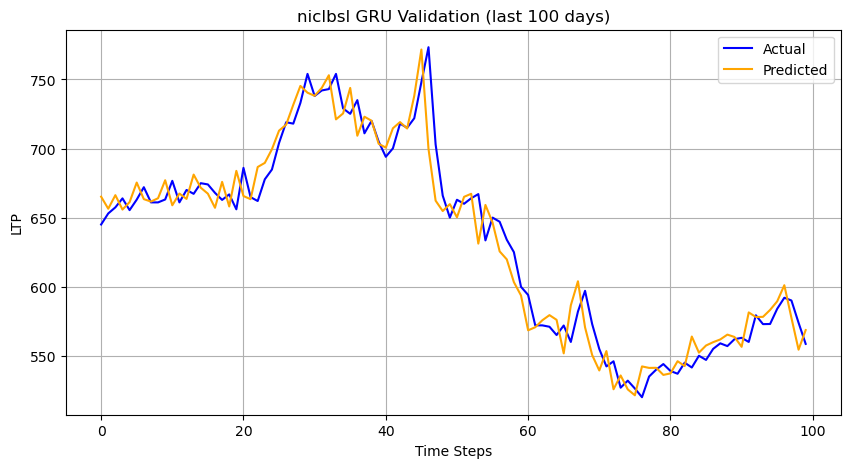

✅ Saved plot for niclbsl to plots/radhi.png
✅ NIFRA → Predicted LTP: 205.75


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nifra:
  MAE: 3.37
  RMSE: 4.23
  R2: 0.780
  MAPE: 1.56%


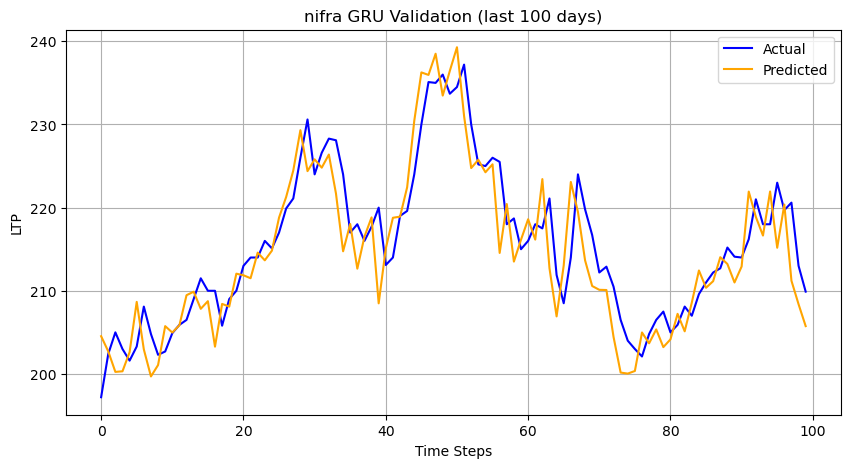

✅ Saved plot for nifra to plots/radhi.png
✅ NIL → Predicted LTP: 740.26


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nil:
  MAE: 14.14
  RMSE: 16.71
  R2: 0.936
  MAPE: 1.73%


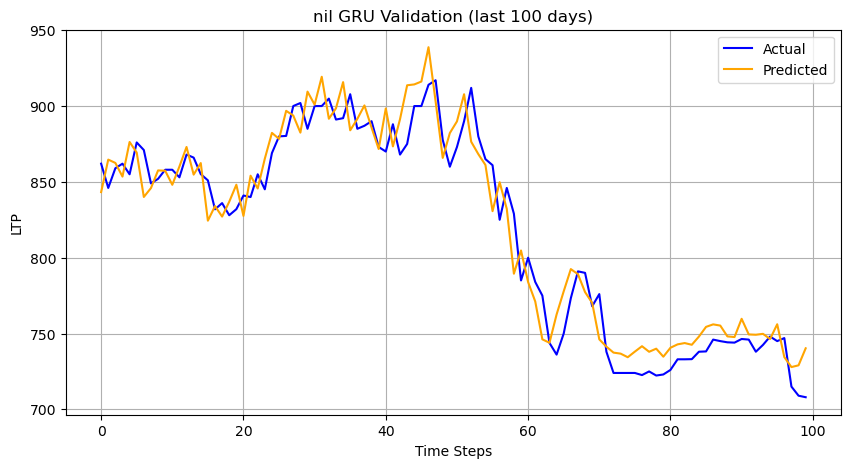

✅ Saved plot for nil to plots/radhi.png
✅ NIMB → Predicted LTP: 183.81


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nimb:
  MAE: 3.16
  RMSE: 4.72
  R2: 0.533
  MAPE: 1.71%


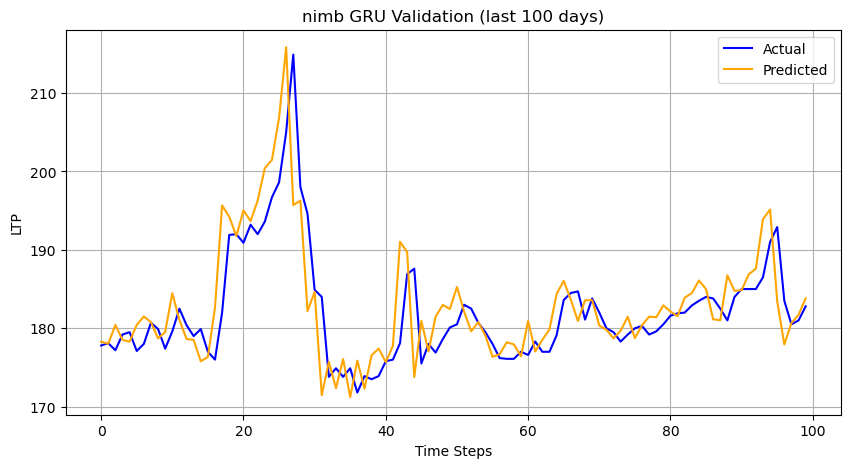

✅ Saved plot for nimb to plots/radhi.png
✅ NLG → Predicted LTP: 741.50


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nlg:
  MAE: 14.42
  RMSE: 17.25
  R2: 0.934
  MAPE: 1.78%


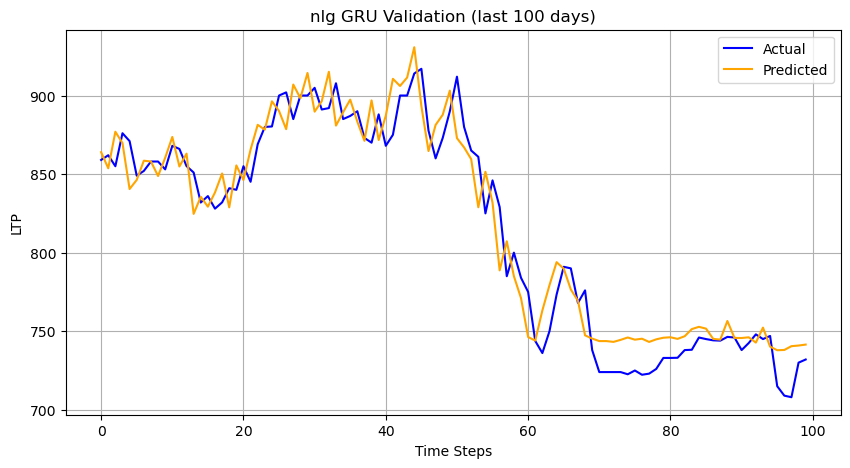

✅ Saved plot for nlg to plots/radhi.png
✅ NLICL → Predicted LTP: 558.61


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nlicl:
  MAE: 9.54
  RMSE: 12.82
  R2: 0.848
  MAPE: 1.55%


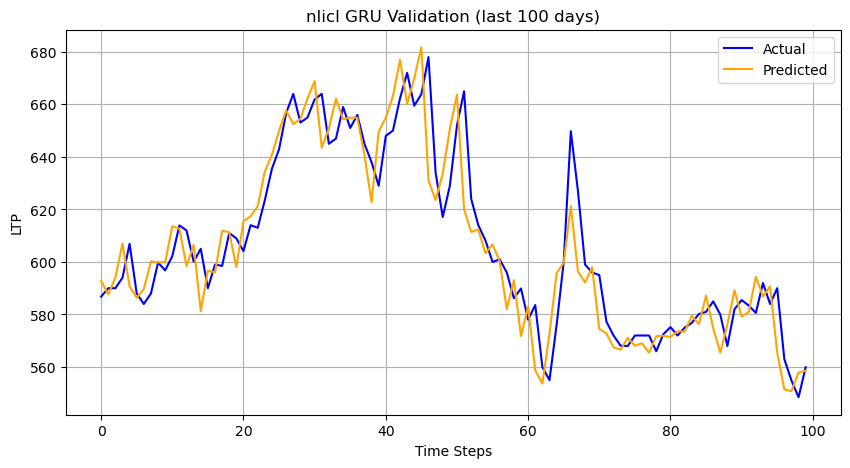

✅ Saved plot for nlicl to plots/radhi.png
✅ NLO → Predicted LTP: 197.59
⚠️ Not enough data to validate nlo
✅ NMB → Predicted LTP: 219.21


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nmb:
  MAE: 3.02
  RMSE: 4.11
  R2: 0.529
  MAPE: 1.30%


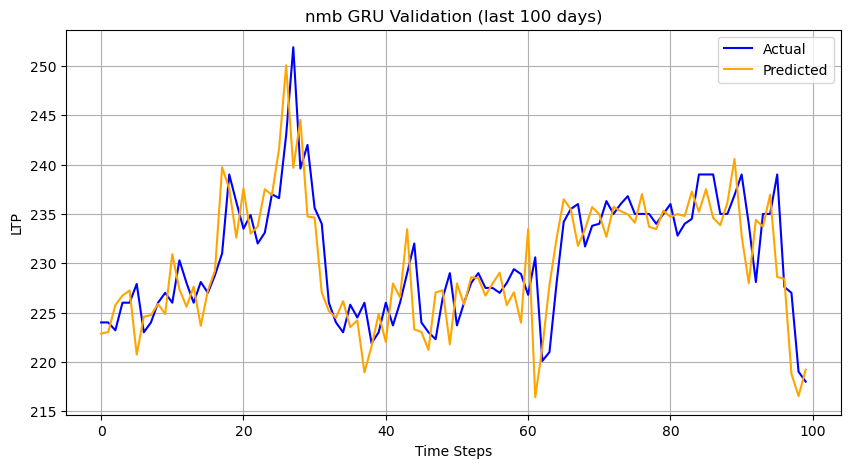

✅ Saved plot for nmb to plots/radhi.png
✅ NMBMF → Predicted LTP: 538.05


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nmbmf:
  MAE: 27.31
  RMSE: 32.64
  R2: 0.656
  MAPE: 4.75%


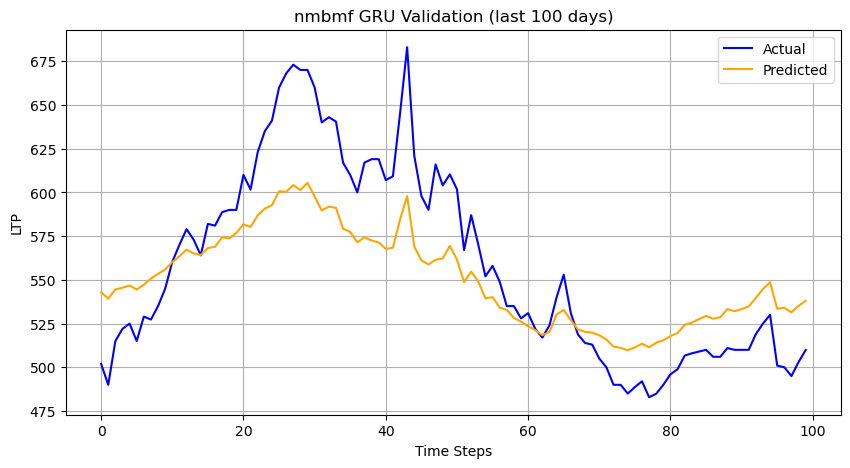

✅ Saved plot for nmbmf to plots/radhi.png
✅ NMFBS → Predicted LTP: 1246.70


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nmfbs:
  MAE: 235.37
  RMSE: 279.28
  R2: -0.860
  MAPE: 16.30%


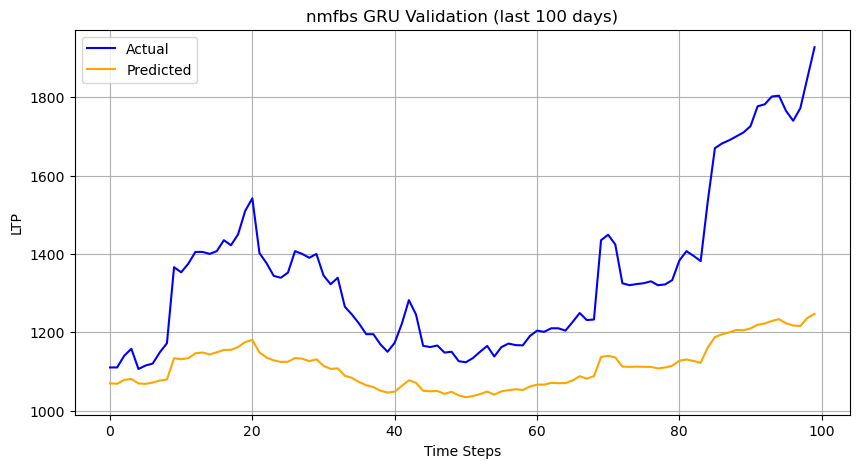

✅ Saved plot for nmfbs to plots/radhi.png
✅ NMIC → Predicted LTP: 365.65
⚠️ Not enough data to validate nmic
✅ NMLBBL → Predicted LTP: 602.57


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nmlbbl:
  MAE: 16.08
  RMSE: 22.34
  R2: 0.895
  MAPE: 2.07%


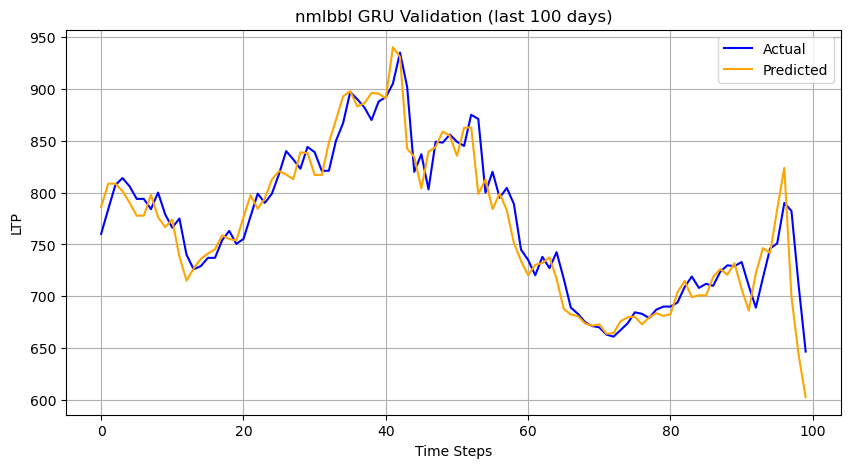

✅ Saved plot for nmlbbl to plots/radhi.png
✅ NRIC → Predicted LTP: 733.51


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nric:
  MAE: 15.14
  RMSE: 20.97
  R2: 0.666
  MAPE: 2.05%


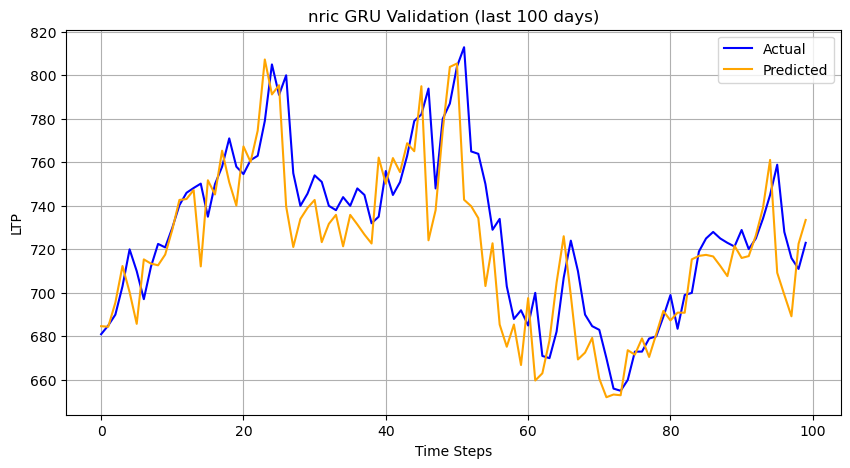

✅ Saved plot for nric to plots/radhi.png
✅ NRM → Predicted LTP: 338.98


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for nrm:
  MAE: 74.15
  RMSE: 78.11
  R2: -0.163
  MAPE: 29.16%


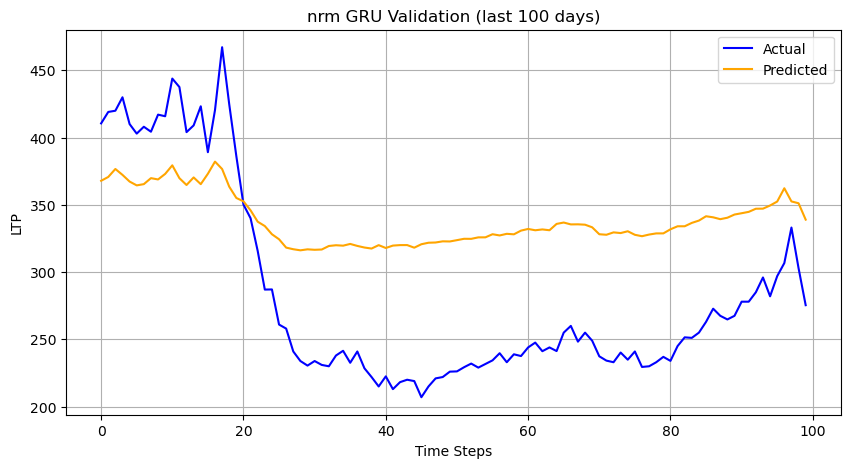

✅ Saved plot for nrm to plots/radhi.png
✅ RADHI → Predicted LTP: 252.43


C:\Users\Sanskriti Poudel\New folder\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


📊 Validation metrics for radhi:
  MAE: 5.00
  RMSE: 6.50
  R2: 0.821
  MAPE: 2.06%


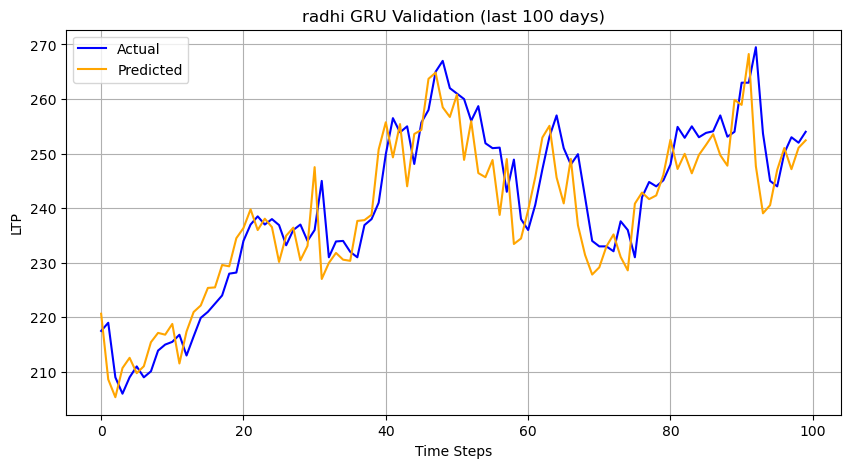

✅ Saved plot for radhi to plots/radhi.png

📈 Final Predictions:
     Symbol  Predicted LTP
0    aclbsl         643.84
1      adbl         245.70
2       ahl         431.41
3      ahpc         292.73
4     akjcl         168.75
..      ...            ...
139    nmic         365.65
140  nmlbbl         602.57
141    nric         733.51
142     nrm         338.98
143   radhi         252.43

[144 rows x 2 columns]


In [16]:
from tensorflow.keras.models import load_model
from joblib import load
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define feature columns
features = [
    '% Change', 'High', 'Low', 'Open', 'Qty.', 'Turnover',
    'SECTOR', 'EPS', 'P/E_ratio', 'bookvalue', 'PBV',
    'SHARESOUTSTANDING', 'SENTIMENT_SCORE', 'RSI', 'MACD', 'MACD_signal'
]

model_folder = "allsavedmodels/gru_fundamental"
sentiment_score = -10
predictions = {}

for symbol, df in all_stocks.items():
    if symbol not in df1.index:
        print(f"⚠️ No fundamental data for {symbol}")
        continue

    model_path = os.path.join(model_folder, f"{symbol}_GRU.keras")
    scaler_path = os.path.join(model_folder, f"{symbol}_scaler.save")
    y_scaler_path = os.path.join(model_folder, f"{symbol}_y_scaler.save")

    if not os.path.exists(model_path) or not os.path.exists(scaler_path):
        print(f"❌ Missing model or scaler for {symbol}")
        continue

    try:
        latest = df.iloc[-1]

        if pd.isna(latest.get('RSI')) or pd.isna(latest.get('MACD')) or pd.isna(latest.get('MACD_signal')):
            print(f"⚠️ Skipping {symbol}: insufficient data for RSI/MACD")
            continue

        fund = df1.loc[symbol]

        input_row = {
            '% Change': latest['% Change'],
            'High': latest['High'],
            'Low': latest['Low'],
            'Open': latest['Open'],
            'Qty.': latest['Qty.'],
            'Turnover': latest['Turnover'],
            'SECTOR': sector_encoder.transform([fund['Sector']])[0],
            'EPS': fund['EPS'],
            'P/E_ratio': fund['P/E_ratio'],
            'bookvalue': fund['bookvalue'],
            'PBV': fund['PBV'],
            'SHARESOUTSTANDING': fund['Sharesoutstanding'],
            'SENTIMENT_SCORE': sentiment_score,
            'RSI': latest['RSI'],
            'MACD': latest['MACD'],
            'MACD_signal': latest['MACD_signal']
        }

        input_df = pd.DataFrame([input_row])
        scaler = load(scaler_path)
        X = scaler.transform(input_df[features].values)
        X = np.expand_dims(X, axis=1)

        model = load_model(model_path)
        pred = model.predict(X, verbose=0)[0][0]

        if os.path.exists(y_scaler_path):
            y_scaler = load(y_scaler_path)
            pred = y_scaler.inverse_transform([[pred]])[0][0]

        pred = max(pred, 0)
        predictions[symbol] = round(pred, 2)
        print(f"✅ {symbol.upper()} → Predicted LTP: {pred:.2f}")

        # ✅ validation block for last 100 data points
        test_size = 100
        if len(df) >= test_size:
            test_df = df.tail(test_size).copy()
            # fill in fundamental columns for each row
            test_df['SECTOR'] = sector_encoder.transform([fund['Sector']])[0]
            test_df['EPS'] = fund['EPS']
            test_df['P/E_ratio'] = fund['P/E_ratio']
            test_df['bookvalue'] = fund['bookvalue']
            test_df['PBV'] = fund['PBV']
            test_df['SHARESOUTSTANDING'] = fund['Sharesoutstanding']
            test_df['SENTIMENT_SCORE'] = sentiment_score

            X_test = test_df[features].copy()
            X_scaled = scaler.transform(X_test)
            X_scaled = np.expand_dims(X_scaled, axis=1)

            y_test = test_df['LTP'].values
            y_test_scaled = y_scaler.transform(y_test.reshape(-1, 1))

            y_pred_scaled = model.predict(X_scaled, verbose=0)
            y_pred = y_scaler.inverse_transform(y_pred_scaled)

            y_test_flat = y_test
            y_pred_flat = y_pred.flatten()

            mae = mean_absolute_error(y_test_flat, y_pred_flat)
            mse = mean_squared_error(y_test_flat, y_pred_flat)
            rmse = mse**0.5
            r2 = r2_score(y_test_flat, y_pred_flat)
            mape = np.mean(np.abs((y_test_flat - y_pred_flat)/(y_test_flat + 1e-8))) * 100

            print(f"📊 Validation metrics for {symbol}:")
            print(f"  MAE: {mae:.2f}")
            print(f"  RMSE: {rmse:.2f}")
            print(f"  R2: {r2:.3f}")
            print(f"  MAPE: {mape:.2f}%")

            plt.figure(figsize=(10,5))
            plt.plot(y_test_flat, label="Actual", color="blue")
            plt.plot(y_pred_flat, label="Predicted", color="orange")
            plt.title(f"{symbol} GRU Validation (last {test_size} days)")
            plt.xlabel("Time Steps")
            plt.ylabel("LTP")
            plt.legend()
            plt.grid(True)
            plt.show()
            # os.makedirs("plots", exist_ok=True)
            # plot_filename = f"plots/{symbol}.png"
            # plt.savefig(plot_filename, dpi=300, bbox_inches="tight")
            # plt.close()

            print(f"✅ Saved plot for {symbol} to {plot_filename}")

        else:
            print(f"⚠️ Not enough data to validate {symbol}")

    except Exception as e:
        print(f"⚠️ Error for {symbol}: {e}")

# Save predictions
pred_df = pd.DataFrame(predictions.items(), columns=["Symbol", "Predicted LTP"])
print("\n📈 Final Predictions:")
print(pred_df)
pred_df.to_excel("predicted_next_day_LTP.xlsx", index=False)

